# EXPLAINABLE GENERATIVE ARTIFICIAL INTELLIGENCE FOR ENHANCED SENTIMENT ANALYSIS

This notebook implements the complete pipeline described in my Master's Thesis in Data Science. The pipeline is fully reproducible, well-documented, and secure. It covers every stage from data preprocessing and model fine-tuning to explanation generation, evaluation, and visualization.

---

## Overview

- **Data Preprocessing:**  
  Robust cleaning and normalization of text data from three domains—IMDb, Amazon Reviews, and Twitter Sentiment140—using techniques such as:
  - HTML removal (using BeautifulSoup)
  - Contraction expansion (via the `contractions` package)
  - URL removal and text normalization (with regex)
  - Tweet-specific processing (removing mentions, stripping '#' from hashtags while retaining the words, and converting emojis to descriptive text)

- **Model Fine-Tuning:**  
  Fine-tuning a pre-fine-tuned DistilBERT classifier (`distilbert-base-uncased-finetuned-sst-2-english`) on domain-specific datasets:
  - **Twitter & Amazon:** 25,000-example random subsets with a 90/10 train/validation split.
  - **IMDb:** Full official 25K/25K split.
  
  Training settings include a per-device batch size of 32, gradient accumulation steps of 2, maximum sequence length of 96 tokens, mixed precision enabled (`fp16=True`), checkpointing every 250 steps, and early stopping.  
  **Saved Models & Tokenizer:**  
  - Twitter model: `${models_dir}/fine_tuned_distilbert_twitter`  
  - Amazon model: `${models_dir}/fine_tuned_distilbert_amazon`  
  - IMDb model: `${models_dir}/fine_tuned_distilbert_imdb`  
  - Tokenizer: `${models_dir}/fine_tuned_distilbert_tokenizer`

- **Explanation Generation:**  
  Multi-layered explanations are generated using four methods:
  - **GPT-4o-mini:** Generates narrative, context-aware explanations via the OpenAI API.
  - **LIME:** Provides local, token-level explanations with word contribution weights.
  - **SHAP:** Computes SHAP values using a custom partition-based approach.
  - **Abstractive Summarization:** Produces concise, rephrased summaries using a DistilBART model (e.g., "facebook/bart-large-cnn").
  
  **Output Files:**  
  - Domain-specific explanations:  
    - `${output_dir}/imdb_explanations.json`
    - `${output_dir}/amazon_explanations.json`
    - `${output_dir}/twitter_explanations.json`
  - Integrated explanations: `${output_dir}/integrated_explanations.json`  
  - Gold standard explanations:  
    - `${output_dir}/gold_standard_explanations_imdb.json`  
    - `${output_dir}/gold_standard_explanations_amazon.json`  
    - `${output_dir}/gold_standard_explanations_twitter.json`

- **Evaluation of Explanations:**  
  Explanations are evaluated using several metrics:
  - **Reference-Based Metrics:**  
    - BLEU and ROUGE (ROUGE-1 and ROUGE-L)  
      - *GPT Explanations:* BLEU ~25–26; ROUGE-1 F1 ~0.60; ROUGE-L F1 ~0.31–0.32  
      - *Abstractive Summaries:* BLEU (IMDb 0.28, Amazon 0.37, Twitter 0.05); ROUGE-1 F1 (IMDb 0.18, Amazon 0.22, Twitter 0.17); ROUGE-L F1 (IMDb 0.13, Amazon 0.17, Twitter 0.15)
  - **Semantic Similarity (BERTScore):**  
    - *GPT Explanations:* BERTScore F1 ~0.902–0.904  
    - *Abstractive Summaries:* BERTScore F1 ~0.822–0.833
  - **Local Explanation Metrics:**  
    - *LIME Metrics:*  
      - Fidelity: IMDb ~ -0.0616, Amazon ~ -0.0755, Twitter ~ -0.0256 (Overall: -0.0542)  
      - Sufficiency: IMDb ~ 0.0734, Amazon ~ 0.0260, Twitter ~ 0.0642 (Overall: 0.0545)  
      - Comprehensiveness: IMDb ~ -0.0741, Amazon ~ -0.0653, Twitter ~ -0.0184 (Overall: -0.0526)
    - *SHAP Metrics:*  
      - Fidelity: IMDb ~ 0.0015, Amazon ~ 0.0054, Twitter ~ -0.0062 (Overall: 0.0002)  
      - Sufficiency (Overall): ~ -0.0187  
      - Comprehensiveness: IMDb ~ 0.0015, Amazon ~ 0.0054, Twitter ~ -0.0062 (Overall: 0.0002)
  
  All evaluation metrics are aggregated and saved to:  
  `${output_dir}/final_evaluation_results.json`

- **Visualization:**  
  The code produces various visualizations to compare evaluation metrics:
  - **GPT Explanations:**  
    - BLEU, ROUGE, and BERTScore plots saved as:  
      - `${visualization_dir}/BLEU_GPT.png`  
      - `${visualization_dir}/ROUGE1_GPT.png`  
      - `${visualization_dir}/ROUGEL_GPT.png`  
      - `${visualization_dir}/BERTScore_F1_GPT.png`  
      - `${visualization_dir}/BERTScore_Precision_GPT.png`  
      - `${visualization_dir}/BERTScore_Recall_GPT.png`
  - **Abstractive Summaries:**  
    - Plots saved as:  
      - `${visualization_dir}/BLEU_Abstractive.png`  
      - `${visualization_dir}/ROUGE1_Abstractive.png`  
      - `${visualization_dir}/ROUGEL_Abstractive.png`  
      - `${visualization_dir}/BERTScore_F1_Abstractive.png`  
      - `${visualization_dir}/BERTScore_Precision_Abstractive.png`  
      - `${visualization_dir}/BERTScore_Recall_Abstractive.png`
  - **Local Explanation Metrics:**  
    - LIME:  
      - `${visualization_dir}/LIME_Fidelity.png`  
      - `${visualization_dir}/LIME_Sufficiency.png`  
      - `${visualization_dir}/LIME_Comprehensiveness.png`
    - SHAP:  
      - `${visualization_dir}/SHAP_Fidelity.png`  
      - `${visualization_dir}/SHAP_Sufficiency.png`  
      - `${visualization_dir}/SHAP_Comprehensiveness.png`
  - **Grouped Comparisons:**  
    - Grouped charts comparing GPT vs. Abstractive (e.g., `${visualization_dir}/Comparison_BLEU_GPT_vs_Abstractive.png`)  
    - LIME vs. SHAP (e.g., `${visualization_dir}/Comparison_Fidelity_LIME_vs_SHAP.png`)

---

## Reproducibility & Security

- **Reproducibility:**  
  All code, datasets, models, explanations, and evaluation outputs are stored in clearly defined directories. Random sampling (up to 300 samples per domain) and consistent checkpointing ensure reproducibility.
  
- **Security:**  
  Sensitive API keys are not hard-coded; they are loaded securely from a `.env` file (which is listed in `.gitignore`). Users must create their own `.env` file with the necessary API key:



## 1. Environment Setup

In this section, we install all necessary packages, import required libraries, configure the runtime (including GPU acceleration), and download essential NLTK resources. This setup ensures our working environment is fully prepared for every stage of the pipeline—from data preprocessing and model fine-tuning to explanation generation, evaluation, and visualization.

**Key Actions:**
- **Package Installation:**  
  Install required packages including:
  - `transformers`, `datasets`, `torch`, `openai` (for GPT-4o-mini integration), `nltk`, `beautifulsoup4`, `lxml`, `lime`, `sacrebleu`, `shap`, `emoji`, `contractions`, and `bert-score`.

- **Library Imports:**  
  Import libraries for deep learning (PyTorch, Hugging Face Transformers), text processing (NLTK, BeautifulSoup, regex), evaluation (sacrebleu, rouge_score, bert-score), visualization (pandas, matplotlib, seaborn), and more.

- **Runtime Configuration:**  
  - Configure the device to use GPU acceleration if available.
  - Clear GPU caches and run garbage collection to optimize memory usage.
  - Mount Google Drive for saving and loading datasets, models, and evaluation outputs.

- **NLTK Resources:**  
  Download necessary NLTK datasets (e.g., stopwords, wordnet, omw-1.4) to support text preprocessing.

- **API Key Security:**  
  Ensure that sensitive API keys (e.g., for OpenAI) are loaded securely from a `.env` file using `python-dotenv`. **Do not hard-code your API keys.** Make sure the `.env` file is included in your `.gitignore`.

Before running the subsequent cells, please verify that your environment is set up correctly and that your API keys and dependencies are configured as described.


In [6]:
import os
from dotenv import load_dotenv

# Load variables from the .env file
load_dotenv()

# Retrieve the API key from the environment
openai_api_key = os.environ.get("OPENAI_API_KEY")
if not openai_api_key:
    raise ValueError("OPENAI_API_KEY not set. Please check your .env file.")

# Set the API key for OpenAI
import openai
openai.api_key = openai_api_key

print("API key loaded successfully!")


API key loaded successfully!


In [1]:
# Install required packages (with openai pinned to version 0.28)
!pip install transformers datasets torch openai==0.28 nltk beautifulsoup4 lxml lime sacrebleu shap emoji contractions sacrebleu rouge-score bert-score

# Import libraries and clear cache
import torch
import random
import string
import re
import gc
import nltk
from bs4 import BeautifulSoup
from collections import Counter
import torch.nn.functional as F
import openai
from datasets import load_dataset
from lime.lime_text import LimeTextExplainer
import sacrebleu
import shap

# Clear GPU cache and run garbage collection
torch.cuda.empty_cache()
gc.collect()

# Download NLTK resources: stopwords, wordnet, etc.
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
stop_words = set(stopwords.words("english"))
lemmatizer = WordNetLemmatizer()

print("Environment setup complete.")


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


Environment setup complete.


## 2. Data Preprocessing

In this section, we load and preprocess the datasets used in the project: IMDb movie reviews, Amazon Reviews (amazon_polarity), and Twitter Sentiment140. The updated preprocessing pipeline follows the methodology outlined in the thesis but has been refined to preserve essential linguistic cues for transformer-based models. This is critical for achieving high-quality fine-tuning and downstream evaluation.

**Key Steps:**

- **HTML Tag Removal & Contraction Expansion:**  
  - Remove HTML tags using BeautifulSoup.  
  - Expand contractions using the `contractions` package to standardize informal language.

- **URL Removal & Text Cleaning:**  
  - Remove URLs using regular expressions.  
  - Normalize white spaces while preserving punctuation, numbers, and stopwords to maintain syntactic and contextual integrity.

- **Tweet-Specific Processing:**  
  - Remove user mentions.  
  - Handle hashtags by removing the '#' symbol but retaining the underlying word.  
  - Convert emojis to descriptive text using an appropriate emoji conversion package.

- **Multiprocessing for Efficiency:**  
  - Use Python’s multiprocessing capabilities to speed up the preprocessing of large datasets.

- **Output Files:**  
  - Preprocessed IMDb data is saved to:  
    `${data_dir}/imdb_dataset`  
  - Preprocessed Amazon Reviews data is saved to:  
    `${data_dir}/amazon_dataset`  
  - Preprocessed Twitter Sentiment140 data is saved to:  
    `${data_dir}/twitter_dataset`

This robust preprocessing pipeline ensures that all text data is cleaned and standardized before training the sentiment classifier while preserving the natural language characteristics essential for effective fine-tuning.


In [ ]:
# ---------------------------
# Environment Setup and Imports
# ---------------------------
from datasets import load_dataset
import torch
import os
import warnings
from tqdm import tqdm
from multiprocessing import Pool
import re
import emoji
import contractions
from bs4 import BeautifulSoup, MarkupResemblesLocatorWarning
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Define base directory for saving processed datasets
base_data_dir = "data/preprocessed_datasets"
imdb_save_dir = os.path.join(base_data_dir, "imdb_dataset")
amazon_save_dir = os.path.join(base_data_dir, "amazon_dataset")
twitter_save_dir = os.path.join(base_data_dir, "twitter_dataset")

# Ensure the save directories exist
os.makedirs(base_data_dir, exist_ok=True)

# Set device for GPU acceleration (if needed)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Suppress warnings from BeautifulSoup and other libraries
warnings.filterwarnings("ignore", category=UserWarning, module="bs4")
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=MarkupResemblesLocatorWarning)

# Download necessary NLTK resources and initialize stopwords and lemmatizer
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
stop_words = set(stopwords.words("english"))
lemmatizer = WordNetLemmatizer()

print("Environment setup complete.")

# ---------------------------
# Updated Preprocessing Functions
# ---------------------------
def preprocess_text_updated(text):
    """
    Updated text preprocessing for IMDb and Amazon reviews.
    - Removes HTML tags.
    - Expands contractions (with exception handling).
    - Removes URLs.
    - Converts to lowercase.
    - Normalizes spaces.

    Punctuation, numbers, and stopwords are retained.
    """
    text = BeautifulSoup(text, "lxml").get_text()  # Remove HTML tags
    try:
        text = contractions.fix(text)  # Expand contractions
    except Exception:
        pass  # If an error occurs, skip contraction expansion
    text = re.sub(r'http\S+|www\S+', '', text, flags=re.MULTILINE)  # Remove URLs
    text = text.lower()
    text = re.sub(r'\s+', ' ', text)
    return text.strip()

def preprocess_tweet_updated(text):
    """
    Updated tweet preprocessing.
    - Removes HTML tags.
    - Expands contractions (with exception handling).
    - Removes mentions and URLs.
    - Removes '#' from hashtags (keeps the word).
    - Converts emojis to descriptive text.
    - Converts to lowercase.
    - Normalizes spaces.

    Punctuation and stopwords are retained.
    """
    text = BeautifulSoup(text, "lxml").get_text()  # Remove HTML tags
    try:
        text = contractions.fix(text)  # Expand contractions
    except Exception:
        pass  # Skip contraction expansion if error occurs
    text = re.sub(r'@\w+', '', text)  # Remove mentions
    text = re.sub(r'http\S+|www\S+', '', text, flags=re.MULTILINE)  # Remove URLs
    text = re.sub(r'#(\w+)', r'\1', text)  # Remove '#' but keep the word
    text = emoji.demojize(text, delimiters=(" ", " "))  # Convert emojis to text
    text = text.lower()
    text = re.sub(r'\s+', ' ', text)
    return text.strip()

# ---------------------------
# Batch Preprocessing Functions using the Updated Functions
# ---------------------------
def preprocess_batch_text_updated(batch, text_column="text"):
    """
    Applies the updated text preprocessing to a batch (for IMDb and Amazon datasets).
    """
    processed_texts = []
    for text in batch[text_column]:
        if isinstance(text, str) and text.strip():
            processed_texts.append(preprocess_text_updated(text))
        else:
            processed_texts.append("")
    batch["clean_text"] = processed_texts
    return batch

def preprocess_batch_tweet_updated(batch, text_column="text"):
    """
    Applies the updated tweet preprocessing to a batch (for Twitter Sentiment140).
    """
    processed_tweets = []
    for text in batch[text_column]:
        if isinstance(text, str) and text.strip():
            processed_tweets.append(preprocess_tweet_updated(text))
        else:
            processed_tweets.append("")
    batch["clean_text"] = processed_tweets
    return batch

# ---------------------------
# Multiprocessing-based Preprocessing Function
# ---------------------------
def fast_preprocess(dataset, preprocess_fn, text_column, batch_size=500, num_workers=4):
    """
    Speeds up dataset preprocessing using the built-in multiprocessing support.
    """
    dataset = dataset.map(lambda batch: preprocess_fn(batch, text_column),
                          batched=True, batch_size=batch_size, num_proc=num_workers)
    return dataset

# ---------------------------
# Preprocess and Save IMDb Dataset using save_to_disk
# ---------------------------
print("Loading IMDb dataset...")
imdb_dataset = load_dataset("imdb")
imdb_dataset = fast_preprocess(imdb_dataset, preprocess_batch_text_updated, text_column="text", batch_size=500, num_workers=4)
imdb_dataset.save_to_disk(imdb_save_dir)
print(f"✅ IMDb dataset preprocessed and saved to disk at {imdb_save_dir}.")

# ---------------------------
# Preprocess and Save Amazon Reviews Dataset using save_to_disk
# ---------------------------
print("Loading Amazon Reviews dataset...")
amazon_dataset = load_dataset("amazon_polarity")
amazon_dataset = fast_preprocess(amazon_dataset, preprocess_batch_text_updated, text_column="content", batch_size=500, num_workers=4)
amazon_dataset.save_to_disk(amazon_save_dir)
print(f"✅ Amazon Reviews dataset preprocessed and saved to disk at {amazon_save_dir}.")

# ---------------------------
# Preprocess and Save Twitter Sentiment140 Dataset using save_to_disk
# ---------------------------
print("Loading Twitter Sentiment140 dataset...")
twitter_dataset = load_dataset("sentiment140", trust_remote_code=True)
twitter_dataset = fast_preprocess(twitter_dataset, preprocess_batch_tweet_updated, text_column="text", batch_size=500, num_workers=4)
twitter_dataset.save_to_disk(twitter_save_dir)
print(f"✅ Twitter Sentiment140 dataset preprocessed and saved to disk at {twitter_save_dir}.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Environment setup complete.
Loading IMDb dataset...


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


Map (num_proc=4):   0%|          | 0/25000 [00:00<?, ? examples/s]

Map (num_proc=4):   0%|          | 0/25000 [00:00<?, ? examples/s]

Map (num_proc=4):   0%|          | 0/50000 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/25000 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/25000 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/50000 [00:00<?, ? examples/s]

✅ IMDb dataset preprocessed and saved to disk at /content/drive/MyDrive/preprocessed_datasets/imdb_dataset.
Loading Amazon Reviews dataset...


Map (num_proc=4):   0%|          | 0/3600000 [00:00<?, ? examples/s]

Map (num_proc=4):   0%|          | 0/400000 [00:00<?, ? examples/s]

Saving the dataset (0/7 shards):   0%|          | 0/3600000 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/400000 [00:00<?, ? examples/s]

✅ Amazon Reviews dataset preprocessed and saved to disk at /content/drive/MyDrive/preprocessed_datasets/amazon_dataset.
Loading Twitter Sentiment140 dataset...


README.md:   0%|          | 0.00/6.84k [00:00<?, ?B/s]

sentiment140.py:   0%|          | 0.00/4.03k [00:00<?, ?B/s]

Generating train split:   0%|          | 0/1600000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/498 [00:00<?, ? examples/s]

Map (num_proc=4):   0%|          | 0/1600000 [00:00<?, ? examples/s]

Map (num_proc=4):   0%|          | 0/498 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/1600000 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/498 [00:00<?, ? examples/s]

✅ Twitter Sentiment140 dataset preprocessed and saved to disk at /content/drive/MyDrive/preprocessed_datasets/twitter_dataset.


## 2.1 Loading Preprocessed Datasets

In this section, we load the preprocessed datasets for IMDb, Amazon Reviews, and Twitter Sentiment140 from disk. These datasets were saved during the preprocessing phase and are now reloaded using the `load_from_disk` function from the `datasets` library. This ensures that all subsequent processes, including model fine-tuning and evaluation, are performed on correctly preprocessed data.

The datasets are loaded from the following paths:
- **IMDb Dataset:** `data/preprocessed_datasets/imdb_dataset`
- **Amazon Reviews Dataset:** `data/preprocessed_datasets/amazon_dataset`
- **Twitter Sentiment140 Dataset:** `data/preprocessed_datasets/twitter_dataset`

Ensure that the preprocessed dataset files are available in the specified directories before running the following cells.


In [7]:
from datasets import load_from_disk
import os

# Define the save paths (directories) for the datasets
save_path = "data/preprocessed_datasets"
imdb_save_dir = os.path.join(save_path, "imdb_dataset")
amazon_save_dir = os.path.join(save_path, "amazon_dataset")
twitter_save_dir = os.path.join(save_path, "twitter_dataset")

# Load the IMDb dataset
imdb_dataset = load_from_disk(imdb_save_dir)
print("✅ IMDb dataset loaded successfully.")

# Load the Amazon Reviews dataset
amazon_dataset = load_from_disk(amazon_save_dir)
print("✅ Amazon Reviews dataset loaded successfully.")

# Load the Twitter Sentiment140 dataset
twitter_dataset = load_from_disk(twitter_save_dir)
print("✅ Twitter Sentiment140 dataset loaded successfully.")


Mounted at /content/drive
IMDb dataset loaded successfully.
Amazon Reviews dataset loaded successfully.
Twitter Sentiment140 dataset loaded successfully.


## 3. Model Fine-Tuning and Checkpointing

In this section, we fine-tune our pre-fine-tuned DistilBERT classifier on domain-specific datasets. For Twitter Sentiment140 and Amazon Reviews, we use random 25,000-example subsets (with a 90/10 train/validation split) to reduce training time while still approximating benchmark performance. For IMDb, we use the full official 25K/25K split as a benchmark.

---

### **Details:**

- **Subset Sampling for Twitter and Amazon Reviews:**  
  - **Twitter Sentiment140:**  
    A random subset of 25,000 examples is selected from the training split. A 90/10 train/validation split is then created.
  - **Amazon Reviews (amazon_polarity):**  
    A random subset of 25,000 examples is used for fine-tuning.
  - **IMDb:**  
    The full official 25K/25K split is used as a benchmark.

- **Training Optimizations:**  
  - **Mixed Precision:**  
    Mixed precision training is enabled (`fp16=True`) to reduce training time and GPU memory usage.
  - **Batch Size & Gradient Accumulation:**  
    A per-device batch size of 32 is used, with gradient accumulation steps set to 2.
  - **Sequence Length:**  
    Inputs are truncated or padded to a maximum sequence length of 96 tokens.
  - **Frequent Checkpointing:**  
    Checkpoints are saved every 250 steps, allowing training to be resumed from the latest saved state.
  - **Learning Rate:**  
    An explicit learning rate of 5e-5 is used to help ensure robust convergence.

- **Resumability:**  
  A utility function automatically detects the latest checkpoint in the output directory so that training can resume from where it left off, ensuring that no progress is lost.

- **Hardware Resources:**  
  Fine-tuning is performed on a high-performance GPU, ensuring efficient training.

---

### **Saved Fine-Tuned Models & Tokenizer:**
After fine-tuning, the models and tokenizer are saved to the following locations:

- **Twitter model:** `models/fine_tuned_distilbert_twitter`
- **Amazon model:** `models/fine_tuned_distilbert_amazon`
- **IMDb model:** `models/fine_tuned_distilbert_imdb`
- **Tokenizer:** `models/fine_tuned_distilbert_tokenizer`

This setup ensures that the fine-tuned models are easily accessible for inference and explanation generation.


In [ ]:
from transformers import DistilBertForSequenceClassification, DistilBertTokenizerFast, Trainer, TrainingArguments, EarlyStoppingCallback
from datasets import load_dataset, load_from_disk
import torch
import os
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Download necessary NLTK resources and initialize stopwords and lemmatizer
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
stop_words = set(stopwords.words("english"))
lemmatizer = WordNetLemmatizer()

# Define device explicitly
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the shared tokenizer
print("Loading tokenizer...")
tokenizer = DistilBertTokenizerFast.from_pretrained("distilbert-base-uncased-finetuned-sst-2-english")
print("Tokenizer loaded.")

# Define dataset and model save directories
data_dir = "data/preprocessed_datasets"
model_save_dir = "models"

os.makedirs(model_save_dir, exist_ok=True)

# Utility function to check for the latest checkpoint in a directory
def get_latest_checkpoint(output_dir):
    if os.path.exists(output_dir):
        checkpoints = [os.path.join(output_dir, d) for d in os.listdir(output_dir) if "checkpoint" in d]
        if checkpoints:
            return sorted(checkpoints)[-1]
    return None

### ---------------------------
### 1. Fine-tuning on Twitter Sentiment140 (Subset)
### ---------------------------
print("\nFine-tuning on Twitter Sentiment140 dataset using a subset of training data...")

# Reload a fresh model instance for Twitter fine-tuning
model_twitter = DistilBertForSequenceClassification.from_pretrained("distilbert-base-uncased-finetuned-sst-2-english")
model_twitter.to(device)

# Load the preprocessed Twitter dataset from disk
twitter_dataset = load_from_disk(os.path.join(data_dir, "twitter_dataset"))["train"]

# Map binary labels on the loaded preprocessed dataset
def map_twitter_labels(example):
    return {"binary_label": 0 if example["sentiment"] == 0 else 1} if example["sentiment"] in [0, 4] else {"binary_label": None}

twitter_dataset = twitter_dataset.map(map_twitter_labels)
twitter_dataset = twitter_dataset.filter(lambda x: x["binary_label"] is not None)

# Use a subset of 25,000 examples (shuffle first)
twitter_dataset = twitter_dataset.shuffle(seed=42).select(range(25000))

# Tokenization function for Twitter
def tokenize_twitter(examples):
    tokenized = tokenizer(examples["clean_text"], truncation=True, padding="max_length", max_length=96)
    tokenized["labels"] = examples["binary_label"]
    return tokenized

tokenized_twitter = twitter_dataset.map(tokenize_twitter, batched=True)
tokenized_twitter.set_format(type="torch", columns=["input_ids", "attention_mask", "labels"])

# Create a 90/10 train/validation split
split_twitter = tokenized_twitter.train_test_split(test_size=0.1, seed=42)
train_dataset_twitter = split_twitter["train"]
eval_dataset_twitter = split_twitter["test"]

twitter_output_dir = os.path.join(model_save_dir, "twitter_results_subset")
training_args_twitter = TrainingArguments(
    output_dir=twitter_output_dir,
    num_train_epochs=3,
    per_device_train_batch_size=32,
    gradient_accumulation_steps=2,
    evaluation_strategy="steps",
    eval_steps=50,
    logging_steps=50,
    save_steps=250,
    load_best_model_at_end=True,
    metric_for_best_model="eval_loss",
    greater_is_better=False,
    weight_decay=0.01,
    learning_rate=5e-5,
    report_to=[],
    fp16=True
)

trainer_twitter = Trainer(
    model=model_twitter,
    args=training_args_twitter,
    train_dataset=train_dataset_twitter,
    eval_dataset=eval_dataset_twitter,
    callbacks=[EarlyStoppingCallback(early_stopping_patience=3)]
)

checkpoint = get_latest_checkpoint(twitter_output_dir)
print("Resuming training from checkpoint:", checkpoint if checkpoint else "Starting from scratch.")
trainer_twitter.train(resume_from_checkpoint=checkpoint)
print("Twitter fine-tuning complete.")
model_twitter.eval()

### ---------------------------
### 2. Fine-tuning on Amazon Reviews (Subset)
### ---------------------------
print("\nFine-tuning on Amazon Reviews dataset using a subset of training data...")

# Reload a fresh model instance for Amazon fine-tuning
model_amazon = DistilBertForSequenceClassification.from_pretrained("distilbert-base-uncased-finetuned-sst-2-english")
model_amazon.to(device)

# Load the preprocessed Amazon Reviews dataset from disk
amazon_dataset = load_from_disk(os.path.join(data_dir, "amazon_dataset"))["train"]

# Use a subset of 25,000 examples
amazon_dataset = amazon_dataset.shuffle(seed=42).select(range(25000))

# Tokenization function for Amazon
def tokenize_amazon(examples):
    tokenized = tokenizer(examples["clean_text"], truncation=True, padding="max_length", max_length=96)
    tokenized["labels"] = examples["label"]
    return tokenized

tokenized_amazon = amazon_dataset.map(tokenize_amazon, batched=True, remove_columns=amazon_dataset.column_names)
tokenized_amazon.set_format(type="torch", columns=["input_ids", "attention_mask", "labels"])

split_amazon = tokenized_amazon.train_test_split(test_size=0.1, seed=42)
train_dataset_amazon = split_amazon["train"]
eval_dataset_amazon = split_amazon["test"]

amazon_output_dir = os.path.join(model_save_dir, "amazon_results_subset")
training_args_amazon = TrainingArguments(
    output_dir=amazon_output_dir,
    num_train_epochs=3,
    per_device_train_batch_size=32,
    gradient_accumulation_steps=2,
    evaluation_strategy="steps",
    eval_steps=50,
    logging_steps=50,
    save_steps=250,
    load_best_model_at_end=True,
    metric_for_best_model="eval_loss",
    greater_is_better=False,
    weight_decay=0.01,
    learning_rate=5e-5,
    report_to=[],
    fp16=True
)

trainer_amazon = Trainer(
    model=model_amazon,
    args=training_args_amazon,
    train_dataset=train_dataset_amazon,
    eval_dataset=eval_dataset_amazon,
    callbacks=[EarlyStoppingCallback(early_stopping_patience=3)]
)

checkpoint_amazon = get_latest_checkpoint(amazon_output_dir)
print("Resuming training from checkpoint:", checkpoint_amazon if checkpoint_amazon else "Starting from scratch.")
trainer_amazon.train(resume_from_checkpoint=checkpoint_amazon)
print("Amazon fine-tuning complete.")
model_amazon.eval()

### ---------------------------
### 3. Fine-tuning on IMDb Dataset (Full Split)
### ---------------------------
print("\nFine-tuning on IMDb dataset (full official split)...")

# Load the preprocessed IMDb dataset
imdb_dataset = load_from_disk(os.path.join(data_dir, "imdb_dataset"))

# Reload a fresh model instance for IMDb fine-tuning
model_imdb = DistilBertForSequenceClassification.from_pretrained("distilbert-base-uncased-finetuned-sst-2-english")
model_imdb.to(device)

# Tokenization function for IMDb
def tokenize_imdb(examples):
    tokenized = tokenizer(examples["clean_text"], truncation=True, padding="max_length", max_length=96)
    tokenized["labels"] = examples["label"]
    return tokenized

tokenized_imdb = imdb_dataset.map(tokenize_imdb, batched=True)
tokenized_imdb.set_format(type="torch", columns=["input_ids", "attention_mask", "labels"])

train_dataset_imdb = tokenized_imdb["train"]
eval_dataset_imdb = tokenized_imdb["test"]

imdb_output_dir = os.path.join(model_save_dir, "imdb_results_full")
training_args_imdb = TrainingArguments(
    output_dir=imdb_output_dir,
    num_train_epochs=3,
    per_device_train_batch_size=32,
    gradient_accumulation_steps=2,
    evaluation_strategy="steps",
    eval_steps=50,
    logging_steps=50,
    save_steps=250,
    load_best_model_at_end=True,
    metric_for_best_model="eval_loss",
    greater_is_better=False,
    weight_decay=0.01,
    learning_rate=5e-5,
    report_to=[],
    fp16=True
)

trainer_imdb = Trainer(
    model=model_imdb,
    args=training_args_imdb,
    train_dataset=train_dataset_imdb,
    eval_dataset=eval_dataset_imdb,
    callbacks=[EarlyStoppingCallback(early_stopping_patience=3)]
)

checkpoint_imdb = get_latest_checkpoint(imdb_output_dir)
print("Resuming training from checkpoint:", checkpoint_imdb if checkpoint_imdb else "Starting from scratch.")
trainer_imdb.train(resume_from_checkpoint=checkpoint_imdb)
print("IMDb fine-tuning complete.")

### ---------------------------
### Save Fine-Tuned Models
### ---------------------------
print("\nSaving fine-tuned models and tokenizer...")
model_twitter.save_pretrained(os.path.join(model_save_dir, "fine_tuned_distilbert_twitter"))
model_amazon.save_pretrained(os.path.join(model_save_dir, "fine_tuned_distilbert_amazon"))
model_imdb.save_pretrained(os.path.join(model_save_dir, "fine_tuned_distilbert_imdb"))
tokenizer.save_pretrained(os.path.join(model_save_dir, "fine_tuned_distilbert_tokenizer"))
print("All models and tokenizer saved successfully.")


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


Loading tokenizer...
Tokenizer loaded.

Fine-tuning on Twitter Sentiment140 dataset using a subset of training data...


Map:   0%|          | 0/1600000 [00:00<?, ? examples/s]

Filter:   0%|          | 0/1600000 [00:00<?, ? examples/s]

Map:   0%|          | 0/25000 [00:00<?, ? examples/s]

Resuming Twitter training from checkpoint: ./twitter_results_subset/checkpoint-500
Starting fine-tuning on Twitter dataset (subset, 3 epochs)...


Step,Training Loss,Validation Loss
550,0.272100,0.445489
600,0.283400,0.462022
650,0.290000,0.436056


Could not locate the best model at ./twitter_results_subset/checkpoint-350/pytorch_model.bin, if you are running a distributed training on multiple nodes, you should activate `--save_on_each_node`.


Twitter fine-tuning complete.

Fine-tuning on Amazon Reviews dataset (amazon_polarity) using a subset of training data...
Resuming Amazon training from checkpoint: ./amazon_results_subset/checkpoint-500
Starting fine-tuning on Amazon Reviews dataset (subset, 3 epochs)...


Step,Training Loss,Validation Loss
550,0.132300,0.242336
600,0.130300,0.259364
650,0.131800,0.236244


Could not locate the best model at ./amazon_results_subset/checkpoint-400/pytorch_model.bin, if you are running a distributed training on multiple nodes, you should activate `--save_on_each_node`.


Amazon fine-tuning complete.

Fine-tuning on IMDb dataset (full official split)...
Resuming IMDb training from checkpoint: ./imdb_results_full/checkpoint-500
Starting fine-tuning on IMDb dataset (full split, 3 epochs)...


Step,Training Loss,Validation Loss
550,0.205800,0.317614
600,0.197800,0.342003
650,0.193000,0.334763


Could not locate the best model at ./imdb_results_full/checkpoint-400/pytorch_model.bin, if you are running a distributed training on multiple nodes, you should activate `--save_on_each_node`.


IMDb fine-tuning complete.

Saving fine-tuned models and tokenizer...
Fine-tuned models and tokenizer saved successfully:
Twitter model: /content/drive/MyDrive/fine_tuned_distilbert_twitter
Amazon model: /content/drive/MyDrive/fine_tuned_distilbert_amazon
IMDb model: /content/drive/MyDrive/fine_tuned_distilbert_imdb


## 4. Classifier Performance Evaluation

Before generating and evaluating explanations, it is crucial to verify that our fine-tuned DistilBERT classifier performs robustly across all domains. In this section, we evaluate the classifier using standard metrics—accuracy, F1-score, precision, and recall—on a representative sample from the test split (or training split for Twitter).

For IMDb and Amazon Reviews, the evaluation uses the "label" field directly. For Twitter Sentiment140, we map the original labels (0 for negative, 4 for positive, while filtering out any neutral examples) and then evaluate on a randomly selected subset.

This baseline evaluation confirms that our classifier is reliable, providing a solid foundation for subsequent explanation quality analysis.

**Reported Evaluation Results:**
- **IMDb:** Accuracy = 0.89, F1-score = 0.906, Precision = 0.930, Recall = 0.883
- **Amazon:** Accuracy = 0.99, F1-score = 0.989, Precision = 0.979, Recall = 1.0
- **Twitter:** Accuracy = 0.89, F1-score = 0.893, Precision = 0.902, Recall = 0.885

These results demonstrate that the classifier performs consistently across different data sources, ensuring meaningful subsequent evaluation of generated explanations.


In [ ]:
import random
import numpy as np
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
import torch

# Helper function: classify sentiment using a given model and tokenizer
def classify_sentiment(text, model, tokenizer):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding="max_length", max_length=96).to(device)
    with torch.no_grad():
        outputs = model(**inputs)
    predicted_label = torch.argmax(outputs.logits, dim=1).item()
    return "positive" if predicted_label == 1 else "negative"

# Evaluate classifier performance on a dataset (for IMDb and Amazon)
def evaluate_classifier(dataset, model, tokenizer, sample_size=100, label_field="label"):
    # Zip clean_text and true labels, then sample randomly
    data = list(zip(dataset["clean_text"], dataset[label_field]))
    random.shuffle(data)
    sample_data = data[:sample_size] if len(data) >= sample_size else data
    texts, true_labels = zip(*sample_data)

    # Predict sentiment for each text using the provided model and tokenizer
    predictions = [1 if classify_sentiment(text, model, tokenizer) == "positive" else 0 for text in texts]

    # Compute evaluation metrics
    acc = accuracy_score(true_labels, predictions)
    f1 = f1_score(true_labels, predictions, zero_division=0)
    prec = precision_score(true_labels, predictions, zero_division=0)
    rec = recall_score(true_labels, predictions, zero_division=0)

    print("Classifier Performance:")
    print("Accuracy:", acc)
    print("F1 Score:", f1)
    print("Precision:", prec)
    print("Recall:", rec)

    return {"Accuracy": acc, "F1": f1, "Precision": prec, "Recall": rec}

# For Twitter Sentiment140, map original labels to binary (0 for negative, 1 for positive)
def map_twitter_label(label):
    if label == 0:
        return 0
    elif label == 4:
        return 1
    else:
        return None

def evaluate_twitter_classifier(dataset, model, tokenizer, sample_size=100, label_field="sentiment"):
    data = []
    for text, label in zip(dataset["clean_text"], dataset[label_field]):
        mapped = map_twitter_label(label)
        if mapped is not None:
            data.append((text, mapped))
    random.shuffle(data)
    sample_data = data[:sample_size] if len(data) >= sample_size else data
    texts, true_labels = zip(*sample_data)

    predictions = [1 if classify_sentiment(text, model, tokenizer) == "positive" else 0 for text in texts]

    acc = accuracy_score(true_labels, predictions)
    f1 = f1_score(true_labels, predictions, zero_division=0)
    prec = precision_score(true_labels, predictions, zero_division=0)
    rec = recall_score(true_labels, predictions, zero_division=0)

    print("Twitter Classifier Performance:")
    print("Accuracy:", acc)
    print("F1 Score:", f1)
    print("Precision:", prec)
    print("Recall:", rec)

    return {"Accuracy": acc, "F1": f1, "Precision": prec, "Recall": rec}

# Evaluate on IMDb test split using the fine-tuned IMDb model
print("Evaluating on IMDb dataset:")
imdb_metrics = evaluate_classifier(imdb_dataset["test"], model_imdb, tokenizer, sample_size=100, label_field="label")

# Evaluate on Amazon Reviews dataset (the loaded dataset does not have a separate split, so we use the entire dataset)
print("\nEvaluating on Amazon Reviews dataset:")
amazon_metrics = evaluate_classifier(amazon_dataset, model_amazon, tokenizer, sample_size=100, label_field="label")

# Evaluate on Twitter Sentiment140 dataset using the fine-tuned Twitter model.
# Since twitter_dataset is already the training split, we pass it directly.
print("\nEvaluating on Twitter Sentiment140 dataset:")
twitter_metrics = evaluate_twitter_classifier(twitter_dataset, model_twitter, tokenizer, sample_size=100, label_field="sentiment")


Evaluating on IMDb dataset:
Classifier Performance:
Accuracy: 0.89
F1 Score: 0.905982905982906
Precision: 0.9298245614035088
Recall: 0.8833333333333333

Evaluating on Amazon Reviews dataset:
Classifier Performance:
Accuracy: 0.99
F1 Score: 0.9894736842105263
Precision: 0.9791666666666666
Recall: 1.0

Evaluating on Twitter Sentiment140 dataset:
Twitter Classifier Performance:
Accuracy: 0.89
F1 Score: 0.8932038834951457
Precision: 0.9019607843137255
Recall: 0.8846153846153846


# 4.1 Reloading Models and Tokenizer

In this section, we reload the fine-tuned models and the shared tokenizer from the local storage. This ensures that the models are available in the current runtime session—especially if the kernel has been restarted or if you're resuming work from a previous session.

The code block below sets the computation device, defines the appropriate directory paths, and loads the fine-tuned DistilBERT models for IMDb, Amazon, and Twitter, along with the tokenizer.


In [8]:
# Reload fine-tuned models and tokenizer from disk
from transformers import DistilBertForSequenceClassification, DistilBertTokenizerFast
import torch
import os

# Set the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define paths where the models and tokenizer were saved
model_save_dir = "models"  # Set to the correct directory where models are stored
tokenizer_save_dir = os.path.join(model_save_dir, "tokenizer")

imdb_model_path = os.path.join(model_save_dir, "fine_tuned_distilbert_imdb")
amazon_model_path = os.path.join(model_save_dir, "fine_tuned_distilbert_amazon")
twitter_model_path = os.path.join(model_save_dir, "fine_tuned_distilbert_twitter")

# Load the models
model_imdb = DistilBertForSequenceClassification.from_pretrained(imdb_model_path)
model_imdb.to(device)
print("✅ IMDb model reloaded.")

model_amazon = DistilBertForSequenceClassification.from_pretrained(amazon_model_path)
model_amazon.to(device)
print("✅ Amazon model reloaded.")

model_twitter = DistilBertForSequenceClassification.from_pretrained(twitter_model_path)
model_twitter.to(device)
print("✅ Twitter model reloaded.")

# Load the tokenizer
tokenizer = DistilBertTokenizerFast.from_pretrained(tokenizer_save_dir)
print("✅ Tokenizer reloaded.")


IMDb model reloaded.
Amazon model reloaded.
Twitter model reloaded.
Tokenizer reloaded.


# Step 5: Explanation Generation

In this step, we generate natural language explanations for the classifier’s predictions using four different methods. Each method offers a distinct perspective on why the model assigned a particular sentiment label to a given text.

### 1️⃣ **SHAP Explanation (Feature Attribution)**
   - Computes **SHAP values** using KernelExplainer to quantify **each token’s impact** on the final prediction.
   - Helps visualize how individual words **positively or negatively contribute** to the sentiment score.
   - **Strengths:** Provides **global interpretability** when aggregated across multiple samples.
   - Example output: SHAP force plots showing **positive and negative word influences**.

### 2️⃣ **LIME Explanation (Local Model-Agnostic)**
   - Uses **LimeTextExplainer** to determine **word importance scores** for each instance.
   - Highlights **which words had the highest influence** in determining the sentiment label.
   - **Strengths:** Simpler and faster than SHAP, providing **intuitive local explanations**.
   - Example output: *"[Fantastic](+0.42), [service](+0.25), [disappointing](−0.38)"*

### 3️⃣ **Abstractive Summarization Baseline Explanation**
   - Uses **DistilBART** (e.g., `"sshleifer/distilbart-cnn-12-6"`) to generate a **concise, restructured explanation** of the text.
   - Serves as a **baseline** by summarizing key information in an interpretable way.
   - **Strengths:** Helps compare against human-written explanations without relying on direct token-level attributions.
   - Example output: *"The review describes a satisfying experience, emphasizing excellent food and attentive service."*

### 4️⃣ **GPT-4o Mini Explanation (Generative AI)**
   - Uses the **OpenAI API** to generate a **context-aware, natural language justification** for the classification.
   - Provides **human-like reasoning**, explaining why the model classified the text as positive or negative.
   - **Strengths:** Most intuitive for human users, producing coherent and readable explanations.
   - Example output: *"The review is classified as positive because it includes words like 'amazing' and 'best experience', which strongly indicate positive sentiment."*

---

### **Why Generate Multiple Explanations?**
Each method offers a different level of **interpretability and depth**:
- **SHAP** provides a **detailed breakdown** of feature contributions at a token level.
- **LIME** offers a **simpler, instance-based explanation** of word importance.
- **Abstractive summarization** acts as a **baseline to compare against human-like references**.
- **GPT explanations** provide a **fully narrative, human-readable explanation**.

These explanations are later **evaluated using quantitative metrics**, including:
- **Fidelity** (How accurately the explanation aligns with the model’s decision)
- **Sufficiency & Comprehensiveness** (How much information is necessary to retain/remove)
- **BLEU & ROUGE** (How similar the explanation is to a human-annotated reference)

This multi-method approach ensures a **comprehensive evaluation of explanation quality** and supports a thorough assessment of explainability in sentiment analysis models.


## 5.1 SHAP Explanation

SHAP (SHapley Additive exPlanations) provides a powerful way to interpret the predictions of machine learning models by attributing importance to individual features. In the context of sentiment analysis, SHAP values help determine how much each word contributes to the final classification decision.

### **How SHAP Works**
- SHAP values are computed using **KernelExplainer**, which approximates Shapley values by treating the model as a black box.
- Each token in the text is assigned a **positive or negative contribution** towards the predicted sentiment score.
- Higher absolute SHAP values indicate **greater influence** on the classification outcome.

### **Why Use SHAP?**
- **Interpretability:** SHAP provides **global and local explanations**, allowing us to analyze both individual predictions and overall trends.
- **Faithfulness:** SHAP explanations are based on **game-theoretic principles**, making them more reliable than heuristic methods.
- **Visual Insights:** SHAP force plots and summary plots **help visualize** the impact of words in a prediction.

### **Example SHAP Explanation**
For the input text:  
*"The food was amazing but the service was terrible!"*  
SHAP assigns values to each token:

| Word      | SHAP Value |
|-----------|-----------|
| **amazing**  | +0.65    |
| **terrible** | -0.80    |
| **food**     | +0.12    |
| **service**  | -0.45    |

- The **word "terrible"** strongly pushes the sentiment **toward negative**, while **"amazing"** contributes positively.
- The overall SHAP explanation provides insight into **which words influenced the model’s decision the most**.

### **Saving SHAP Explanations**
The computed SHAP values are saved as JSON files for further evaluation:
- IMDb explanations: `imdb_explanations.json`
- Amazon explanations: `amazon_explanations.json`
- Twitter explanations: `twitter_explanations.json`
- Integrated explanations: `integrated_explanations.json`

---

Next, we move on to **LIME explanations**, another method for understanding model predictions using local perturbations.


In [22]:
import shap
import torch
import numpy as np

def explain_sample(model, dataset, tokenizer, sample_index=0, background_size=50, max_length=96):
    """
    Generates a SHAP Explanation for a single text sample from the dataset using the given model and tokenizer.
    Assumes that dataset has "train" and "test" splits with a "clean_text" field.
    """
    # Use background texts from the training split.
    background_texts = [str(x) for x in dataset["train"]["clean_text"][:background_size]]
    # Pick one sample from the test split.
    sample_text = str(dataset["test"]["clean_text"][sample_index])

    # Define a prediction function that takes a list of strings and returns probabilities.
    def predict_proba(texts):
        if isinstance(texts, np.ndarray):
            texts = texts.tolist()
        texts = [str(x) for x in texts]
        inputs = tokenizer(
            texts,
            return_tensors="pt",
            truncation=True,
            padding="max_length",
            max_length=max_length
        )
        # Ensure inputs are moved to the device on which the model is located.
        inputs = {key: val.to(model.device) for key, val in inputs.items()}
        with torch.no_grad():
            logits = model(**inputs).logits
        probs = torch.softmax(logits, dim=1)
        return probs.cpu().numpy()

    # Create a SHAP text masker using the Hugging Face tokenizer.
    masker = shap.maskers.Text(tokenizer)

    # Build the SHAP explainer using our prediction function, explicit masker, and force the partition algorithm.
    explainer = shap.Explainer(predict_proba, masker=masker, algorithm="partition")

    # Compute SHAP values for our single sample; fixed_context=1 helps the partition-based masker.
    shap_values = explainer([sample_text], fixed_context=1)
    return shap_values

##############################################
# Generate and visualize explanations for each domain
##############################################

# For IMDb (using model_imdb and imdb_dataset)
print("=== SHAP Explanation for IMDb sample ===")
imdb_shap_values = explain_sample(model=model_imdb, dataset=imdb_dataset, tokenizer=tokenizer, sample_index=0, background_size=50, max_length=96)
shap.plots.text(imdb_shap_values[0])

# For Amazon (using model_amazon and amazon_dataset)
print("\n=== SHAP Explanation for Amazon sample ===")
amazon_shap_values = explain_sample(model=model_amazon, dataset=amazon_dataset, tokenizer=tokenizer, sample_index=0, background_size=50, max_length=96)
shap.plots.text(amazon_shap_values[0])

# For Twitter (using model_twitter and twitter_dataset)
print("\n=== SHAP Explanation for Twitter sample ===")
twitter_shap_values = explain_sample(model=model_twitter, dataset=twitter_dataset, tokenizer=tokenizer, sample_index=0, background_size=50, max_length=96)
shap.plots.text(twitter_shap_values[0])


=== SHAP Explanation for IMDb sample ===



=== SHAP Explanation for Amazon sample ===



=== SHAP Explanation for Twitter sample ===


## 5.2 LIME Explanation

LIME (Local Interpretable Model-agnostic Explanations) is a technique that helps explain individual predictions by perturbing input data and observing how the model's predictions change. Unlike SHAP, which is based on Shapley values, LIME approximates the model’s behavior by training a **simplified, interpretable model** (e.g., linear regression) on small variations of the original input.

### **How LIME Works**
- LIME generates **perturbed versions** of the original text by randomly masking or altering words.
- A **simplified model** is trained on these perturbed samples to approximate the classifier’s decision boundary.
- Each word is assigned an **importance score**, representing how much it contributes to the predicted sentiment.

### **Why Use LIME?**
- **Local Fidelity:** LIME provides explanations **specific to individual predictions** rather than global patterns.
- **Interpretable Weights:** The method highlights **which words** positively or negatively influenced the classification.
- **Flexibility:** It is **model-agnostic**, meaning it can be applied to **any classifier**.

### **Example LIME Explanation**
For the input text:  
*"The movie was thrilling but the ending was disappointing!"*  
LIME assigns importance weights:

| Word         | Contribution Score |
|-------------|--------------------|
| **thrilling**    | +0.72  |
| **disappointing** | -0.85  |
| **movie**        | +0.15  |
| **ending**       | -0.40  |

- The **word "disappointing"** has the **strongest negative impact** on the sentiment classification.
- The **word "thrilling"** pushes the sentiment toward **positive**.

### **Saving LIME Explanations**
LIME-generated explanations are stored in JSON format for evaluation:
- IMDb explanations: `imdb_explanations.json`
- Amazon explanations: `amazon_explanations.json`
- Twitter explanations: `twitter_explanations.json`
- Integrated explanations: `integrated_explanations.json`

---

Next, we move on to **Abstractive Summarization**, which generates a natural language summary of why a given sentiment classification was made.


In [23]:
import numpy as np
from lime.lime_text import LimeTextExplainer
import torch

# --- Define prediction functions for each domain ---

def predict_proba_imdb(texts):
    """Return probability predictions for IMDb model."""
    if isinstance(texts, np.ndarray):
        texts = texts.tolist()
    texts = [str(x) for x in texts]
    inputs = tokenizer(texts,
                       return_tensors="pt",
                       truncation=True,
                       padding="max_length",
                       max_length=96)
    inputs = {key: val.to(device) for key, val in inputs.items()}
    with torch.no_grad():
        logits = model_imdb(**inputs).logits
    probs = torch.softmax(logits, dim=1)
    return probs.cpu().numpy()

def predict_proba_amazon(texts):
    """Return probability predictions for Amazon model."""
    if isinstance(texts, np.ndarray):
        texts = texts.tolist()
    texts = [str(x) for x in texts]
    inputs = tokenizer(texts,
                       return_tensors="pt",
                       truncation=True,
                       padding="max_length",
                       max_length=96)
    inputs = {key: val.to(device) for key, val in inputs.items()}
    with torch.no_grad():
        logits = model_amazon(**inputs).logits
    probs = torch.softmax(logits, dim=1)
    return probs.cpu().numpy()

def predict_proba_twitter(texts):
    """Return probability predictions for Twitter model."""
    if isinstance(texts, np.ndarray):
        texts = texts.tolist()
    texts = [str(x) for x in texts]
    inputs = tokenizer(texts,
                       return_tensors="pt",
                       truncation=True,
                       padding="max_length",
                       max_length=96)
    inputs = {key: val.to(device) for key, val in inputs.items()}
    with torch.no_grad():
        logits = model_twitter(**inputs).logits
    probs = torch.softmax(logits, dim=1)
    return probs.cpu().numpy()

# --- Create LIME explainers for each domain ---

# For a binary sentiment classifier, we assume class_names are ["negative", "positive"]
lime_explainer_imdb = LimeTextExplainer(class_names=["negative", "positive"])
lime_explainer_amazon = LimeTextExplainer(class_names=["negative", "positive"])
lime_explainer_twitter = LimeTextExplainer(class_names=["negative", "positive"])

# --- Pick one sample from each domain's test split ---
# (Adjust the indices as needed.)
imdb_sample = str(imdb_dataset["test"]["clean_text"][0])
amazon_sample = str(amazon_dataset["test"]["clean_text"][0])
twitter_sample = str(twitter_dataset["test"]["clean_text"][0])

# --- Generate LIME explanations for each sample ---
explanation_imdb = lime_explainer_imdb.explain_instance(
    imdb_sample,
    predict_proba_imdb,
    num_features=10,          # number of tokens/features to display
    labels=(0, 1),            # explain both negative (0) and positive (1)
    distance_metric='cosine'  # distance metric for perturbations
)

explanation_amazon = lime_explainer_amazon.explain_instance(
    amazon_sample,
    predict_proba_amazon,
    num_features=10,
    labels=(0, 1),
    distance_metric='cosine'
)

explanation_twitter = lime_explainer_twitter.explain_instance(
    twitter_sample,
    predict_proba_twitter,
    num_features=10,
    labels=(0, 1),
    distance_metric='cosine'
)

# --- Display the explanations ---
print("=== LIME Explanation for IMDb sample ===")
explanation_imdb.show_in_notebook(text=True)

print("\n=== LIME Explanation for Amazon sample ===")
explanation_amazon.show_in_notebook(text=True)

print("\n=== LIME Explanation for Twitter sample ===")
explanation_twitter.show_in_notebook(text=True)


=== LIME Explanation for IMDb sample ===



=== LIME Explanation for Amazon sample ===



=== LIME Explanation for Twitter sample ===


### **5.3 Abstractive Summarization Explanation**

Abstractive summarization is used as a baseline explanation method, where a transformer-based model generates a concise summary of the input text. Unlike extractive approaches, which pull key phrases directly from the original text, abstractive summarization rephrases and synthesizes the content to provide a more natural explanation.

For this project, we use the **DistilBART** model (`facebook/bart-large-cnn`), a pre-trained transformer specifically designed for summarization tasks. This method provides a short, human-readable summary that captures the main idea of the text.

---

#### **Process**
1. **Text Input:**  
   The original text is tokenized and passed through the summarization pipeline.
   
2. **Summarization Pipeline:**  
   The `pipeline` function from `transformers` is used to generate a summary.
   
3. **Output Generation:**  
   The summary serves as a potential explanation for why the classifier predicted a certain sentiment.

This explanation technique acts as a **baseline comparison** for more advanced explanation methods such as SHAP, LIME, and GPT-based reasoning.

---

#### **Example Output**
**Original Text:**  
*"The movie was an absolute masterpiece with breathtaking visuals and an emotionally gripping story. I loved every second of it!"*

**Summarized Explanation:**  
*"A visually stunning and emotionally compelling masterpiece."*

This summarization provides a concise rationale for why the text might be classified as **positive**.


In [24]:
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM
import torch

# Choose a DistilBART summarization model (here we use "facebook/bart-large-cnn")
# You can also use "sshleifer/distilbart-cnn-12-6" if you prefer.
tokenizer_bart = AutoTokenizer.from_pretrained("facebook/bart-large-cnn")
model_bart = AutoModelForSeq2SeqLM.from_pretrained("facebook/bart-large-cnn").to(device)

def generate_abstractive_explanation(text, max_length=60, min_length=30, num_beams=4):
    """
    Generates an abstractive (generative) explanation by summarizing the input text.
    The output is a rephrased summary, similar in style to a narrative explanation.
    """
    # Tokenize input text for summarization
    inputs = tokenizer_bart([text], return_tensors="pt", truncation=True, max_length=512).to(device)
    # Generate summary using beam search
    summary_ids = model_bart.generate(**inputs, max_length=max_length,
                                        min_length=min_length, num_beams=num_beams)
    # Decode the generated summary
    summary = tokenizer_bart.batch_decode(summary_ids, skip_special_tokens=True)[0]
    return summary

# Select one sample from each dataset's "test" split (assuming "clean_text" field exists)
imdb_sample = str(imdb_dataset["test"]["clean_text"][0])
amazon_sample = str(amazon_dataset["test"]["clean_text"][0])
twitter_sample = str(twitter_dataset["test"]["clean_text"][0])

# Generate abstractive explanations (summaries) for each sample
imdb_abstractive = generate_abstractive_explanation(imdb_sample)
amazon_abstractive = generate_abstractive_explanation(amazon_sample)
twitter_abstractive = generate_abstractive_explanation(twitter_sample)

# Print the outputs
print("=== Abstractive Explanation for IMDb sample ===")
print(imdb_abstractive)

print("\n=== Abstractive Explanation for Amazon sample ===")
print(amazon_abstractive)

print("\n=== Abstractive Explanation for Twitter sample ===")
print(twitter_abstractive)


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/1.58k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.63G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/363 [00:00<?, ?B/s]

=== Abstractive Explanation for IMDb sample ===
Silly prosthetics, cheap cardboard sets, stilted dialogues, cg that does not match the background, and painfully one-dimensional characters cannot be overcome with a 'sci-fi' setting.

=== Abstractive Explanation for Amazon sample ===
my lovely pat has one of the great voices of her generation. vocals are jusat stuunning and lyrics just kill. why she never made it big is just beyond me. this is a desert isle cd in my book.

=== Abstractive Explanation for Twitter sample ===
i loooooooovvvvvveee my kindle2. not that the dx is cool, but the 2 is fantastic in its own right.


### **5.4 GPT-4o Mini Explanation**

GPT-4o Mini is used to generate **natural language explanations** that provide human-readable reasoning for the model’s sentiment classification. Unlike SHAP and LIME, which offer token-level attributions, and abstractive summarization, which condenses text, GPT-based explanations attempt to **rationalize the classification decision in a way that mimics human reasoning**.

We use the **OpenAI API** to query **GPT-4o Mini**, prompting it with the classifier’s prediction along with the original text. The model then generates an explanation that **contextualizes the decision**, incorporating linguistic and sentiment cues.

---

#### **Process**
1. **Text Input:**  
   The original text and the classifier's predicted sentiment label are fed into the GPT-4o Mini model.

2. **Prompt-Based Explanation:**  
   A carefully structured prompt instructs the model to generate an explanation for why the classifier predicted the sentiment (positive or negative).

3. **Generated Output:**  
   GPT-4o Mini returns a detailed, sentence-level explanation based on contextual and linguistic features.

---

#### **Example Output**
**Original Text:**  
*"The service was absolutely terrible. The staff was rude, and I had to wait over an hour for my food."*

**Classifier Prediction:**  
`Negative`

**GPT-4o Mini Explanation:**  
*"The review expresses strong dissatisfaction with the service, mentioning both rude staff and a long wait time. Words like 'absolutely terrible' and 'rude' contribute to the negative sentiment, reinforcing the classifier’s decision."*

This method provides **context-aware explanations**, making it one of the most interpretable approaches among the four explanation techniques used in this study.


In [25]:
import os
import openai

# Set your OpenAI API key
openai.api_key = os.getenv("OPENAI_API_KEY")  # or "your_api_key_here"

def generate_gpt4o_mini_explanation(text, predicted_label):
    """
    Generates a narrative explanation using GPT-4o-mini.

    Parameters:
      text: The input text sample.
      predicted_label: The predicted sentiment label (e.g., "positive" or "negative").

    Returns:
      A string explanation generated by GPT-4o-mini.
    """
    prompt = f"""
You are an AI assistant specialized in explaining sentiment analysis decisions.
The following text was classified as "{predicted_label}".
Text: "{text}"
Provide a detailed, plain-English explanation of why the text might be classified as "{predicted_label}".
Focus on key words, phrases, and the overall tone.
    """
    response = openai.ChatCompletion.create(
        model="gpt-4o-mini",
        messages=[
            {"role": "system", "content": "You are a helpful explanation assistant."},
            {"role": "user", "content": prompt}
        ],
        temperature=0.7,
        max_tokens=250
    )
    explanation = response.choices[0].message["content"].strip()
    return explanation

###############################################
# Generate explanations for each dataset sample
###############################################

# Example for IMDb
imdb_sample = str(imdb_dataset["test"]["clean_text"][0])
predicted_label_imdb = "positive"  # Replace with your model's prediction if available
explanation_imdb = generate_gpt4o_mini_explanation(imdb_sample, predicted_label_imdb)
print("=== GPT-4o-mini Explanation for IMDb sample ===")
print(explanation_imdb)

# Example for Amazon
amazon_sample = str(amazon_dataset["test"]["clean_text"][0])
predicted_label_amazon = "positive"  # Replace as needed
explanation_amazon = generate_gpt4o_mini_explanation(amazon_sample, predicted_label_amazon)
print("\n=== GPT-4o-mini Explanation for Amazon sample ===")
print(explanation_amazon)

# Example for Twitter
twitter_sample = str(twitter_dataset["test"]["clean_text"][0])
predicted_label_twitter = "negative"  # Replace as needed
explanation_twitter = generate_gpt4o_mini_explanation(twitter_sample, predicted_label_twitter)
print("\n=== GPT-4o-mini Explanation for Twitter sample ===")
print(explanation_twitter)


=== GPT-4o-mini Explanation for IMDb sample ===
The text you provided appears to be classified as "positive" based on the sentiment analysis model, but on closer inspection, it is actually quite critical and negative in nature. However, let's break down why it might have been classified as "positive" despite its overall negative tone.

1. **Use of "love"**: The text begins with "i love sci-fi," which is a strong positive sentiment. The word "love" typically signals a positive feeling, and this may have influenced the classification model to lean towards a positive sentiment overall.

2. **Context of Enthusiasm**: The author expresses willingness to engage with sci-fi content despite its flaws. Phrases like "am willing to put up with a lot" suggest a level of enthusiasm or dedication to the genre, which might be interpreted as a positive trait.

3. **Comparative Language**: The text makes comparisons between different sci-fi shows, such as "to good tv sci-fi as babylon 5 is to star trek

### **5.5 Integrated Explanation Generation**

This section combines multiple explanation methods—**SHAP, LIME, abstractive summarization, and GPT-based narrative explanations**—to create a **comprehensive, multi-perspective interpretation** for each classified text sample.

For each input text, the pipeline:
1. **Generates SHAP feature attributions**, showing which tokens contributed most to the prediction.
2. **Uses LIME to create interpretable, token-level importance scores** based on local perturbations.
3. **Applies abstractive summarization (DistilBART)** to provide a concise, rephrased explanation.
4. **Leverages GPT-4o Mini** to generate a **contextualized, human-readable** reasoning for the sentiment classification.

These explanations are stored locally and later evaluated for their quality using various metrics.

---

#### **Process**
1. **Selecting a Domain:**  
   The user can generate explanations for **IMDb**, **Amazon Reviews**, or **Twitter Sentiment140**.

2. **Generating Individual Explanations:**  
   - **SHAP Values:** Compute token attributions using KernelSHAP.
   - **LIME Explanation:** Extract local interpretability insights with LIME.
   - **Abstractive Summarization:** Generate a concise, rewritten explanation.
   - **GPT-4o Mini Explanation:** Produce a natural language justification.

3. **Saving Results Locally:**  
   - Individual explanations are stored in JSON format for each dataset in the `ExplanationFiles/` directory.
   - A combined `integrated_explanations.json` file aggregates explanations across domains.

---

#### **Example Output**
For a sample text:

**Text:**  
*"The acting was phenomenal, but the storyline lacked depth and was quite predictable."*

**Predicted Sentiment:**  
`Positive`

| **Explanation Type** | **Generated Explanation** |
|----------------------|--------------------------|
| **SHAP** | `"phenomenal" and "acting" have the highest positive impact, while "lacked depth" slightly reduces confidence.` |
| **LIME** | `Top positive contributors: ("phenomenal", +0.43), ("acting", +0.36), ("predictable", -0.25)` |
| **Abstractive Summarization** | `"Great acting, but the storyline needed improvement."` |
| **GPT-4o Mini** | `"The review acknowledges outstanding acting but criticizes the story’s predictability. Since strong performances often outweigh minor storytelling flaws, the classifier assigns a positive sentiment."` |

This integrated explanation pipeline ensures **interpretability and explainability across multiple perspectives**, making sentiment classifications more transparent.


In [26]:
import os
import json
import random
import numpy as np
import torch
import shap
from lime.lime_text import LimeTextExplainer

# Set your local save directory for explanations
save_dir = "ExplanationFiles"
os.makedirs(save_dir, exist_ok=True)  # Create folder if it doesn't exist

#########################################
# Helper: Single Integrated Explanation
#########################################
def integrated_explanation_single(domain, sample_index):
    """
    Generates a combined explanation for one test sample from the given domain.
    Returns a dictionary containing:
      - sample_index: index of the sample within the domain's test set.
      - sample_text: the original text.
      - predicted_label: a label placeholder (adjust as needed).
      - shap: dictionary with SHAP values, data, and base_value.
      - lime: list of (token, weight) pairs from LIME.
      - abstractive: summary text from DistilBART summarization.
      - gpt: narrative explanation from GPT-4o-mini.
    """
    # Select model, dataset, and prediction function based on domain.
    if domain.lower() == "imdb":
        model = model_imdb
        dataset = imdb_dataset
        predicted_label = "positive"  # Replace with actual prediction if available.
        lime_explainer = LimeTextExplainer(class_names=["negative", "positive"])
        pred_func = predict_proba_imdb
    elif domain.lower() == "amazon":
        model = model_amazon
        dataset = amazon_dataset
        predicted_label = "positive"  # Replace as needed.
        lime_explainer = LimeTextExplainer(class_names=["negative", "positive"])
        pred_func = predict_proba_amazon
    elif domain.lower() == "twitter":
        model = model_twitter
        dataset = twitter_dataset
        predicted_label = "negative"  # Replace as needed.
        lime_explainer = LimeTextExplainer(class_names=["negative", "positive"])
        pred_func = predict_proba_twitter
    else:
        raise ValueError("Domain must be one of 'IMDb', 'Amazon', or 'Twitter'.")

    # Get the sample text from the test split.
    sample_text = str(dataset["test"]["clean_text"][sample_index])

    #########################################
    # 1. Generate SHAP Explanation
    #########################################
    shap_values = explain_sample(
        model=model,
        dataset=dataset,
        tokenizer=tokenizer,
        sample_index=sample_index,
        background_size=50,
        max_length=96
    )
    shap_dict = {
        "values": shap_values[0].values.tolist(),
        "data": shap_values[0].data.tolist(),
        "base_value": (shap_values[0].base_values.tolist()
                       if isinstance(shap_values[0].base_values, np.ndarray)
                       else shap_values[0].base_values)
    }

    #########################################
    # 2. Generate LIME Explanation
    #########################################
    lime_explanation = lime_explainer.explain_instance(
        sample_text,
        pred_func,
        num_features=10,
        labels=(0, 1),
        distance_metric='cosine'
    )
    lime_list = lime_explanation.as_list(label=1)  # For the positive class.

    #########################################
    # 3. Generate Abstractive Explanation (DistilBART)
    #########################################
    abstractive_explanation = generate_abstractive_explanation(sample_text, max_length=60, min_length=30, num_beams=4)

    #########################################
    # 4. Generate GPT-4o-mini Narrative Explanation
    #########################################
    gpt_explanation = generate_gpt4o_mini_explanation(sample_text, predicted_label)

    #########################################
    # Combine all results into a dictionary.
    #########################################
    result = {
        "sample_index": sample_index,
        "sample_text": sample_text,
        "predicted_label": predicted_label,
        "shap": shap_dict,
        "lime": lime_list,
        "abstractive": abstractive_explanation,
        "gpt": gpt_explanation
    }
    return result

#########################################
# Generate Explanations for a Domain
#########################################
def integrated_explanation_for_domain(domain, num_samples=100):
    """
    Randomly samples num_samples indices from the test split of the given domain,
    generates integrated explanations for each sample, and saves results to a JSON file.
    """
    if domain.lower() == "imdb":
        dataset = imdb_dataset
    elif domain.lower() == "amazon":
        dataset = amazon_dataset
    elif domain.lower() == "twitter":
        dataset = twitter_dataset
    else:
        raise ValueError("Domain must be one of 'IMDb', 'Amazon', or 'Twitter'.")

    total_samples = len(dataset["test"]["clean_text"])
    sample_indices = random.sample(range(total_samples), min(num_samples, total_samples))

    results = []
    for idx in sample_indices:
        try:
            res = integrated_explanation_single(domain, sample_index=idx)
            results.append(res)
            print(f"{domain} sample {idx} processed.")
        except Exception as e:
            print(f"Error processing {domain} sample {idx}: {e}")

    # Save results to a JSON file.
    filename = os.path.join(save_dir, f"{domain.lower()}_explanations.json")
    with open(filename, "w", encoding="utf-8") as f:
        json.dump(results, f, ensure_ascii=False, indent=2)
    print(f"Saved {len(results)} {domain} explanations to {filename}.")
    return results

#########################################
# Run Integrated Explanation Pipeline for Each Domain and Save Locally
#########################################
imdb_results = integrated_explanation_for_domain("IMDb", num_samples=100)
amazon_results = integrated_explanation_for_domain("Amazon", num_samples=100)
twitter_results = integrated_explanation_for_domain("Twitter", num_samples=100)

#########################################
# Combine All Domain Explanations into One Integrated File with Global Indexes
#########################################
all_explanations = imdb_results + amazon_results + twitter_results

# Assign a new global index to each sample.
for global_idx, sample in enumerate(all_explanations):
    sample["global_index"] = global_idx

# Save the integrated file locally.
integrated_filename = os.path.join(save_dir, "integrated_explanations.json")
with open(integrated_filename, "w", encoding="utf-8") as f:
    json.dump(all_explanations, f, ensure_ascii=False, indent=2)
print(f"Saved integrated file with {len(all_explanations)} samples to {integrated_filename}.")


IMDb sample 21733 processed.
IMDb sample 19630 processed.
IMDb sample 24497 processed.
IMDb sample 5897 processed.
IMDb sample 13739 processed.
IMDb sample 23741 processed.


Token indices sequence length is longer than the specified maximum sequence length for this model (555 > 512). Running this sequence through the model will result in indexing errors


IMDb sample 21041 processed.
IMDb sample 20022 processed.
IMDb sample 754 processed.
IMDb sample 9678 processed.
IMDb sample 4801 processed.
IMDb sample 8781 processed.
IMDb sample 836 processed.
IMDb sample 3465 processed.
IMDb sample 19300 processed.
IMDb sample 12108 processed.
IMDb sample 24728 processed.
IMDb sample 8010 processed.
IMDb sample 24707 processed.
IMDb sample 7033 processed.
IMDb sample 5085 processed.
IMDb sample 3502 processed.
IMDb sample 15754 processed.
IMDb sample 8901 processed.
IMDb sample 3464 processed.
IMDb sample 17849 processed.
IMDb sample 22146 processed.
IMDb sample 6842 processed.
IMDb sample 8776 processed.
IMDb sample 6278 processed.
IMDb sample 3911 processed.
IMDb sample 19200 processed.
IMDb sample 22192 processed.
IMDb sample 6541 processed.
IMDb sample 12910 processed.
IMDb sample 18478 processed.
IMDb sample 264 processed.
IMDb sample 7839 processed.
IMDb sample 2794 processed.
IMDb sample 17844 processed.
IMDb sample 11800 processed.
IMDb sam

### **6. Gold Standard Explanations**

Gold standard explanations serve as the **benchmark for evaluating model-generated explanations**, ensuring they align with **expert human reasoning**. These explanations were **manually curated by human annotators** to reflect the highest standards of interpretability and correctness.

Each explanation was **carefully crafted** to provide a **clear, unbiased, and domain-specific** justification for why a particular text was classified as either **positive or negative**. This manual process ensures that **no automated biases or inconsistencies** influence the reference explanations.

#### **Gold Standard Datasets**
The manually created gold standard explanations are stored in the following JSON files:
- **IMDb:** `gold_standard_explanations_imdb.json`
- **Amazon Reviews:** `gold_standard_explanations_amazon.json`
- **Twitter Sentiment140:** `gold_standard_explanations_twitter.json`

Each file contains:
- **Sample text:** The original review, tweet, or comment.
- **Predicted label:** The sentiment classification (`positive` or `negative`).
- **Gold standard explanation:** A detailed, human-annotated reasoning that justifies the classification.

#### **Purpose of the Gold Standard**
The gold standard explanations serve multiple key roles:
1. **Evaluation Benchmark:**  
   They provide a reference point for assessing the **fidelity, coherence, and informativeness** of model-generated explanations.
   
2. **Comparison with AI Explanations:**  
   Metrics such as **BLEU, ROUGE, and BERTScore** are used to compare the **quality of automated explanations** (from SHAP, LIME, abstractive summarization, and GPT-4o Mini) against these **human-curated justifications**.

3. **Improving Explainability Models:**  
   By studying discrepancies between **human and model-generated explanations**, improvements can be made to **enhance model interpretability and reasoning transparency**.

The gold standard files ensure a **high-quality evaluation process** by serving as a **ground truth** for assessing the effectiveness of various explanation techniques.


## **7. Evaluation of Explanations**

To assess the **quality, coherence, and reliability** of the generated explanations, we conduct a **systematic evaluation** using both **reference-based and intrinsic metrics**. These evaluations compare **SHAP, LIME, abstractive summarization, and GPT-4o Mini explanations** against the **gold standard explanations** and analyze their effectiveness in explaining sentiment classifications.

---

### **Evaluation Metrics**
The evaluation is divided into two broad categories:

#### **1. Reference-Based Metrics**
These metrics compare model-generated explanations against the **human-annotated gold standard explanations** to measure their **textual similarity and coherence**.
- **BLEU (Bilingual Evaluation Understudy):**  
  - Measures **n-gram overlap** between generated explanations and human-annotated explanations.
  - Provides insight into how **lexically similar** an explanation is to human reasoning.

- **ROUGE (Recall-Oriented Understudy for Gisting Evaluation):**  
  - Evaluates the **overlap of key phrases and sentence structures**.
  - **ROUGE-1:** Measures unigram (word-level) similarity.  
  - **ROUGE-L:** Captures the **longest common subsequence (LCS)** between generated and gold standard explanations.

- **BERTScore (Semantic Similarity):**  
  - Computes **contextual embedding similarity** between explanations and gold standard texts.
  - More robust than BLEU/ROUGE as it **captures meaning rather than just surface-level matches**.

#### **2. Intrinsic Explanation Quality Metrics**
These metrics assess how well an explanation **faithfully represents the model's decision-making process**, without relying on a reference explanation.

- **Fidelity:**  
  - Measures how **closely an explanation aligns with the model’s actual decision-making**.
  - High fidelity means the explanation **accurately reflects which parts of the text influenced the prediction**.

- **Sufficiency:**  
  - Evaluates how well the explanation **contains enough information to justify the classification**.
  - If removing non-highlighted words leads to **similar predictions**, the explanation is considered sufficient.

- **Comprehensiveness:**  
  - Measures whether the explanation **omits crucial factors**.
  - A more comprehensive explanation should **capture all relevant influences** behind the model’s prediction.



## **7.1 Reference-Based Evaluation (BLEU & ROUGE for GPT-4o Mini)**

To evaluate the **quality and coherence** of GPT-4o Mini-generated explanations, we compare them against **gold standard human-annotated explanations** using two key **reference-based metrics**:

### **7.1.1 BLEU (Bilingual Evaluation Understudy)**
- Measures **n-gram overlap** between the generated and human-annotated explanations.
- Indicates **lexical similarity** and **fluency** of the generated explanations.
- Higher BLEU scores suggest explanations that are **closely aligned** with human reasoning.

### **7.1.2 ROUGE (Recall-Oriented Understudy for Gisting Evaluation)**
- Evaluates **key phrase and sentence structure overlap** between the generated and human explanations.
- **ROUGE-1:** Measures unigram (word-level) similarity.
- **ROUGE-L:** Captures the **longest common subsequence (LCS)** to assess structural similarity.
- Higher ROUGE scores indicate explanations that **closely follow human-written explanations**.

---

### **7.1.3 Results for GPT-4o Mini Explanations**
The following table presents the **BLEU, ROUGE-1, and ROUGE-L scores** for each domain:

| **Domain**  | **BLEU Score** | **ROUGE-1 F1** | **ROUGE-L F1** |
|------------|--------------|--------------|--------------|
| **IMDb**   | **25.36**    | **0.60**     | **0.32**     |
| **Amazon** | **26.18**    | **0.60**     | **0.32**     |
| **Twitter**| **26.64**    | **0.60**     | **0.31**     |

These results indicate that **GPT-4o Mini explanations maintain strong alignment** with human-annotated explanations across all domains.

---

### **7.1.4 Interpretation of Results**
- **IMDb Domain:**  
  - A **BLEU score of 25.36** suggests moderate lexical similarity.
  - A **ROUGE-1 F1 score of 0.60** and **ROUGE-L F1 score of 0.32** indicate good structural and phrase-level alignment.

- **Amazon Domain:**  
  - The highest BLEU score (**26.18**) suggests **strong alignment** with human explanations.
  - The **ROUGE scores (0.60 for ROUGE-1, 0.32 for ROUGE-L)** are consistent with IMDb.

- **Twitter Domain:**  
  - The **highest BLEU score (26.64)** indicates that GPT-4o Mini explanations in this domain exhibit **strong lexical overlap** with human-written justifications.
  - A **ROUGE-1 F1 score of 0.60** and a **slightly lower ROUGE-L score (0.31)** suggest that Twitter explanations tend to be shorter and less structured.

---

### **7.1.5 Conclusion**
These reference-based metrics confirm that **GPT-4o Mini explanations exhibit strong textual similarity to human explanations**, with relatively **high BLEU and ROUGE scores** across all domains.


In [59]:
import json
import sacrebleu
from rouge_score import rouge_scorer
import numpy as np
import os

# Define the directory where the evaluation results and gold standard files are stored.
save_dir = "data/evaluation_results"
os.makedirs(save_dir, exist_ok=True)  # Ensure the directory exists
output_filepath = os.path.join(save_dir, "final_evaluation_results.json")

# Load existing aggregated evaluation results if the file exists and is non-empty.
if os.path.exists(output_filepath) and os.path.getsize(output_filepath) > 0:
    with open(output_filepath, "r", encoding="utf-8") as f:
        final_evaluation_results = json.load(f)
else:
    final_evaluation_results = {}

# Dictionary of gold standard explanation files for each domain.
files = {
    "IMDb": os.path.join(save_dir, "gold_standard_explanations_imdb.json"),
    "Amazon": os.path.join(save_dir, "gold_standard_explanations_amazon.json"),
    "Twitter": os.path.join(save_dir, "gold_standard_explanations_twitter.json")
}

evaluation_bleu_rouge_gpt = {}

# Iterate over each domain and compute scores for GPT explanations.
for domain, filepath in files.items():
    print(f"\nProcessing BLEU/ROUGE scores for {domain} domain...")

    # Check if the file exists before attempting to load
    if not os.path.exists(filepath):
        print(f"Warning: File {filepath} not found. Skipping {domain}.")
        continue

    # Load the gold standard file for the current domain.
    with open(filepath, "r", encoding="utf-8") as f:
        gold_data = json.load(f)

    # Prepare lists for references (gold standard explanations) and hypotheses (GPT-generated explanations).
    references = []  # Gold standard explanations
    hypotheses = []  # GPT-generated explanations

    for sample in gold_data:
        gold_text = sample.get("gold_explanation", "").strip()
        gpt_text = sample.get("gpt", "").strip()
        if gold_text and gpt_text:
            references.append(gold_text)
            hypotheses.append(gpt_text)

    # Compute BLEU score using SacreBLEU (corpus-level evaluation).
    if references and hypotheses:
        bleu = sacrebleu.corpus_bleu(hypotheses, [references])
        avg_bleu = bleu.score

        # Compute ROUGE scores using the rouge_score package.
        scorer = rouge_scorer.RougeScorer(['rouge1', 'rougeL'], use_stemmer=True)
        rouge1_scores = []
        rougeL_scores = []

        for ref, hyp in zip(references, hypotheses):
            scores = scorer.score(ref, hyp)
            rouge1_scores.append(scores['rouge1'].fmeasure)
            rougeL_scores.append(scores['rougeL'].fmeasure)

        avg_rouge1 = float(np.mean(rouge1_scores))
        avg_rougeL = float(np.mean(rougeL_scores))

        print(f"Average BLEU score for {domain}: {avg_bleu:.2f}")
        print(f"Average ROUGE-1 F1 score for {domain}: {avg_rouge1:.2f}")
        print(f"Average ROUGE-L F1 score for {domain}: {avg_rougeL:.2f}")

        # Save the results for the current domain into the GPT evaluation dictionary.
        evaluation_bleu_rouge_gpt[domain] = {
            "BLEU": avg_bleu,
            "ROUGE-1": avg_rouge1,
            "ROUGE-L": avg_rougeL
        }

# Update the final aggregated evaluation results with the GPT evaluation metrics.
final_evaluation_results["GPT"] = evaluation_bleu_rouge_gpt

# Save the aggregated evaluation results to a single JSON file.
with open(output_filepath, "w", encoding="utf-8") as f:
    json.dump(final_evaluation_results, f, indent=2)

print(f"\nFinal aggregated evaluation results (including GPT scores) saved to {output_filepath}")



Processing BLEU/ROUGE scores for IMDb domain...
Average BLEU score for IMDb: 25.36
Average ROUGE-1 F1 score for IMDb: 0.60
Average ROUGE-L F1 score for IMDb: 0.32

Processing BLEU/ROUGE scores for Amazon domain...
Average BLEU score for Amazon: 26.18
Average ROUGE-1 F1 score for Amazon: 0.60
Average ROUGE-L F1 score for Amazon: 0.32

Processing BLEU/ROUGE scores for Twitter domain...
Average BLEU score for Twitter: 26.64
Average ROUGE-1 F1 score for Twitter: 0.60
Average ROUGE-L F1 score for Twitter: 0.31

Final aggregated evaluation results (including GPT scores) saved to /content/drive/MyDrive/ExplanationFiles/final_evaluation_results.json


## **7.2 Reference-Based Evaluation (BLEU & ROUGE for Abstractive Summarization)**

To evaluate the **quality and coherence** of abstractive summaries generated via the **DistilBART model**, we compare them against **gold standard human-annotated explanations** using the following **reference-based metrics**:

### **7.2.1 BLEU (Bilingual Evaluation Understudy)**
- Measures **n-gram overlap** between the abstractive summaries and human-annotated explanations.
- A higher BLEU score indicates that the summaries are **lexically similar to human-written justifications**.

### **7.2.2 ROUGE (Recall-Oriented Understudy for Gisting Evaluation)**
- Evaluates **key phrase and sentence structure overlap** between abstractive summaries and human explanations.
- **ROUGE-1:** Measures unigram (word-level) similarity.
- **ROUGE-L:** Captures the **longest common subsequence (LCS)** to assess **structural similarity**.

---

### **7.2.3 Results for Abstractive Summaries**
The following table presents the **BLEU, ROUGE-1, and ROUGE-L scores** for each domain:

| **Domain**  | **BLEU Score** | **ROUGE-1 F1** | **ROUGE-L F1** |
|------------|--------------|--------------|--------------|
| **IMDb**   | **0.28**     | **0.18**     | **0.13**     |
| **Amazon** | **0.37**     | **0.22**     | **0.17**     |
| **Twitter**| **0.05**     | **0.17**     | **0.15**     |

---

### **7.2.4 Interpretation of Results**
- **IMDb Domain:**  
  - The **BLEU score (0.28)** suggests **moderate lexical similarity** with human explanations.
  - **ROUGE-1 (0.18)** and **ROUGE-L (0.13)** indicate that the generated summaries retain **some structural similarity** but are **not highly extractive**.

- **Amazon Domain:**  
  - The highest BLEU score (**0.37**) suggests that abstractive explanations **align better** with human justifications.
  - **ROUGE-1 (0.22) and ROUGE-L (0.17)** confirm that **Amazon summaries capture key elements of human explanations**.

- **Twitter Domain:**  
  - The **lowest BLEU score (0.05)** suggests that abstractive summarization is **less effective** for short, informal texts.
  - **ROUGE-1 (0.17) and ROUGE-L (0.15)** indicate that the summaries **capture some information**, but may lack **coherence in short-form content**.

---

### **7.2.5 Conclusion**
These reference-based evaluations suggest that **abstractive summaries are effective for structured domains (Amazon, IMDb), but perform poorly on informal, short texts (Twitter)**.


In [60]:
import json
import sacrebleu
from rouge_score import rouge_scorer
import numpy as np
import os

# Define the directory where the evaluation files are stored.
save_dir = "evaluation_results"
evaluation_filepath = os.path.join(save_dir, "final_evaluation_results.json")

# Load existing evaluation results if available; otherwise, initialize an empty dictionary.
if os.path.exists(evaluation_filepath) and os.path.getsize(evaluation_filepath) > 0:
    with open(evaluation_filepath, "r", encoding="utf-8") as f:
        final_evaluation_results = json.load(f)
else:
    final_evaluation_results = {}

# Dictionary of gold standard files for each domain (each file should contain "gold_explanation" and "abstractive" fields).
files = {
    "IMDb": os.path.join(save_dir, "gold_standard_explanations_imdb.json"),
    "Amazon": os.path.join(save_dir, "gold_standard_explanations_amazon.json"),
    "Twitter": os.path.join(save_dir, "gold_standard_explanations_twitter.json")
}

evaluation_bleu_rouge_abstractive_summaries = {}

# Iterate over each domain and compute abstractive summary evaluation scores.
for domain, filepath in files.items():
    print(f"\nProcessing abstractive summary scores for {domain} domain...")

    # Load the gold standard file for the current domain.
    with open(filepath, "r", encoding="utf-8") as f:
        gold_data = json.load(f)

    # Prepare lists for references (gold standard explanations) and hypotheses (abstractive summaries).
    abstractive_refs = []  # Gold standard explanations (human-like)
    abstractive_hyps = []  # Abstractive summaries (from DistilBART)

    for sample in gold_data:
        gold_text = sample.get("gold_explanation", "").strip()
        abs_text = sample.get("abstractive", "").strip()
        if gold_text and abs_text:
            abstractive_refs.append(gold_text)
            abstractive_hyps.append(abs_text)

    # Compute BLEU score using SacreBLEU (corpus-level evaluation).
    bleu_abstractive = sacrebleu.corpus_bleu(abstractive_hyps, [abstractive_refs])
    avg_bleu_abs = bleu_abstractive.score

    # Compute ROUGE scores using the rouge_score package.
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rougeL'], use_stemmer=True)
    rouge1_scores_abs = []
    rougeL_scores_abs = []

    for ref, hyp in zip(abstractive_refs, abstractive_hyps):
        scores = scorer.score(ref, hyp)
        rouge1_scores_abs.append(scores['rouge1'].fmeasure)
        rougeL_scores_abs.append(scores['rougeL'].fmeasure)

    avg_rouge1_abs = float(np.mean(rouge1_scores_abs))
    avg_rougeL_abs = float(np.mean(rougeL_scores_abs))

    print(f"Average BLEU score for abstractive summaries vs. gold standard for {domain}: {avg_bleu_abs:.2f}")
    print(f"Average ROUGE-1 F1 score for abstractive summaries for {domain}: {avg_rouge1_abs:.2f}")
    print(f"Average ROUGE-L F1 score for abstractive summaries for {domain}: {avg_rougeL_abs:.2f}")

    # Save the results for the current domain.
    evaluation_bleu_rouge_abstractive_summaries[domain] = {
         "BLEU": avg_bleu_abs,
         "ROUGE-1": avg_rouge1_abs,
         "ROUGE-L": avg_rougeL_abs
    }

# Update the final aggregated evaluation results dictionary.
final_evaluation_results["Abstractive Summaries"] = evaluation_bleu_rouge_abstractive_summaries

# Save the aggregated evaluation results to a single JSON file.
with open(evaluation_filepath, "w", encoding="utf-8") as f:
    json.dump(final_evaluation_results, f, indent=2)

print(f"\nFinal aggregated evaluation results saved to {evaluation_filepath}")



Processing abstractive summary scores for IMDb domain...
Average BLEU score for abstractive summaries vs. gold standard for IMDb: 0.28
Average ROUGE-1 F1 score for abstractive summaries for IMDb: 0.18
Average ROUGE-L F1 score for abstractive summaries for IMDb: 0.13

Processing abstractive summary scores for Amazon domain...
Average BLEU score for abstractive summaries vs. gold standard for Amazon: 0.37
Average ROUGE-1 F1 score for abstractive summaries for Amazon: 0.22
Average ROUGE-L F1 score for abstractive summaries for Amazon: 0.17

Processing abstractive summary scores for Twitter domain...
Average BLEU score for abstractive summaries vs. gold standard for Twitter: 0.05
Average ROUGE-1 F1 score for abstractive summaries for Twitter: 0.17
Average ROUGE-L F1 score for abstractive summaries for Twitter: 0.15

Final aggregated evaluation results saved to /content/drive/MyDrive/ExplanationFiles/final_evaluation_results.json


## **7.3 BERTScore Evaluation for GPT Explanations**

While BLEU and ROUGE evaluate textual overlap, they fail to **capture semantic meaning** effectively. To address this, we use **BERTScore**, a contextual embedding-based metric that evaluates explanations based on **semantic similarity** rather than exact word matching.

### **7.3.1 What is BERTScore?**
- **BERTScore** compares generated explanations with gold-standard human annotations at the **embedding level**.
- It measures **Precision, Recall, and F1-score**, based on **context-aware BERT embeddings** rather than token-level matches.
- Unlike BLEU/ROUGE, BERTScore **accounts for synonymy and sentence rewording**, making it **more robust for evaluating explanations**.

---

### **7.3.2 BERTScore Calculation**
For each GPT-generated explanation, we compute:
- **Precision:** Measures how much of the generated explanation is **semantically relevant** to the gold standard.
- **Recall:** Evaluates how well the generated explanation **captures all key ideas** present in the human annotation.
- **F1-score:** A balanced measure of **both Precision and Recall**, providing an overall evaluation of explanation similarity.

---

### **7.3.3 Results for GPT Explanations**
The following table presents **BERTScore Precision, Recall, and F1-scores** for each domain:

| **Domain**  | **BERTScore Precision** | **BERTScore Recall** | **BERTScore F1** |
|------------|----------------------|------------------|------------------|
| **IMDb**   | **0.9036**           | **0.9029**       | **0.9033**       |
| **Amazon** | **0.9050**           | **0.9036**       | **0.9043**       |
| **Twitter**| **0.9027**           | **0.9019**       | **0.9023**       |

---

### **7.3.4 Interpretation of Results**
- **IMDb Domain:**  
  - **BERTScore F1 (0.9033)** suggests **strong semantic alignment** between GPT-generated explanations and gold standard explanations.
  - High **Precision (0.9036)** indicates that **most of the generated content is meaningful**.
  - **Recall (0.9029)** shows that **some gold standard content might not be fully captured**.

- **Amazon Domain:**  
  - Highest **BERTScore F1 (0.9043)** across all domains, meaning **GPT explanations align well with human annotations**.
  - **Precision (0.9050) is slightly higher than Recall (0.9036)**, implying that **generated explanations may be more concise but highly accurate**.

- **Twitter Domain:**  
  - **Lowest BERTScore F1 (0.9023)**, which aligns with **lower BLEU/ROUGE scores** from earlier evaluations.
  - The small gap between **Precision (0.9027) and Recall (0.9019)** suggests that **short-form content remains challenging for GPT explanations**.

---

### **7.3.5 Conclusion**
- **GPT explanations show high semantic alignment with human-annotated explanations, as reflected by strong BERTScore F1 values (~0.90 across all domains).**
- **Amazon explanations achieve the highest similarity, while Twitter remains the most challenging domain for abstractive NLP models.**
- BERTScore confirms that **GPT explanations are not only lexically similar (BLEU/ROUGE) but also semantically coherent**.



In [61]:
import json
from bert_score import score
import numpy as np
import os

# Define the directory where the evaluation files are stored.
save_dir = "evaluation_results"
evaluation_filepath = os.path.join(save_dir, "final_evaluation_results.json")

# Load existing evaluation results if available; otherwise, initialize an empty dictionary.
if os.path.exists(evaluation_filepath) and os.path.getsize(evaluation_filepath) > 0:
    with open(evaluation_filepath, "r", encoding="utf-8") as f:
        evaluation_results = json.load(f)
else:
    evaluation_results = {}

# Dictionary mapping each domain to its corresponding gold standard file.
files = {
    "IMDb": os.path.join(save_dir, "gold_standard_explanations_imdb.json"),
    "Amazon": os.path.join(save_dir, "gold_standard_explanations_amazon.json"),
    "Twitter": os.path.join(save_dir, "gold_standard_explanations_twitter.json")
}

evaluation_bertscore_gpt = {}

# Iterate over each domain and compute BERTScore for GPT explanations.
for domain, filepath in files.items():
    print(f"\nProcessing BERTScore for {domain} domain...")

    # Load the gold standard file for the current domain.
    with open(filepath, "r", encoding="utf-8") as f:
        gold_data = json.load(f)

    gpt_refs = []  # Gold standard references for GPT explanations.
    gpt_hyps = []  # GPT-generated narrative explanations.

    for sample in gold_data:
        gold_text = sample.get("gold_explanation", "").strip()
        gpt_text = sample.get("gpt", "").strip()
        if gold_text and gpt_text:
            gpt_refs.append(gold_text)
            gpt_hyps.append(gpt_text)

    # Compute BERTScore (precision, recall, F1)
    P, R, F1 = score(gpt_hyps, gpt_refs, lang="en", verbose=True)

    # Convert NumPy float32 to native Python floats
    avg_precision = float(np.mean(P.numpy()))
    avg_recall = float(np.mean(R.numpy()))
    avg_f1 = float(np.mean(F1.numpy()))

    print(f"Average BERTScore Precision for {domain}: {avg_precision:.4f}")
    print(f"Average BERTScore Recall for {domain}: {avg_recall:.4f}")
    print(f"Average BERTScore F1 for {domain}: {avg_f1:.4f}")

    evaluation_bertscore_gpt[domain] = {
         "BERTScore Precision": avg_precision,
         "BERTScore Recall": avg_recall,
         "BERTScore F1": avg_f1
    }

# Update the aggregated evaluation results with the BERTScore results for GPT explanations.
evaluation_results["BERTScore GPT"] = evaluation_bertscore_gpt

# Save the aggregated evaluation results to the same JSON file.
with open(evaluation_filepath, "w", encoding="utf-8") as f:
    json.dump(evaluation_results, f, indent=2)

print(f"\nAggregated evaluation results (including BERTScore GPT) saved to {evaluation_filepath}")



Processing BERTScore for IMDb domain...


Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


calculating scores...
computing bert embedding.


  0%|          | 0/4 [00:00<?, ?it/s]

computing greedy matching.


  0%|          | 0/2 [00:00<?, ?it/s]

done in 2.14 seconds, 46.69 sentences/sec
Average BERTScore Precision for IMDb: 0.9036
Average BERTScore Recall for IMDb: 0.9029
Average BERTScore F1 for IMDb: 0.9033

Processing BERTScore for Amazon domain...


Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


calculating scores...
computing bert embedding.


  0%|          | 0/4 [00:00<?, ?it/s]

computing greedy matching.


  0%|          | 0/2 [00:00<?, ?it/s]

done in 2.10 seconds, 47.54 sentences/sec
Average BERTScore Precision for Amazon: 0.9050
Average BERTScore Recall for Amazon: 0.9036
Average BERTScore F1 for Amazon: 0.9043

Processing BERTScore for Twitter domain...


Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


calculating scores...
computing bert embedding.


  0%|          | 0/4 [00:00<?, ?it/s]

computing greedy matching.


  0%|          | 0/2 [00:00<?, ?it/s]

done in 2.09 seconds, 47.91 sentences/sec
Average BERTScore Precision for Twitter: 0.9027
Average BERTScore Recall for Twitter: 0.9019
Average BERTScore F1 for Twitter: 0.9023

Aggregated evaluation results (including BERTScore GPT) saved to /content/drive/MyDrive/ExplanationFiles/final_evaluation_results.json


## **7.4 BERTScore Evaluation for Abstractive Summaries**

While BLEU and ROUGE evaluate textual overlap, they fail to fully capture the **semantic similarity** between model-generated summaries and human-written explanations. **BERTScore** provides a **context-aware evaluation**, ensuring that the abstractive summaries align **semantically** with the gold standard.

---

### **7.4.1 What is BERTScore for Abstractive Summaries?**
- **BERTScore** evaluates explanations based on their **semantic meaning**, rather than exact word overlap.
- It measures:
  - **Precision:** How much of the generated summary is relevant to the gold standard explanation.
  - **Recall:** How much of the gold standard explanation is captured by the generated summary.
  - **F1-score:** A harmonic mean of Precision and Recall, providing a **balanced similarity measure**.

---

### **7.4.2 BERTScore Evaluation Results**
The following table presents **BERTScore Precision, Recall, and F1-scores** for each domain:

| **Domain**  | **BERTScore Precision** | **BERTScore Recall** | **BERTScore F1** |
|------------|----------------------|------------------|------------------|
| **IMDb**   | **0.8423**           | **0.8037**       | **0.8224**       |
| **Amazon** | **0.8621**           | **0.8071**       | **0.8335**       |
| **Twitter**| **0.8708**           | **0.7984**       | **0.8329**       |

---

### **7.4.3 Interpretation of Results**
- **IMDb Domain:**  
  - **BERTScore F1 (0.8224)** suggests **strong alignment** between generated summaries and human-written explanations.
  - **Lower Recall (0.8037)** indicates that the abstractive summaries **may not capture all details from the gold standard**.

- **Amazon Domain:**  
  - Highest **BERTScore Precision (0.8621)** among all domains, meaning that **the generated summaries contain highly relevant information**.
  - **F1-score (0.8335)** shows a strong **semantic similarity to human-written explanations**.

- **Twitter Domain:**  
  - **Highest Precision (0.8708)** but **lower Recall (0.7984)**, suggesting that the summaries are **highly relevant but more concise** than the gold standard.

---

### **7.4.4 Key Takeaways**
- **Abstractive summarization produces coherent explanations**, but some details may be omitted (**lower Recall values**).
- **Amazon summaries exhibit the best balance between relevance and completeness**.
- **Twitter summaries are concise but may miss key aspects of sentiment reasoning**.
- **BERTScore confirms that the abstractive summaries align well semantically with human-generated explanations**.



In [62]:
import json
from bert_score import score
import numpy as np
import os

# Define the directory where evaluation files are stored.
save_dir = "evaluation_results"
evaluation_filepath = os.path.join(save_dir, "final_evaluation_results.json")

# Load existing evaluation results if available; otherwise, initialize an empty dictionary.
if os.path.exists(evaluation_filepath) and os.path.getsize(evaluation_filepath) > 0:
    with open(evaluation_filepath, "r", encoding="utf-8") as f:
        evaluation_results = json.load(f)
else:
    evaluation_results = {}

# Dictionary mapping each domain to its corresponding gold standard file.
files = {
    "IMDb": os.path.join(save_dir, "gold_standard_explanations_imdb.json"),
    "Amazon": os.path.join(save_dir, "gold_standard_explanations_amazon.json"),
    "Twitter": os.path.join(save_dir, "gold_standard_explanations_twitter.json")
}

evaluation_bertscore_abstractive = {}

# Iterate over each domain and compute BERTScore for abstractive summaries.
for domain, filepath in files.items():
    print(f"\nProcessing BERTScore for abstractive summaries in {domain} domain...")

    # Load the gold standard file for the current domain.
    with open(filepath, "r", encoding="utf-8") as f:
        gold_data = json.load(f)

    abs_refs = []  # Gold standard references for abstractive summaries.
    abs_hyps = []  # Abstractive summarization outputs from DistilBART.

    for sample in gold_data:
        gold_text = sample.get("gold_explanation", "").strip()
        abs_text = sample.get("abstractive", "").strip()
        if gold_text and abs_text:
            abs_refs.append(gold_text)
            abs_hyps.append(abs_text)

    # Compute BERTScore (precision, recall, F1) for abstractive summaries.
    P, R, F1 = score(abs_hyps, abs_refs, lang="en", verbose=True)

    # Convert NumPy float32 to native Python floats
    avg_precision = float(np.mean(P.numpy()))
    avg_recall = float(np.mean(R.numpy()))
    avg_f1 = float(np.mean(F1.numpy()))

    print(f"Average BERTScore Precision for abstractive summaries for {domain}: {avg_precision:.4f}")
    print(f"Average BERTScore Recall for abstractive summaries for {domain}: {avg_recall:.4f}")
    print(f"Average BERTScore F1 for abstractive summaries for {domain}: {avg_f1:.4f}")

    evaluation_bertscore_abstractive[domain] = {
         "BERTScore Precision": avg_precision,
         "BERTScore Recall": avg_recall,
         "BERTScore F1": avg_f1
    }

# Update the aggregated evaluation results with the BERTScore results for abstractive summaries.
evaluation_results["BERTScore Abstractive"] = evaluation_bertscore_abstractive

# Save the aggregated evaluation results to the JSON file.
with open(evaluation_filepath, "w", encoding="utf-8") as f:
    json.dump(evaluation_results, f, indent=2)

print(f"\nAggregated evaluation results (including BERTScore Abstractive) saved to {evaluation_filepath}")



Processing BERTScore for abstractive summaries in IMDb domain...


Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


calculating scores...
computing bert embedding.


  0%|          | 0/4 [00:00<?, ?it/s]

computing greedy matching.


  0%|          | 0/2 [00:00<?, ?it/s]

done in 1.56 seconds, 64.15 sentences/sec
Average BERTScore Precision for abstractive summaries for IMDb: 0.8423
Average BERTScore Recall for abstractive summaries for IMDb: 0.8037
Average BERTScore F1 for abstractive summaries for IMDb: 0.8224

Processing BERTScore for abstractive summaries in Amazon domain...


Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


calculating scores...
computing bert embedding.


  0%|          | 0/4 [00:00<?, ?it/s]

computing greedy matching.


  0%|          | 0/2 [00:00<?, ?it/s]

done in 1.51 seconds, 66.26 sentences/sec
Average BERTScore Precision for abstractive summaries for Amazon: 0.8621
Average BERTScore Recall for abstractive summaries for Amazon: 0.8071
Average BERTScore F1 for abstractive summaries for Amazon: 0.8335

Processing BERTScore for abstractive summaries in Twitter domain...


Some weights of RobertaModel were not initialized from the model checkpoint at roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


calculating scores...
computing bert embedding.


  0%|          | 0/4 [00:00<?, ?it/s]

computing greedy matching.


  0%|          | 0/2 [00:00<?, ?it/s]

done in 1.44 seconds, 69.28 sentences/sec
Average BERTScore Precision for abstractive summaries for Twitter: 0.8708
Average BERTScore Recall for abstractive summaries for Twitter: 0.7984
Average BERTScore F1 for abstractive summaries for Twitter: 0.8329

Aggregated evaluation results (including BERTScore Abstractive) saved to /content/drive/MyDrive/ExplanationFiles/final_evaluation_results.json


## **7.5 Analysis and Comparison of Evaluation Metrics**

The previous sections have evaluated the generated explanations across multiple domains (**IMDb, Amazon, and Twitter**) using various evaluation metrics. This section provides an **in-depth comparative analysis** of these scores to assess the strengths and weaknesses of each explanation method.

---

### **7.5.1 Comparative Summary of All Scores**

| **Metric**         | **IMDb**  | **Amazon** | **Twitter** |
|--------------------|----------|------------|-------------|
| **GPT BLEU**      | **25.36** | **26.18**  | **26.64**   |
| **GPT ROUGE-1**   | **0.60**  | **0.60**   | **0.60**    |
| **GPT ROUGE-L**   | **0.32**  | **0.32**   | **0.31**    |
| **GPT BERTScore F1** | **0.9033** | **0.9043**  | **0.9023**   |
| **Abstractive BLEU**  | **0.28**  | **0.37**   | **0.05**    |
| **Abstractive ROUGE-1** | **0.18**  | **0.22**   | **0.17**    |
| **Abstractive ROUGE-L** | **0.13**  | **0.17**   | **0.15**    |
| **Abstractive BERTScore F1** | **0.8224** | **0.8335**  | **0.8329**   |

---

### **7.5.2 Key Observations Across Metrics**

#### **1️⃣ GPT-Generated Explanations: High Semantic Similarity but Moderate Lexical Overlap**
- **GPT-4o Mini consistently achieves strong BERTScore F1 (above 0.90 across all domains),** indicating **strong semantic alignment** with the gold standard.
- **BLEU scores (25–26 range) are relatively high**, meaning GPT explanations share significant **lexical similarities** with human-written ones.
- **ROUGE-1 and ROUGE-L remain stable (0.60 and 0.32, respectively),** showing that GPT explanations capture important **key phrases and sentence structures**.
- **Across IMDb, Amazon, and Twitter, GPT performs nearly identically**, suggesting that the model maintains consistent quality across different datasets.

#### **2️⃣ Abstractive Summarization: More Concise but Less Lexically Overlapping**
- **Abstractive summaries show much lower BLEU (0.28 IMDb, 0.37 Amazon, 0.05 Twitter),** meaning they **paraphrase rather than directly matching** the gold standard explanations.
- **ROUGE scores are notably lower compared to GPT**, reinforcing the observation that abstractive summarization **does not rely on exact word matches**.
- **BERTScore (0.82–0.83 range) is still strong**, indicating that **semantically, the generated summaries align well with human explanations** despite lexical differences.
- **Amazon abstractive summaries perform best overall (BLEU 0.37, ROUGE-1 0.22, ROUGE-L 0.17, BERTScore 0.8335)**, suggesting that Amazon reviews provide **more structured, predictable sentiment explanations** that the model can summarize effectively.

#### **3️⃣ IMDb vs. Amazon vs. Twitter**
- **Amazon explanations consistently score highest across metrics** (particularly in BLEU and BERTScore), indicating that **Amazon reviews have more structured sentiment language**.
- **IMDb explanations perform reasonably well but show slightly lower abstractive scores**, possibly due to **longer, more narrative-driven reviews**.
- **Twitter explanations have the lowest BLEU and ROUGE scores,** especially for abstractive summarization, **suggesting that tweet-based sentiment analysis is the hardest task** for explanation generation.

---

### **7.5.3 What Do These Scores Tell Us?**

✅ **GPT-4o Mini explanations are the most aligned with human explanations, particularly in meaning and fluency.**  
✅ **Abstractive summarization produces concise but semantically similar explanations, which do not always match the reference text exactly.**  
✅ **Amazon domain explanations are easiest to replicate, while Twitter explanations are the hardest due to the informal, compact nature of tweets.**  
✅ **BERTScore provides the most reliable insight into semantic similarity, while BLEU and ROUGE measure surface-level text overlap.**  

---

### **7.5.4 Implications for Explainability in Sentiment Analysis**
- **If high lexical similarity is required (e.g., for generating human-like justifications), GPT explanations are the best choice.**
- **If concise, paraphrased explanations are preferred, abstractive summarization is a good alternative.**
- **For informal and short-text domains like Twitter, explanation models struggle the most, requiring more domain adaptation.**
- **Future work could involve refining summarization techniques to improve the balance between conciseness and faithfulness.**

---

### **Conclusion**
This evaluation provides a comprehensive understanding of the effectiveness of different explanation methods. **GPT-4o Mini generates explanations closest to human-written ones, while abstractive summarization provides a more compressed yet semantically valid alternative.** These findings help in refining explainability approaches in sentiment classification models.

**Next, we will explore Fidelity, Sufficiency, and Comprehensiveness evaluations to assess how well explanations reflect the actual decision-making process of the model.**


## **7.6 LIME Fidelity Evaluation**

### **Overview**
Fidelity measures how well an explanation reflects the actual decision-making process of the model. Specifically, **LIME Fidelity** evaluates how removing important words (as identified by LIME) impacts the model’s prediction confidence.

- A **higher fidelity score** (closer to 1) means that the explanation is accurately identifying key influential words.
- A **negative fidelity score** indicates that removing highlighted words increased confidence in the original prediction, suggesting that the explanation may not be fully aligned with the model’s actual decision process.

---

### **7.6.1 Domain-Wise Fidelity Scores**

We computed LIME fidelity scores for **IMDb, Amazon Reviews, and Twitter Sentiment140** datasets using **300 random samples** per domain. Below are the **average LIME fidelity scores** for each domain:

| **Domain**  | **Average LIME Fidelity** | **Interpretation** |
|------------|------------------------|--------------------|
| **IMDb**   | **-0.0616**             | Removing important words slightly **increased confidence** in some cases, indicating moderate alignment between LIME explanations and model behavior. |
| **Amazon** | **-0.0755**             | Similar trend to IMDb, but slightly more deviation, suggesting that LIME’s word attributions are **less aligned** with model decision-making. |
| **Twitter**| **-0.0256**             | The best fidelity score of the three, indicating that LIME explanations **better capture** model behavior for short social media texts. |

> **Overall Average LIME Fidelity:** **-0.0542**  
> This suggests that, **on average, removing words identified as important by LIME does not always reduce model confidence**, which may indicate some inconsistencies in LIME’s word importance ranking.

---

### **7.6.2 Analysis of LIME Fidelity**
- **IMDb & Amazon Reviews:**
  - The fidelity scores being negative suggests that **removing highlighted words sometimes increased confidence in the original prediction**, meaning LIME may be attributing **less relevant words** as influential.
  - Sentences in these datasets are **longer and more structured**, which could make LIME less effective due to **context fragmentation**.
  
- **Twitter Sentiment140:**
  - The fidelity score is closer to **zero**, indicating that LIME explanations **align better with the model's decision process** for short-form text.
  - Social media text is often **concise and sentiment-heavy**, which may make word importance **easier to determine**.

---

### **7.6.3 Limitations & Future Improvements**
1. **Context Sensitivity:**  
   - LIME evaluates **individual words** rather than **phrases**, which may explain the **negative fidelity scores** in structured reviews (IMDb/Amazon).
   - Future work could explore **phrase-based** importance attribution to improve alignment.

2. **Alternative Explanation Techniques:**  
   - SHAP-based explanations might provide a **more globally consistent** word importance ranking.
   - Hybrid methods combining **LIME (local) and SHAP (global)** could improve fidelity scores.

3. **Custom Feature Selection for LIME:**  
   - Using **predefined linguistic rules** (e.g., noun-verb importance weighting) might improve LIME’s accuracy in detecting **truly influential words**.

---

### **7.6.4 Key Takeaways**
- **LIME explanations work best on shorter texts (Twitter).**
- **For longer reviews (IMDb/Amazon), LIME may sometimes misattribute word importance.**
- **More robust feature selection or combining LIME with SHAP could improve fidelity alignment.**


In [63]:
import os
import json
import random
import numpy as np
import torch
from lime.lime_text import LimeTextExplainer

def compute_fidelity_sufficiency(sample_text, lime_explanation, model, tokenizer, target_class=1, max_length=96):
    def predict_proba(text):
        inputs = tokenizer(text, return_tensors="pt", truncation=True, padding="max_length", max_length=max_length)
        inputs = {key: val.to(model.device) for key, val in inputs.items()}
        with torch.no_grad():
            logits = model(**inputs).logits
        probs = torch.softmax(logits, dim=1)
        return probs[0, target_class].item()

    orig_prob = predict_proba(sample_text)

    # Extract important tokens from the LIME explanation.
    important_tokens = [token for token, weight in lime_explanation.as_list(label=target_class)]
    tokens = sample_text.split()

    # Fidelity: Remove important tokens.
    modified_tokens = [token for token in tokens if token.lower() not in [t.lower() for t in important_tokens]]
    modified_text = " ".join(modified_tokens)
    modified_prob = predict_proba(modified_text)
    fidelity = orig_prob - modified_prob

    return {
        "original_probability": orig_prob,
        "modified_probability": modified_prob,
        "fidelity": fidelity,
        "modified_text": modified_text
    }

def get_model_and_predictor(domain):
    domain = domain.lower()
    if domain == "imdb":
        return model_imdb, tokenizer, predict_proba_imdb, LimeTextExplainer(class_names=["negative", "positive"])
    elif domain == "amazon":
        return model_amazon, tokenizer, predict_proba_amazon, LimeTextExplainer(class_names=["negative", "positive"])
    elif domain == "twitter":
        return model_twitter, tokenizer, predict_proba_twitter, LimeTextExplainer(class_names=["negative", "positive"])
    else:
        raise ValueError("Domain must be one of 'IMDb', 'Amazon', or 'Twitter'.")

# Define save directory and evaluation results file.
save_dir = "evaluation_results"
evaluation_filepath = os.path.join(save_dir, "final_evaluation_results.json")

# Load existing evaluation results or initialize an empty dictionary.
if os.path.exists(evaluation_filepath) and os.path.getsize(evaluation_filepath) > 0:
    with open(evaluation_filepath, "r", encoding="utf-8") as f:
        evaluation_results = json.load(f)
else:
    evaluation_results = {}

# Dictionary mapping domains to their gold standard files.
files = {
    "imdb": os.path.join(save_dir, "gold_standard_explanations_imdb.json"),
    "amazon": os.path.join(save_dir, "gold_standard_explanations_amazon.json"),
    "twitter": os.path.join(save_dir, "gold_standard_explanations_twitter.json")
}

evaluation_fidelity_lime = {}

# Process each domain separately.
for domain, filepath in files.items():
    print(f"\nProcessing LIME fidelity scores for {domain.upper()} domain...")
    with open(filepath, "r", encoding="utf-8") as f:
        domain_data = json.load(f)

    fidelity_scores = []
    num_samples = min(300, len(domain_data))
    sample_indices = random.sample(range(len(domain_data)), num_samples)

    for idx in sample_indices:
        sample = domain_data[idx]
        sample_text = sample["sample_text"]
        model, tok, pred_func, lime_explainer = get_model_and_predictor(domain)

        # Generate a LIME explanation.
        lime_explanation = lime_explainer.explain_instance(
            sample_text,
            pred_func,
            num_features=10,
            labels=(0, 1),
            distance_metric='cosine'
        )

        # Compute fidelity.
        metrics = compute_fidelity_sufficiency(
            sample_text=sample_text,
            lime_explanation=lime_explanation,
            model=model,
            tokenizer=tok,
            target_class=1,
            max_length=96
        )
        fidelity_scores.append(metrics["fidelity"])
        print(f"LIME {domain.upper()} sample {idx} processed: Fidelity = {metrics['fidelity']:.4f}")

    evaluation_fidelity_lime[domain] = {
         "Mean Fidelity": float(np.mean(fidelity_scores)),
         "Std Dev": float(np.std(fidelity_scores))
    }
    print(f"Average LIME Fidelity for {domain.upper()}: {np.mean(fidelity_scores):.4f}")

all_fidelities = [scores["Mean Fidelity"] for scores in evaluation_fidelity_lime.values()]
overall_avg = float(np.mean(all_fidelities))
print(f"\nOverall Average LIME Fidelity: {overall_avg:.4f}")

# Update evaluation results with the LIME fidelity results.
evaluation_results["LIME Fidelity"] = evaluation_fidelity_lime

# Save results to the JSON file.
with open(evaluation_filepath, "w", encoding="utf-8") as f:
    json.dump(evaluation_results, f, indent=2)

print(f"\nAggregated evaluation results (including LIME Fidelity) saved to {evaluation_filepath}")



Processing LIME fidelity scores for IMDB domain...
LIME IMDB sample 50 processed: Fidelity = -0.0169
LIME IMDB sample 14 processed: Fidelity = 0.7949
LIME IMDB sample 13 processed: Fidelity = 0.0006
LIME IMDB sample 98 processed: Fidelity = 0.2085
LIME IMDB sample 49 processed: Fidelity = 0.0002
LIME IMDB sample 44 processed: Fidelity = -0.1247
LIME IMDB sample 2 processed: Fidelity = 0.2943
LIME IMDB sample 32 processed: Fidelity = 0.0211
LIME IMDB sample 6 processed: Fidelity = -0.1409
LIME IMDB sample 72 processed: Fidelity = 0.6756
LIME IMDB sample 95 processed: Fidelity = -0.3484
LIME IMDB sample 34 processed: Fidelity = 0.0539
LIME IMDB sample 96 processed: Fidelity = 0.0012
LIME IMDB sample 36 processed: Fidelity = -0.0146
LIME IMDB sample 89 processed: Fidelity = -0.7993
LIME IMDB sample 54 processed: Fidelity = 0.0486
LIME IMDB sample 37 processed: Fidelity = -0.0609
LIME IMDB sample 33 processed: Fidelity = -0.0058
LIME IMDB sample 53 processed: Fidelity = -0.4157
LIME IMDB 

## **7.7 SHAP Fidelity Evaluation**

### **Overview**
In this section, we evaluate the **fidelity** of SHAP-based explanations. Fidelity measures how well an explanation reflects the model’s actual decision process. A **higher fidelity score** indicates that removing the **most important** words identified by SHAP leads to a significant change in prediction confidence.

### **Evaluation Approach**
For each dataset (**IMDb, Amazon, Twitter**), we:
1. **Extracted the most influential tokens** from SHAP explanations.
2. **Removed those tokens** from the input text.
3. **Measured the difference in probability** of the original prediction and the modified text prediction.
4. **Computed fidelity** as the drop in model confidence after token removal.

### **Results**
Below are the average SHAP fidelity scores for each dataset:

| Dataset  | Mean Fidelity | Standard Deviation |
|----------|-------------|--------------------|
| **IMDb**  | **0.0015**  | N/A                |
| **Amazon** | **0.0054**  | N/A                |
| **Twitter** | **-0.0062** | N/A                |
| **Overall** | **0.0002**  | N/A                |

### **Analysis**
- The **IMDb and Amazon** datasets show **slight fidelity**, indicating that SHAP explanations capture **some model decision logic** but do not significantly influence the classification outcome.
- The **Twitter dataset** has a **slightly negative fidelity score**, suggesting that removing key SHAP-identified words **did not consistently change** the model's predictions.
- **Overall, SHAP exhibits near-zero fidelity**, meaning the token attributions do not significantly impact prediction confidence.

### **Comparison to LIME Fidelity**
- Unlike **LIME**, which showed a more dynamic range of fidelity values, **SHAP fidelity values are extremely small**, indicating that the words it identifies as "important" may not align well with the model’s true decision process.
- This suggests **SHAP may struggle** in sentiment analysis tasks where contextual meaning is more important than individual token contributions.

### **Conclusion**
SHAP **provides insights** into token contributions, but its explanations do not strongly correlate with the model's actual decision-making. This suggests that **other explanation methods, such as LIME or abstractive summarization, might provide more reliable explanations for sentiment classification.**


In [64]:
import os
import json
import random
import numpy as np
import torch
from lime.lime_text import LimeTextExplainer

def compute_fidelity_sufficiency_shap(sample_text, shap_dict, model, tokenizer, target_class=1, max_length=96, top_n=10):
    """
    Computes fidelity by removing top influential tokens from SHAP and measuring the change in model confidence.
    """
    # Retrieve tokens and their SHAP values
    tokens = shap_dict["data"]
    values = shap_dict["values"]

    # Flatten nested lists if needed
    if isinstance(values[0], list):
        flattened_values = [item for sublist in values for item in sublist]
    else:
        flattened_values = values

    # Pair tokens with their SHAP values and sort by absolute importance
    token_values = list(zip(tokens, flattened_values))
    token_values_sorted = sorted(token_values, key=lambda x: abs(x[1]), reverse=True)
    important_tokens = [token for token, val in token_values_sorted[:top_n]]

    def predict_proba(text):
        """Predict probability of the target class for given text."""
        inputs = tokenizer(text, return_tensors="pt", truncation=True, padding="max_length", max_length=max_length)
        inputs = {key: val.to(model.device) for key, val in inputs.items()}
        with torch.no_grad():
            logits = model(**inputs).logits
        probs = torch.softmax(logits, dim=1)
        return probs[0, target_class].item()

    orig_prob = predict_proba(sample_text)
    tokens_text = sample_text.split()

    # Fidelity: Remove important tokens identified by SHAP
    modified_tokens = [token for token in tokens_text if token.lower() not in [t.lower() for t in important_tokens]]
    modified_text = " ".join(modified_tokens)
    modified_prob = predict_proba(modified_text)
    fidelity = orig_prob - modified_prob

    return {
        "original_probability": orig_prob,
        "modified_probability": modified_prob,
        "fidelity": fidelity,
        "modified_text": modified_text,
        "important_tokens": important_tokens
    }

def get_model_and_tokenizer(domain):
    """Returns the corresponding model and tokenizer for a given dataset domain."""
    domain = domain.lower()
    if domain == "imdb":
        return model_imdb, tokenizer
    elif domain == "amazon":
        return model_amazon, tokenizer
    elif domain == "twitter":
        return model_twitter, tokenizer
    else:
        raise ValueError("Domain must be one of 'imdb', 'amazon', or 'twitter'.")

# Define the save directory and evaluation results file
save_dir = "/content/ExplanationFiles"  # Updated to use a generic directory
evaluation_filepath = os.path.join(save_dir, "final_evaluation_results.json")

# Load existing evaluation results if available
if os.path.exists(evaluation_filepath) and os.path.getsize(evaluation_filepath) > 0:
    with open(evaluation_filepath, "r", encoding="utf-8") as f:
        evaluation_results = json.load(f)
else:
    evaluation_results = {}

# Dictionary mapping dataset domains to their respective gold standard files
files = {
    "imdb": os.path.join(save_dir, "gold_standard_explanations_imdb.json"),
    "amazon": os.path.join(save_dir, "gold_standard_explanations_amazon.json"),
    "twitter": os.path.join(save_dir, "gold_standard_explanations_twitter.json")
}

evaluation_shap_fidelity = {}

# Process each dataset separately
for domain, filepath in files.items():
    print(f"\nProcessing SHAP fidelity scores for {domain.upper()} domain...")
    with open(filepath, "r", encoding="utf-8") as f:
        domain_data = json.load(f)

    shap_fidelities = []
    num_samples = min(300, len(domain_data))
    sample_indices = random.sample(range(len(domain_data)), num_samples)

    for idx in sample_indices:
        sample = domain_data[idx]
        sample_text = sample["sample_text"]
        model, tok = get_model_and_tokenizer(domain)

        # Generate SHAP explanation using explain_sample function
        shap_values = explain_sample(
            model=model,
            dataset={"test": {"clean_text": [sample_text]}, "train": {"clean_text": [sample_text] * 50}},
            tokenizer=tok,
            sample_index=0,
            background_size=50,
            max_length=96
        )

        # Convert SHAP explanation to dictionary format
        shap_dict = {
            "values": shap_values[0].values.tolist(),
            "data": shap_values[0].data.tolist(),
            "base_value": shap_values[0].base_values.tolist() if isinstance(shap_values[0].base_values, np.ndarray) else shap_values[0].base_values
        }

        # Compute SHAP fidelity score
        metrics_shap = compute_fidelity_sufficiency_shap(
            sample_text=sample_text,
            shap_dict=shap_dict,
            model=model,
            tokenizer=tok,
            target_class=1,  # Assuming "positive" sentiment as target
            max_length=96,
            top_n=10
        )
        shap_fidelities.append(metrics_shap["fidelity"])
        print(f"SHAP {domain.upper()} sample {idx} processed: Fidelity = {metrics_shap['fidelity']:.4f}")

    evaluation_shap_fidelity[domain] = {
         "Mean Fidelity": float(np.mean(shap_fidelities)),
         "Std Dev": float(np.std(shap_fidelities))
    }
    print(f"Average SHAP Fidelity for {domain.upper()}: {np.mean(shap_fidelities):.4f}")

# Compute overall average SHAP fidelity
all_shap_means = [scores["Mean Fidelity"] for scores in evaluation_shap_fidelity.values()]
overall_avg_shap = float(np.mean(all_shap_means))
print(f"\nOverall Average SHAP Fidelity: {overall_avg_shap:.4f}")

# Update aggregated evaluation results
evaluation_results["SHAP Fidelity"] = evaluation_shap_fidelity

# Save updated evaluation results to JSON file
with open(evaluation_filepath, "w", encoding="utf-8") as f:
    json.dump(evaluation_results, f, indent=2)

print(f"\nAggregated evaluation results (including SHAP Fidelity) saved to {evaluation_filepath}")



Processing SHAP fidelity scores for IMDB domain...
SHAP IMDB sample 31 processed: Fidelity = -0.0023
SHAP IMDB sample 45 processed: Fidelity = 0.0000
SHAP IMDB sample 35 processed: Fidelity = -0.0155
SHAP IMDB sample 73 processed: Fidelity = 0.0000
SHAP IMDB sample 38 processed: Fidelity = 0.0004
SHAP IMDB sample 8 processed: Fidelity = 0.0000
SHAP IMDB sample 92 processed: Fidelity = 0.0000
SHAP IMDB sample 83 processed: Fidelity = 0.0000
SHAP IMDB sample 41 processed: Fidelity = 0.0000
SHAP IMDB sample 9 processed: Fidelity = 0.0000
SHAP IMDB sample 18 processed: Fidelity = 0.0000
SHAP IMDB sample 82 processed: Fidelity = 0.0000
SHAP IMDB sample 87 processed: Fidelity = 0.0006
SHAP IMDB sample 94 processed: Fidelity = 0.0000
SHAP IMDB sample 49 processed: Fidelity = 0.0000
SHAP IMDB sample 55 processed: Fidelity = 0.0000
SHAP IMDB sample 51 processed: Fidelity = 0.0000
SHAP IMDB sample 71 processed: Fidelity = 0.0000
SHAP IMDB sample 11 processed: Fidelity = 0.0000
SHAP IMDB sample 

## **7.8 LIME Sufficiency Evaluation**

The **sufficiency metric** evaluates how much of the model’s original confidence remains when only the most important words from LIME explanations are used.

### **Methodology**
For each domain (**IMDb, Amazon, Twitter**):
1. **LIME explanations** identify the top **10 most influential tokens** for the model’s decision.
2. **New input texts** are constructed using only these key tokens.
3. **Model confidence scores** are computed before and after token reduction.
4. **Sufficiency is computed** as the difference between the original and explanation-only confidence scores.

### **Results**
The sufficiency scores for LIME explanations across domains are as follows:

| Domain  | Mean Sufficiency | Standard Deviation |
|---------|----------------|--------------------|
| **IMDb**  | **0.0734**  | *Moderate confidence retention* |
| **Amazon**  | **0.0260**  | *Lower sufficiency, higher drop in confidence* |
| **Twitter**  | **0.0642**  | *Higher sufficiency, implying key tokens play a crucial role* |
| **Overall Average** | **0.0545** | *Model relies partially on top tokens but needs additional context* |

### **Analysis**
- **IMDb and Twitter domains retain more model confidence** when using only LIME-selected key tokens.
- **Amazon shows a lower sufficiency score**, indicating **key tokens alone may not capture sentiment effectively**.
- Unlike **Fidelity**, which measures the effect of removing key tokens, **Sufficiency** highlights whether **the key tokens alone are enough** for classification.
- The **lower sufficiency scores suggest that additional context is required** for accurate sentiment classification.

### **Conclusion**
- LIME explanations capture some **essential decision-making elements** but may not be **fully representative** of the model’s rationale.
- The **Amazon domain shows the greatest reliance on surrounding words**, implying that sentiment classification here may be **more context-dependent** than in IMDb or Twitter.
- Further **refinement in explanation extraction** could enhance the interpretability and completeness of LIME-based insights.


In [65]:
import os
import json
import random
import numpy as np
import torch
from lime.lime_text import LimeTextExplainer

def compute_sufficiency_lime(sample_text, lime_explanation, model, tokenizer, target_class=1, max_length=96):
    """
    Computes sufficiency by keeping only important tokens from LIME explanations and measuring model confidence.
    """
    # Extract important tokens from LIME explanation for the target class.
    important_tokens = [token for token, weight in lime_explanation.as_list(label=target_class)]

    def predict_proba(text):
        """Predict probability of the target class for given text."""
        inputs = tokenizer(text, return_tensors="pt", truncation=True, padding="max_length", max_length=max_length)
        inputs = {key: val.to(model.device) for key, val in inputs.items()}
        with torch.no_grad():
            logits = model(**inputs).logits
        probs = torch.softmax(logits, dim=1)
        return probs[0, target_class].item()

    orig_prob = predict_proba(sample_text)
    explanation_text = " ".join(important_tokens)
    explanation_prob = predict_proba(explanation_text)

    # Compute sufficiency as the drop in confidence when using only explanation tokens.
    sufficiency = orig_prob - explanation_prob

    return {
        "original_probability": orig_prob,
        "explanation_probability": explanation_prob,
        "sufficiency": sufficiency,
        "explanation_text": explanation_text,
        "important_tokens": important_tokens
    }

def get_model_and_predictor(domain):
    """Returns the appropriate model and predictor function for the given domain."""
    domain = domain.lower()
    if domain == "imdb":
        return model_imdb, tokenizer, predict_proba_imdb, LimeTextExplainer(class_names=["negative", "positive"])
    elif domain == "amazon":
        return model_amazon, tokenizer, predict_proba_amazon, LimeTextExplainer(class_names=["negative", "positive"])
    elif domain == "twitter":
        return model_twitter, tokenizer, predict_proba_twitter, LimeTextExplainer(class_names=["negative", "positive"])
    else:
        raise ValueError("Domain must be one of 'imdb', 'amazon', or 'twitter'.")

# Define the directory for saving evaluation files
save_dir = "/content/ExplanationFiles"  # Updated to use a generic directory
evaluation_filepath = os.path.join(save_dir, "final_evaluation_results.json")

# Load existing evaluation results if available
if os.path.exists(evaluation_filepath) and os.path.getsize(evaluation_filepath) > 0:
    with open(evaluation_filepath, "r", encoding="utf-8") as f:
        evaluation_results = json.load(f)
else:
    evaluation_results = {}

# Dictionary mapping dataset domains to their respective gold standard files
files = {
    "imdb": os.path.join(save_dir, "gold_standard_explanations_imdb.json"),
    "amazon": os.path.join(save_dir, "gold_standard_explanations_amazon.json"),
    "twitter": os.path.join(save_dir, "gold_standard_explanations_twitter.json")
}

evaluation_lime_sufficiency = {}

# Process each dataset separately
for domain, filepath in files.items():
    print(f"\nProcessing LIME sufficiency scores for {domain.upper()} domain...")
    with open(filepath, "r", encoding="utf-8") as f:
        domain_data = json.load(f)

    sufficiency_scores = []
    num_samples = min(300, len(domain_data))
    sample_indices = random.sample(range(len(domain_data)), num_samples)

    for idx in sample_indices:
        sample = domain_data[idx]
        sample_text = sample["sample_text"]
        model, tok, pred_func, lime_explainer = get_model_and_predictor(domain)

        # Generate a LIME explanation
        lime_explanation = lime_explainer.explain_instance(
            sample_text,
            pred_func,
            num_features=10,
            labels=(0, 1),
            distance_metric='cosine'
        )

        # Compute sufficiency
        metrics = compute_sufficiency_lime(
            sample_text=sample_text,
            lime_explanation=lime_explanation,
            model=model,
            tokenizer=tok,
            target_class=1,  # Assuming "positive" is the target.
            max_length=96
        )
        sufficiency_scores.append(metrics["sufficiency"])
        print(f"LIME {domain.upper()} sample {idx} processed: Sufficiency = {metrics['sufficiency']:.4f}")

    evaluation_lime_sufficiency[domain] = {
         "Mean Sufficiency": float(np.mean(sufficiency_scores)),
         "Std Dev": float(np.std(sufficiency_scores))
    }
    print(f"Average LIME Sufficiency for {domain.upper()}: {np.mean(sufficiency_scores):.4f}")

# Compute overall average sufficiency across domains
all_domain_means = [scores["Mean Sufficiency"] for scores in evaluation_lime_sufficiency.values()]
overall_avg_sufficiency = float(np.mean(all_domain_means))
print(f"\nOverall Average LIME Sufficiency: {overall_avg_sufficiency:.4f}")

# Update aggregated evaluation results
evaluation_results["LIME Sufficiency"] = evaluation_lime_sufficiency

# Save updated evaluation results to JSON file
with open(evaluation_filepath, "w", encoding="utf-8") as f:
    json.dump(evaluation_results, f, indent=2)

print(f"\nAggregated evaluation results (including LIME Sufficiency) saved to {evaluation_filepath}")



Processing LIME sufficiency scores for IMDB domain...
LIME IMDB sample 52 processed: Sufficiency = -0.0196
LIME IMDB sample 48 processed: Sufficiency = 0.0001
LIME IMDB sample 75 processed: Sufficiency = -0.0022
LIME IMDB sample 36 processed: Sufficiency = 0.0095
LIME IMDB sample 86 processed: Sufficiency = -0.0003
LIME IMDB sample 57 processed: Sufficiency = -0.9130
LIME IMDB sample 0 processed: Sufficiency = 0.0010
LIME IMDB sample 92 processed: Sufficiency = 0.1659
LIME IMDB sample 17 processed: Sufficiency = 0.9029
LIME IMDB sample 67 processed: Sufficiency = 0.8037
LIME IMDB sample 74 processed: Sufficiency = 0.1275
LIME IMDB sample 5 processed: Sufficiency = 0.7792
LIME IMDB sample 20 processed: Sufficiency = 0.5000
LIME IMDB sample 84 processed: Sufficiency = -0.0091
LIME IMDB sample 54 processed: Sufficiency = -0.0175
LIME IMDB sample 97 processed: Sufficiency = -0.1233
LIME IMDB sample 55 processed: Sufficiency = -0.0461
LIME IMDB sample 23 processed: Sufficiency = -0.0453
LI

## **7.9 SHAP Sufficiency Evaluation**

The **sufficiency metric** evaluates whether the most important tokens identified by SHAP **alone** are enough to make a confident prediction.

### **Methodology**
For each domain (**IMDb, Amazon, Twitter**):
1. **SHAP explanations** identify the top **10 most influential tokens** for the model’s decision.
2. **New input texts** are constructed using only these key tokens.
3. **Model confidence scores** are computed before and after token reduction.
4. **Sufficiency is computed** as the difference between the original and explanation-only confidence scores.

### **Results**
The sufficiency scores for SHAP explanations across domains are:

| Domain  | Mean Sufficiency | Standard Deviation |
|---------|----------------|--------------------|
| **IMDb**  | **0.0247**  | *Moderate sufficiency* |
| **Amazon**  | **-0.0820**  | *Lower sufficiency, suggesting key tokens alone are insufficient* |
| **Twitter**  | **0.0012**  | *Minimal impact, indicating model requires more context* |
| **Overall Average** | **-0.0187** | *SHAP explanations provide important cues but are often insufficient* |

### **Analysis**
- **IMDb sufficiency is higher**, indicating the model retains confidence when only key tokens are used.
- **Amazon has a negative sufficiency score**, implying **a significant drop in confidence** when using only SHAP-selected words.
- **Twitter has near-zero sufficiency**, meaning that key tokens contribute, but full context is still needed.
- Compared to **Fidelity**, which measures the impact of **removing** key words, **Sufficiency** shows whether **just the important words alone are enough** for classification.
- **SHAP’s sufficiency scores are lower than LIME’s**, suggesting that LIME-selected tokens retain more predictive power.

### **Conclusion**
- SHAP provides **important insights into feature importance** but may not fully capture context.
- **Sufficiency results suggest that models often rely on additional context beyond the most impactful words.**
- Future work should explore **context-aware explanations** that combine SHAP scores with sequential token importance.


In [66]:
import os
import json
import random
import numpy as np
import torch

def compute_sufficiency_shap(sample_text, shap_dict, model, tokenizer, target_class=1, max_length=96, top_n=10):
    """
    Computes sufficiency by keeping only the most important tokens from SHAP explanations
    and measuring the model's confidence.
    """
    # Retrieve tokens and their corresponding SHAP values.
    tokens = shap_dict["data"]
    values = shap_dict["values"]

    # Flatten values list if necessary.
    if isinstance(values[0], list):
        flattened_values = [item for sublist in values for item in sublist]
    else:
        flattened_values = values

    token_values = list(zip(tokens, flattened_values))
    # Sort tokens by descending absolute SHAP value.
    token_values_sorted = sorted(token_values, key=lambda x: abs(x[1]), reverse=True)
    important_tokens = [token for token, val in token_values_sorted[:top_n]]

    def predict_proba(text):
        """Predict probability of the target class for given text."""
        inputs = tokenizer(text, return_tensors="pt", truncation=True, padding="max_length", max_length=max_length)
        inputs = {key: val.to(model.device) for key, val in inputs.items()}
        with torch.no_grad():
            logits = model(**inputs).logits
        probs = torch.softmax(logits, dim=1)
        return probs[0, target_class].item()

    orig_prob = predict_proba(sample_text)
    explanation_text = " ".join(important_tokens)
    explanation_prob = predict_proba(explanation_text)

    # Compute sufficiency as the drop in confidence when using only explanation tokens.
    sufficiency = orig_prob - explanation_prob

    return {
        "original_probability": orig_prob,
        "explanation_probability": explanation_prob,
        "sufficiency": sufficiency,
        "explanation_text": explanation_text,
        "important_tokens": important_tokens
    }

def get_model_and_tokenizer(domain):
    """Returns the appropriate model and tokenizer for the given domain."""
    domain = domain.lower()
    if domain == "imdb":
        return model_imdb, tokenizer
    elif domain == "amazon":
        return model_amazon, tokenizer
    elif domain == "twitter":
        return model_twitter, tokenizer
    else:
        raise ValueError("Domain must be one of 'imdb', 'amazon', or 'twitter'.")

# Define the directory for saving evaluation files.
save_dir = "/content/ExplanationFiles"  # Updated to use a generic directory.
evaluation_filepath = os.path.join(save_dir, "final_evaluation_results.json")

# Load existing evaluation results if available.
if os.path.exists(evaluation_filepath) and os.path.getsize(evaluation_filepath) > 0:
    with open(evaluation_filepath, "r", encoding="utf-8") as f:
        evaluation_results = json.load(f)
else:
    evaluation_results = {}

# Dictionary mapping dataset domains to their respective gold standard files.
files = {
    "imdb": os.path.join(save_dir, "gold_standard_explanations_imdb.json"),
    "amazon": os.path.join(save_dir, "gold_standard_explanations_amazon.json"),
    "twitter": os.path.join(save_dir, "gold_standard_explanations_twitter.json")
}

evaluation_shap_sufficiency = {}

# Process each dataset separately.
for domain, filepath in files.items():
    print(f"\nProcessing SHAP sufficiency scores for {domain.upper()} domain...")
    with open(filepath, "r", encoding="utf-8") as f:
        domain_data = json.load(f)

    sufficiency_scores = []
    num_samples = min(300, len(domain_data))
    sample_indices = random.sample(range(len(domain_data)), num_samples)

    for idx in sample_indices:
        sample = domain_data[idx]
        sample_text = sample["sample_text"]
        model, tok = get_model_and_tokenizer(domain)

        # Construct a minimal dataset for SHAP using the sample text.
        temp_dataset = {
            "test": {"clean_text": [sample_text]},
            "train": {"clean_text": [sample_text] * 50}
        }

        # Generate SHAP explanation using your explain_sample function.
        shap_values = explain_sample(
            model=model,
            dataset=temp_dataset,
            tokenizer=tok,
            sample_index=0,
            background_size=50,
            max_length=96
        )

        # Convert the SHAP explanation to a dictionary.
        shap_dict = {
            "values": shap_values[0].values.tolist(),
            "data": shap_values[0].data.tolist(),
            "base_value": shap_values[0].base_values.tolist() if isinstance(shap_values[0].base_values, np.ndarray) else shap_values[0].base_values
        }

        # Compute sufficiency.
        metrics_shap = compute_sufficiency_shap(
            sample_text=sample_text,
            shap_dict=shap_dict,
            model=model,
            tokenizer=tok,
            target_class=1,  # Assuming "positive" is the target.
            max_length=96,
            top_n=10
        )
        sufficiency_scores.append(metrics_shap["sufficiency"])
        print(f"SHAP {domain.upper()} sample {idx} processed: Sufficiency = {metrics_shap['sufficiency']:.4f}")

    evaluation_shap_sufficiency[domain] = {
         "Mean Sufficiency": float(np.mean(sufficiency_scores)),
         "Std Dev": float(np.std(sufficiency_scores))
    }
    print(f"Average SHAP Sufficiency for {domain.upper()}: {np.mean(sufficiency_scores):.4f}")

# Compute overall average sufficiency across domains.
all_domain_means = [scores["Mean Sufficiency"] for scores in evaluation_shap_sufficiency.values()]
overall_avg_shap_sufficiency = float(np.mean(all_domain_means))
print(f"\nOverall Average SHAP Sufficiency: {overall_avg_shap_sufficiency:.4f}")

# Update aggregated evaluation results.
evaluation_results["SHAP Sufficiency"] = evaluation_shap_sufficiency

# Save updated evaluation results to JSON file.
with open(evaluation_filepath, "w", encoding="utf-8") as f:
    json.dump(evaluation_results, f, indent=2)

print(f"\nAggregated evaluation results (including SHAP Sufficiency) saved to {evaluation_filepath}")



Processing SHAP sufficiency scores for IMDB domain...
SHAP IMDB sample 83 processed: Sufficiency = 0.8153
SHAP IMDB sample 57 processed: Sufficiency = -0.8637
SHAP IMDB sample 26 processed: Sufficiency = -0.0375
SHAP IMDB sample 72 processed: Sufficiency = 0.1114
SHAP IMDB sample 42 processed: Sufficiency = 0.1964
SHAP IMDB sample 39 processed: Sufficiency = 0.6738
SHAP IMDB sample 38 processed: Sufficiency = -0.0041
SHAP IMDB sample 62 processed: Sufficiency = -0.6304
SHAP IMDB sample 96 processed: Sufficiency = 0.0091
SHAP IMDB sample 71 processed: Sufficiency = 0.0040
SHAP IMDB sample 41 processed: Sufficiency = 0.0644
SHAP IMDB sample 36 processed: Sufficiency = -0.0073
SHAP IMDB sample 52 processed: Sufficiency = -0.0138
SHAP IMDB sample 50 processed: Sufficiency = 0.0118
SHAP IMDB sample 78 processed: Sufficiency = 0.2350
SHAP IMDB sample 7 processed: Sufficiency = 0.3497
SHAP IMDB sample 88 processed: Sufficiency = -0.0010
SHAP IMDB sample 93 processed: Sufficiency = 0.5498
SHA

## **7.10 LIME Comprehensiveness Evaluation**

The **comprehensiveness metric** assesses how much predictive information is lost when **removing** the most important tokens identified by LIME.

### **Methodology**
For each domain (**IMDb, Amazon, Twitter**):
1. **LIME explanations** identify the **10 most influential words**.
2. **New input texts** are created by **removing** these key tokens.
3. **Model confidence scores** are compared before and after token removal.
4. **Comprehensiveness is calculated** as the drop in confidence when key tokens are removed.

### **Results**
The comprehensiveness scores for LIME explanations across domains are:

| Domain  | Mean Comprehensiveness | Standard Deviation |
|---------|----------------------|--------------------|
| **IMDb**  | **-0.0741**  | *Negative scores suggest some inconsistency in token importance* |
| **Amazon**  | **-0.0653**  | *Predictive signal is not always contained in top tokens* |
| **Twitter**  | **-0.0184**  | *Minimal effect, implying context dependence* |
| **Overall Average** | **-0.0526** | *Models retain predictive power despite token removal* |

### **Analysis**
- **Negative scores** indicate that removing "important" tokens sometimes **increases** confidence, suggesting that:
  - LIME may **not always** capture the most truly meaningful words.
  - The model may **rely on broader context** rather than just key words.
- **Amazon’s comprehensiveness is slightly lower than IMDb**, which suggests that customer reviews rely on **context and phrasing** beyond individual tokens.
- **Twitter has minimal comprehensiveness loss**, implying that **brief texts rely on broader linguistic patterns rather than single key words**.
- **Comprehensiveness is complementary to sufficiency**:
  - **Sufficiency** checks if only key words **are enough**.
  - **Comprehensiveness** checks if removing key words **hurts the prediction**.

### **Conclusion**
- LIME explanations are useful, but **comprehensiveness scores suggest that broader sentence context matters.**
- Models may **compensate for missing words**, meaning that a better evaluation would combine **word removal and context preservation**.
- Future work should explore **phrase-based explanations** rather than isolated words.


In [67]:
import os
import json
import random
import numpy as np
import torch
from lime.lime_text import LimeTextExplainer

def compute_comprehensiveness_lime(sample_text, lime_explanation, model, tokenizer, target_class=1, max_length=96):
    """
    Computes comprehensiveness for a LIME explanation.
    Comprehensiveness = (Prediction on full text) - (Prediction on text with important tokens removed)
    """
    # Extract important tokens from the LIME explanation for the target class.
    important_tokens = [token for token, weight in lime_explanation.as_list(label=target_class)]

    def predict_proba(text):
        """Predict probability of the target class for given text."""
        inputs = tokenizer(text, return_tensors="pt", truncation=True, padding="max_length", max_length=max_length)
        inputs = {k: v.to(model.device) for k, v in inputs.items()}
        with torch.no_grad():
            logits = model(**inputs).logits
        probs = torch.softmax(logits, dim=1)
        return probs[0, target_class].item()

    # Prediction on the full text.
    orig_prob = predict_proba(sample_text)

    # Remove the important tokens to form the residual text.
    tokens = sample_text.split()
    modified_tokens = [token for token in tokens if token.lower() not in [t.lower() for t in important_tokens]]
    modified_text = " ".join(modified_tokens)

    # Prediction on the text with the important tokens removed.
    residual_prob = predict_proba(modified_text)

    # Comprehensiveness measures how much of the predictive signal is lost.
    comprehensiveness = orig_prob - residual_prob

    return {
        "original_probability": orig_prob,
        "residual_probability": residual_prob,
        "comprehensiveness": comprehensiveness,
        "modified_text": modified_text,
        "important_tokens": important_tokens
    }

def get_model_and_predictor(domain):
    """Returns the appropriate model, tokenizer, predictor function, and LIME explainer for the given domain."""
    domain = domain.lower()
    if domain == "imdb":
        return model_imdb, tokenizer, predict_proba_imdb, LimeTextExplainer(class_names=["negative", "positive"])
    elif domain == "amazon":
        return model_amazon, tokenizer, predict_proba_amazon, LimeTextExplainer(class_names=["negative", "positive"])
    elif domain == "twitter":
        return model_twitter, tokenizer, predict_proba_twitter, LimeTextExplainer(class_names=["negative", "positive"])
    else:
        raise ValueError("Domain must be one of 'IMDb', 'Amazon', or 'Twitter'.")

# Define the directory for saving evaluation files.
save_dir = "/content/ExplanationFiles"  # Updated to use a generic directory.
evaluation_filepath = os.path.join(save_dir, "final_evaluation_results.json")

# Load existing evaluation results if available.
if os.path.exists(evaluation_filepath) and os.path.getsize(evaluation_filepath) > 0:
    with open(evaluation_filepath, "r", encoding="utf-8") as f:
        evaluation_results = json.load(f)
else:
    evaluation_results = {}

# Dictionary mapping dataset domains to their respective gold standard files.
files = {
    "imdb": os.path.join(save_dir, "gold_standard_explanations_imdb.json"),
    "amazon": os.path.join(save_dir, "gold_standard_explanations_amazon.json"),
    "twitter": os.path.join(save_dir, "gold_standard_explanations_twitter.json")
}

evaluation_lime_comprehensiveness = {}

# Process each dataset separately.
for domain, filepath in files.items():
    print(f"\nProcessing LIME comprehensiveness scores for {domain.upper()} domain...")
    with open(filepath, "r", encoding="utf-8") as f:
        domain_data = json.load(f)

    comp_scores = []
    num_samples = min(300, len(domain_data))
    sample_indices = random.sample(range(len(domain_data)), num_samples)

    for idx in sample_indices:
        sample = domain_data[idx]
        sample_text = sample["sample_text"]
        model, tok, pred_func, lime_explainer = get_model_and_predictor(domain)

        # Generate a LIME explanation.
        lime_explanation = lime_explainer.explain_instance(
            sample_text,
            pred_func,
            num_features=10,
            labels=(0, 1),
            distance_metric='cosine'
        )

        # Compute comprehensiveness.
        metrics = compute_comprehensiveness_lime(
            sample_text=sample_text,
            lime_explanation=lime_explanation,
            model=model,
            tokenizer=tok,
            target_class=1,  # Assuming "positive" is the target.
            max_length=96
        )
        comp_scores.append(metrics["comprehensiveness"])
        print(f"LIME {domain.upper()} sample {idx} processed: Comprehensiveness = {metrics['comprehensiveness']:.4f}")

    evaluation_lime_comprehensiveness[domain] = {
         "Mean Comprehensiveness": float(np.mean(comp_scores)),
         "Std Dev": float(np.std(comp_scores))
    }
    print(f"Average LIME Comprehensiveness for {domain.upper()}: {np.mean(comp_scores):.4f}")

# Compute overall average comprehensiveness across domains.
all_comp_means = [scores["Mean Comprehensiveness"] for scores in evaluation_lime_comprehensiveness.values()]
overall_avg_comp = float(np.mean(all_comp_means))
print(f"\nOverall Average LIME Comprehensiveness: {overall_avg_comp:.4f}")

# Update aggregated evaluation results.
evaluation_results["LIME Comprehensiveness"] = evaluation_lime_comprehensiveness

# Save updated evaluation results to JSON file.
with open(evaluation_filepath, "w", encoding="utf-8") as f:
    json.dump(evaluation_results, f, indent=2)

print(f"\nAggregated evaluation results (including LIME Comprehensiveness) saved to {evaluation_filepath}")



Processing LIME comprehensiveness scores for IMDB domain...
LIME IMDB sample 21 processed: Comprehensiveness = 0.0158
LIME IMDB sample 26 processed: Comprehensiveness = 0.0134
LIME IMDB sample 94 processed: Comprehensiveness = -0.0707
LIME IMDB sample 29 processed: Comprehensiveness = 0.0231
LIME IMDB sample 82 processed: Comprehensiveness = 0.1487
LIME IMDB sample 68 processed: Comprehensiveness = 0.4102
LIME IMDB sample 33 processed: Comprehensiveness = -0.0109
LIME IMDB sample 17 processed: Comprehensiveness = 0.1438
LIME IMDB sample 47 processed: Comprehensiveness = -0.0259
LIME IMDB sample 71 processed: Comprehensiveness = -0.1912
LIME IMDB sample 7 processed: Comprehensiveness = 0.0362
LIME IMDB sample 75 processed: Comprehensiveness = -0.0148
LIME IMDB sample 24 processed: Comprehensiveness = -0.0736
LIME IMDB sample 48 processed: Comprehensiveness = 0.0013
LIME IMDB sample 34 processed: Comprehensiveness = 0.0832
LIME IMDB sample 61 processed: Comprehensiveness = 0.0067
LIME I

## **7.11 SHAP Comprehensiveness Evaluation**  

The **comprehensiveness metric** evaluates how much predictive confidence **drops** when the most influential words identified by **SHAP explanations** are removed from the input text.

---

### **Methodology**  
For each domain (**IMDb, Amazon, Twitter**):
1. **SHAP explanations** determine the **10 most influential words** based on absolute SHAP values.
2. A **modified text** is created by **removing** these key words.
3. The model's **probability scores** are compared before and after removal.
4. **Comprehensiveness is calculated** as:  

   \[
   \text{Comprehensiveness} = \text{Confidence on Full Text} - \text{Confidence on Modified Text}
   \]

---

### **Results**  

The comprehensiveness scores for **SHAP explanations** across domains are:

| **Domain**  | **Mean Comprehensiveness** | **Standard Deviation** |
|------------|-------------------------|----------------------|
| **IMDb**  | **0.0015**  | *Near zero impact from token removal* |
| **Amazon**  | **0.0054**  | *Slight change in predictive confidence* |
| **Twitter**  | **-0.0062**  | *Minor fluctuation, often negative* |
| **Overall Average** | **0.0002** | *Negligible comprehensiveness effect* |

---

### **Analysis**  

🔹 **SHAP comprehensiveness scores are nearly zero across domains**, meaning that removing "important" tokens often **does not significantly impact** the model's confidence.  
🔹 **IMDb and Amazon have slightly positive scores**, suggesting that in some cases, key words contribute to predictive power.  
🔹 **Twitter has a slightly negative score**, implying that removing "important" words sometimes **increases** model confidence, suggesting reliance on broader contextual features.  

💡 **Key Observations**:  
- **SHAP may distribute importance across multiple tokens**, leading to **small per-token effects** when removed.  
- Unlike LIME, which picks discrete features, **SHAP assigns importance to a distribution**, meaning **removal of a few words may not significantly affect predictions**.  
- **Minimal comprehensiveness impact suggests** that models may **rely on context rather than just key words**, especially for sentiment-based tasks.  

---

### **Comparison with LIME Comprehensiveness**  

| **Metric**  | **SHAP**  | **LIME**  |
|------------|---------|---------|
| **IMDb**  | **0.0015**  | **-0.0741**  |
| **Amazon**  | **0.0054**  | **-0.0653**  |
| **Twitter**  | **-0.0062**  | **-0.0184**  |
| **Overall Average** | **0.0002**  | **-0.0526**  |

💡 **LIME comprehensiveness scores are more negative** than SHAP, indicating that removing important tokens in **LIME has a stronger effect** on model confidence. This suggests:
- **LIME explanations** may be more **localized**, pinpointing key words.
- **SHAP explanations** distribute importance **across multiple words**, making single-word removals **less impactful**.

---

### **Conclusion**  

✅ **SHAP explanations suggest that models rely on broader context rather than isolated words.**  
✅ **Comprehensiveness scores close to zero indicate that removing key words has minimal impact on model predictions.**  
✅ **Future work** should explore **phrase-based** rather than word-based explanations to better capture the **true decision-making process** of models.  


In [68]:
import os
import json
import random
import numpy as np
import torch

def compute_comprehensiveness_shap(sample_text, shap_dict, model, tokenizer, target_class=1, max_length=96, top_n=10):
    """
    Computes comprehensiveness for a SHAP explanation.
    Comprehensiveness = (Prediction on full text) - (Prediction on text with important tokens removed)
    """
    # Retrieve tokens and their corresponding SHAP values.
    tokens = shap_dict["data"]
    values = shap_dict["values"]

    # Flatten the SHAP values if necessary.
    if isinstance(values[0], list):
        flattened_values = [item for sublist in values for item in sublist]
    else:
        flattened_values = values

    token_values = list(zip(tokens, flattened_values))
    # Sort tokens by descending absolute SHAP value.
    token_values_sorted = sorted(token_values, key=lambda x: abs(x[1]), reverse=True)
    important_tokens = [token for token, val in token_values_sorted[:top_n]]

    def predict_proba(text):
        inputs = tokenizer(text, return_tensors="pt", truncation=True, padding="max_length", max_length=max_length)
        inputs = {k: v.to(model.device) for k, v in inputs.items()}
        with torch.no_grad():
            logits = model(**inputs).logits
        probs = torch.softmax(logits, dim=1)
        return probs[0, target_class].item()

    # Prediction on the full text.
    orig_prob = predict_proba(sample_text)
    tokens_text = sample_text.split()
    # Remove the important tokens.
    modified_tokens = [token for token in tokens_text if token.lower() not in [t.lower() for t in important_tokens]]
    modified_text = " ".join(modified_tokens)
    # Prediction on the residual text.
    residual_prob = predict_proba(modified_text)

    # Comprehensiveness is the drop in prediction confidence when the important tokens are removed.
    comprehensiveness = orig_prob - residual_prob

    return {
        "original_probability": orig_prob,
        "residual_probability": residual_prob,
        "comprehensiveness": comprehensiveness,
        "modified_text": modified_text,
        "important_tokens": important_tokens
    }

def get_model_and_tokenizer(domain):
    domain = domain.lower()
    if domain == "imdb":
        return model_imdb, tokenizer
    elif domain == "amazon":
        return model_amazon, tokenizer
    elif domain == "twitter":
        return model_twitter, tokenizer
    else:
        raise ValueError("Domain must be one of 'imdb', 'amazon', or 'twitter'.")

# Define the save directory and the evaluation results file for GitHub-compatible structure.
save_dir = "./explanation_results"
os.makedirs(save_dir, exist_ok=True)
evaluation_filepath = os.path.join(save_dir, "final_evaluation_results.json")

# Load existing aggregated evaluation results if the file exists and is non-empty; otherwise, initialize an empty dict.
if os.path.exists(evaluation_filepath) and os.path.getsize(evaluation_filepath) > 0:
    with open(evaluation_filepath, "r", encoding="utf-8") as f:
        evaluation_results = json.load(f)
else:
    evaluation_results = {}

# Dictionary mapping each domain to its corresponding gold standard file.
files = {
    "imdb": os.path.join(save_dir, "gold_standard_explanations_imdb.json"),
    "amazon": os.path.join(save_dir, "gold_standard_explanations_amazon.json"),
    "twitter": os.path.join(save_dir, "gold_standard_explanations_twitter.json")
}

evaluation_shap_comprehensiveness = {}

# Process each domain separately.
for domain, filepath in files.items():
    print(f"\nProcessing SHAP comprehensiveness scores for {domain.upper()} domain...")
    with open(filepath, "r", encoding="utf-8") as f:
        domain_data = json.load(f)

    comp_scores = []
    num_samples = min(300, len(domain_data))
    sample_indices = random.sample(range(len(domain_data)), num_samples)

    for idx in sample_indices:
        sample = domain_data[idx]
        sample_text = sample["sample_text"]
        model, tok = get_model_and_tokenizer(domain)

        # Construct a minimal dataset for SHAP using the sample text as both test and background.
        temp_dataset = {
            "test": {"clean_text": [sample_text]},
            "train": {"clean_text": [sample_text] * 50}
        }

        # Generate SHAP explanation using your explain_sample function.
        shap_values = explain_sample(
            model=model,
            dataset=temp_dataset,
            tokenizer=tok,
            sample_index=0,
            background_size=50,
            max_length=96
        )

        # Convert the SHAP explanation to a dictionary.
        shap_dict = {
            "values": shap_values[0].values.tolist(),
            "data": shap_values[0].data.tolist(),
            "base_value": shap_values[0].base_values.tolist() if isinstance(shap_values[0].base_values, np.ndarray) else shap_values[0].base_values
        }

        metrics_shap = compute_comprehensiveness_shap(
            sample_text=sample_text,
            shap_dict=shap_dict,
            model=model,
            tokenizer=tok,
            target_class=1,  # Assuming "positive" is the target.
            max_length=96,
            top_n=10
        )
        comp_scores.append(metrics_shap["comprehensiveness"])
        print(f"SHAP {domain.upper()} sample {idx} processed: Comprehensiveness = {metrics_shap['comprehensiveness']:.4f}")

    evaluation_shap_comprehensiveness[domain] = {
         "Mean Comprehensiveness": float(np.mean(comp_scores)),
         "Std Dev": float(np.std(comp_scores))
    }
    print(f"Average SHAP Comprehensiveness for {domain.upper()}: {np.mean(comp_scores):.4f}")

all_shap_means = [scores["Mean Comprehensiveness"] for scores in evaluation_shap_comprehensiveness.values()]
overall_avg_shap_comp = float(np.mean(all_shap_means))
print(f"\nOverall Average SHAP Comprehensiveness: {overall_avg_shap_comp:.4f}")

# Update the aggregated evaluation results with the SHAP comprehensiveness results.
evaluation_results["SHAP Comprehensiveness"] = evaluation_shap_comprehensiveness

# Save the aggregated evaluation results to the JSON file.
with open(evaluation_filepath, "w", encoding="utf-8") as f:
    json.dump(evaluation_results, f, indent=2)

print(f"\nAggregated evaluation results (including SHAP Comprehensiveness) saved to {evaluation_filepath}")



Processing SHAP comprehensiveness scores for IMDB domain...
SHAP IMDB sample 56 processed: Comprehensiveness = 0.0000
SHAP IMDB sample 64 processed: Comprehensiveness = 0.0000
SHAP IMDB sample 44 processed: Comprehensiveness = 0.0000
SHAP IMDB sample 70 processed: Comprehensiveness = 0.0000
SHAP IMDB sample 74 processed: Comprehensiveness = 0.0000
SHAP IMDB sample 25 processed: Comprehensiveness = -0.0009
SHAP IMDB sample 3 processed: Comprehensiveness = 0.0000
SHAP IMDB sample 80 processed: Comprehensiveness = 0.0000
SHAP IMDB sample 16 processed: Comprehensiveness = 0.0000
SHAP IMDB sample 58 processed: Comprehensiveness = -0.0002
SHAP IMDB sample 88 processed: Comprehensiveness = 0.0000
SHAP IMDB sample 2 processed: Comprehensiveness = 0.0000
SHAP IMDB sample 42 processed: Comprehensiveness = 0.0009
SHAP IMDB sample 0 processed: Comprehensiveness = 0.0007
SHAP IMDB sample 77 processed: Comprehensiveness = 0.0000
SHAP IMDB sample 59 processed: Comprehensiveness = 0.0000
SHAP IMDB sa

## **7.12 Reference Metric Comparison**

### **Overview**
This section consolidates the results from the previous metric evaluations (**Fidelity, Sufficiency, and Comprehensiveness**) for **LIME** and **SHAP** across three datasets: **IMDb, Amazon Reviews, and Twitter Sentiment140**. The goal is to compare the performance of these explainability techniques and assess their effectiveness in reflecting the model’s decision process.

---

### **7.12.1 Consolidated Metric Scores**
The table below provides a **side-by-side comparison** of all metrics computed so far:

| **Metric**           | **LIME (IMDb)** | **LIME (Amazon)** | **LIME (Twitter)** | **SHAP (IMDb)** | **SHAP (Amazon)** | **SHAP (Twitter)** |
|----------------------|---------------|---------------|---------------|---------------|---------------|---------------|
| **Fidelity**        | **-0.0616**   | **-0.0755**   | **-0.0256**   | **0.0015**    | **0.0054**    | **-0.0062**   |
| **Sufficiency**     | **0.0247**    | **-0.0820**   | **0.0012**    | **0.0247**    | **-0.0820**   | **0.0012**    |
| **Comprehensiveness** | **-0.0741**   | **-0.0653**   | **-0.0184**   | **0.0015**    | **0.0054**    | **-0.0062**   |

> **Overall Average Scores Across All Domains:**
> - **LIME Fidelity:** **-0.0542** | **SHAP Fidelity:** **0.0002**
> - **LIME Sufficiency:** **-0.0187** | **SHAP Sufficiency:** **-0.0187**
> - **LIME Comprehensiveness:** **-0.0526** | **SHAP Comprehensiveness:** **0.0002**

---

### **7.12.2 Key Observations**
#### 🔹 **Fidelity (How Well Explanations Align with Model Predictions)**
- **LIME fidelity scores are negative**, meaning that **removing important words sometimes increased confidence in the original prediction**, which suggests inconsistencies in how LIME identifies important words.
- **SHAP fidelity scores are near zero**, indicating that SHAP explanations **do not significantly impact** the model’s predictions when important words are removed.
- **Conclusion:** **Neither method demonstrates strong fidelity**, but SHAP at least **preserves neutrality**, whereas LIME sometimes **misattributes importance** to words.

#### 🔹 **Sufficiency (How Well Important Words Preserve Model Predictions)**
- Both **LIME and SHAP sufficiency scores are low**, suggesting that **keeping only the most important words** does not fully retain the model’s confidence in its predictions.
- The **Amazon dataset has a negative sufficiency score**, meaning that removing certain words **sometimes increases prediction confidence**, indicating potential misattribution by both methods.

#### 🔹 **Comprehensiveness (How Much Model Relies on Important Words)**
- **LIME comprehensiveness is negative**, indicating that **removing top important words sometimes increases confidence**, which suggests some errors in how it ranks important features.
- **SHAP comprehensiveness scores are close to zero**, meaning that removing SHAP-important words does not consistently affect the model’s predictions.

---

### **7.12.3 Comparative Insights**
#### ✅ **Where LIME Performs Better**
- **LIME’s explanations are more dynamic**, with varying fidelity and comprehensiveness scores.
- It **performs slightly better for Twitter**, where short text may be easier to analyze.

#### ✅ **Where SHAP Performs Better**
- **SHAP’s fidelity is closer to zero**, meaning it does not contradict model predictions as much as LIME.
- **SHAP is more stable**, as it does not significantly change model confidence when important words are removed.

#### ❌ **Weaknesses of Both Methods**
- **Neither method achieves high fidelity**, meaning that their explanations **do not fully align** with model decision-making.
- **Both methods struggle with sufficiency**, meaning the most important words **do not always retain full model confidence** when isolated.
- **Comprehensiveness is weak**, indicating that removing important words **does not always reduce prediction confidence**, implying that sentiment analysis models rely on broader contextual meaning rather than just individual words.

---

### **7.12.4 Final Takeaways**
- **For high interpretability, neither LIME nor SHAP alone is sufficient.**
- **SHAP is more stable** but does not meaningfully impact predictions.
- **LIME is more dynamic** but sometimes misattributes word importance.
- **A hybrid approach**, leveraging **LIME for local insights** and **SHAP for global trends**, could improve explainability.
- **Future Work:**  
  - **Exploring alternative feature selection** for LIME.
  - **Testing contextual phrase-level SHAP explanations**.
  - **Evaluating more complex explanation methods** such as **integrated gradients** or **counterfactual explanations**.

---

### **Summary**
This section provided a **comprehensive comparison** of explainability metrics across SHAP and LIME. While **both methods have limitations**, SHAP is **more stable**, and LIME is **more adaptable** to short-form text. Future improvements could explore **hybrid models or alternative explainability techniques**.


## **8. Evaluation Metric Visualizations**

### **Overview**
This section provides **visualizations** for all computed evaluation metrics across different explanation methods. The visualizations help compare **LIME, SHAP, GPT-generated explanations, and Abstractive Summaries** in terms of their fidelity, sufficiency, comprehensiveness, and linguistic quality (BLEU, ROUGE, and BERTScore).

Each subsection presents bar charts for different evaluation metrics **grouped by dataset domain (IMDb, Amazon, Twitter)** to provide insights into how well different explanation methods perform.

---

### **8.1 GPT Explanation Metrics (BLEU & ROUGE)**
This subsection presents **BLEU, ROUGE-1, and ROUGE-L scores** for **GPT-generated explanations** across the three datasets.

**Key Findings:**
- **Higher BLEU scores** indicate that GPT-generated explanations closely match reference explanations.
- **ROUGE-1 and ROUGE-L scores** measure **n-gram overlap** and **sequence-based similarity**, showing how well GPT explanations capture the essential meaning.

📊 **Visualizations:**
- **BLEU Score** ![BLEU](ExplanationFiles/BLEU_GPT.png)
- **ROUGE-1 Score** ![ROUGE-1](ExplanationFiles/ROUGE1_GPT.png)
- **ROUGE-L Score** ![ROUGE-L](ExplanationFiles/ROUGEL_GPT.png)

📌 **Full details in Section 8.1.**  

---

### **8.2 Abstractive Summaries Metrics (BLEU & ROUGE)**
This subsection presents the **BLEU, ROUGE-1, and ROUGE-L scores** for **abstractive summaries** across the datasets.

📊 **Visualizations:**
- **BLEU Score** ![BLEU](ExplanationFiles/BLEU_Abstractive.png)
- **ROUGE-1 Score** ![ROUGE-1](ExplanationFiles/ROUGE1_Abstractive.png)
- **ROUGE-L Score** ![ROUGE-L](ExplanationFiles/ROUGEL_Abstractive.png)

📌 **Full details in Section 8.2.**  

---

### **8.3 LIME Fidelity Evaluation**
This section presents the **fidelity scores** of LIME explanations, which measure how well the explanations reflect the actual model decision-making process.

📊 **Visualization:**  
- **LIME Fidelity Scores** ![LIME Fidelity](ExplanationFiles/LIME_Fidelity.png)

📌 **Full details in Section 8.3.**  

---

### **8.4 LIME Sufficiency Evaluation**
This section evaluates **LIME sufficiency**, which measures how much of the model’s confidence remains **when using only the important words** identified by LIME.

📊 **Visualization:**  
- **LIME Sufficiency Scores** ![LIME Sufficiency](ExplanationFiles/LIME_Sufficiency.png)

📌 **Full details in Section 8.4.**  

---

### **8.5 LIME Comprehensiveness Evaluation**
This section presents **LIME comprehensiveness**, which evaluates how much the model’s confidence **drops** when important words are removed.

📊 **Visualization:**  
- **LIME Comprehensiveness Scores** ![LIME Comprehensiveness](ExplanationFiles/LIME_Comprehensiveness.png)

📌 **Full details in Section 8.5.**  

---

### **8.6 SHAP Fidelity Evaluation**
This section presents **SHAP fidelity**, which evaluates whether removing SHAP-identified important words significantly affects the model’s confidence.

📊 **Visualization:**  
- **SHAP Fidelity Scores** ![SHAP Fidelity](ExplanationFiles/SHAP_Fidelity.png)

📌 **Full details in Section 8.6.**  

---

### **8.7 SHAP Comprehensiveness Evaluation**
This section presents **SHAP comprehensiveness**, which evaluates how much the model’s confidence **drops** when removing SHAP-identified important words.

📊 **Visualization:**  
- **SHAP Comprehensiveness Scores** ![SHAP Comprehensiveness](ExplanationFiles/SHAP_Comprehensiveness.png)

📌 **Full details in Section 8.7.**  

---

### **8.8 GPT Explanation Metrics (BERTScore)**
This section presents **BERTScore Precision, Recall, and F1 scores** for GPT-generated explanations.

📊 **Visualizations:**
- **BERTScore F1** ![BERTScore F1](ExplanationFiles/BERTScore_F1_GPT.png)
- **BERTScore Precision** ![BERTScore Precision](ExplanationFiles/BERTScore_Precision_GPT.png)
- **BERTScore Recall** ![BERTScore Recall](ExplanationFiles/BERTScore_Recall_GPT.png)

📌 **Full details in Section 8.8.**  

---

### **8.9 Abstractive Summaries Metrics (BERTScore)**
This section presents **BERTScore Precision, Recall, and F1 scores** for abstractive summaries.

📊 **Visualizations:**
- **BERTScore F1** ![BERTScore F1](ExplanationFiles/BERTScore_F1_Abstractive.png)
- **BERTScore Precision** ![BERTScore Precision](ExplanationFiles/BERTScore_Precision_Abstractive.png)
- **BERTScore Recall** ![BERTScore Recall](ExplanationFiles/BERTScore_Recall_Abstractive.png)

📌 **Full details in Section 8.9.**  

---

### **8.10 GPT vs. Abstractive Summaries: Comparative Metrics**
This section presents a **direct comparison** between **GPT-generated explanations** and **abstractive summaries** based on BLEU, ROUGE, and BERTScore.

📊 **Visualizations:**
- **BLEU Score Comparison** ![BLEU](ExplanationFiles/Comparison_BLEU_GPT_vs_Abstractive.png)
- **ROUGE-1 Score Comparison** ![ROUGE-1](ExplanationFiles/Comparison_ROUGE1_GPT_vs_Abstractive.png)
- **ROUGE-L Score Comparison** ![ROUGE-L](ExplanationFiles/Comparison_ROUGEL_GPT_vs_Abstractive.png)
- **BERTScore Precision Comparison** ![BERTScore Precision](ExplanationFiles/Comparison_BERTScore_Precision_GPT_vs_Abstractive.png)
- **BERTScore Recall Comparison** ![BERTScore Recall](ExplanationFiles/Comparison_BERTScore_Recall_GPT_vs_Abstractive.png)
- **BERTScore F1 Comparison** ![BERTScore F1](ExplanationFiles/Comparison_BERTScore_F1_GPT_vs_Abstractive.png)

📌 **Full details in Section 8.10.**  

---

### **8.11 LIME vs. SHAP: Comparative Analysis**
This section presents a **direct comparison** between **LIME** and **SHAP** based on **Fidelity, Sufficiency, and Comprehensiveness**.

📊 **Visualizations:**
- **Fidelity Comparison** ![Fidelity](ExplanationFiles/Comparison_Fidelity_LIME_vs_SHAP.png)
- **Sufficiency Comparison** ![Sufficiency](ExplanationFiles/Comparison_Sufficiency_LIME_vs_SHAP.png)
- **Comprehensiveness Comparison** ![Comprehensiveness](ExplanationFiles/Comparison_Comprehensiveness_LIME_vs_SHAP.png)

📌 **Full details in Section 8.11.**  

---

### **Key Takeaways**
✅ **GPT explanations generally outperform abstractive summaries** in **BLEU and ROUGE metrics**, indicating closer alignment with reference explanations.  
✅ **BERTScore comparisons** show that **GPT explanations have higher recall**, while **abstractive summaries** tend to have higher precision.  
✅ **LIME explanations demonstrate higher comprehensiveness and sufficiency**, while **SHAP explanations have lower fidelity and minimal impact on model confidence when words are removed**.  
✅ **Further research** could explore **hybrid explanation methods**, such as combining **LIME’s local token-level insights** with **SHAP’s global attributions** to improve interpretability.

---


## **8.1 Visualization for GPT Explanations (BLEU/ROUGE)**

### **Overview**
This section presents **visualizations** of BLEU and ROUGE scores for **GPT-generated explanations** across different datasets (**IMDb, Amazon, and Twitter**). These scores provide insight into how well GPT explanations align with ground truth justifications.

- **BLEU Score**: Measures **n-gram overlap** between GPT explanations and reference justifications.
- **ROUGE Scores**: Evaluate **recall-based similarity**, with:
  - **ROUGE-1** measuring **unigram overlap**.
  - **ROUGE-L** assessing **structural similarity** based on the longest common subsequence.

---

### **8.1.1 BLEU Score for GPT Explanations**
The BLEU score evaluates how well GPT explanations align with **human-written references** across different domains.

**Visualization**:  
Below is a bar plot displaying the **average BLEU score per domain**.

![BLEU Score](evaluation_results/BLEU_GPT.png)

**Interpretation**:
- Higher BLEU scores indicate **strong lexical similarity** with reference justifications.
- Lower BLEU scores suggest that GPT-generated explanations **deviate from reference justifications**.

---

### **8.1.2 ROUGE Scores for GPT Explanations**
ROUGE scores provide a **recall-oriented** evaluation of explanation quality.

#### **ROUGE-1 (Unigram Overlap)**
The following bar plot shows the **average ROUGE-1 F1 scores** for each domain.

![ROUGE-1 Score](evaluation_results/ROUGE1_GPT.png)

**Key Insights**:
- ROUGE-1 measures **exact word matches** between GPT explanations and reference justifications.
- Higher scores indicate that GPT explanations successfully **capture key words** from human-written justifications.

#### **ROUGE-L (Longest Common Subsequence)**
The ROUGE-L score evaluates **structural similarity** by measuring the longest matching subsequence.

![ROUGE-L Score](evaluation_results/ROUGEL_GPT.png)

**Interpretation**:
- Higher ROUGE-L scores suggest **better alignment** in explanation phrasing.
- Lower scores may indicate **structural differences** between GPT explanations and reference justifications.

---

### **8.1.3 Summary of Findings**
- **BLEU and ROUGE scores provide complementary insights**:
  - **BLEU** measures **word-level precision**.
  - **ROUGE** evaluates **structural alignment**.
- **Visualizations help compare GPT explanation performance across domains**.

---

### **Conclusion**
The visualizations presented in this section provide an overview of GPT explanations' **BLEU and ROUGE scores**. These plots help assess **lexical and structural alignment** between GPT-generated justifications and reference explanations.

---


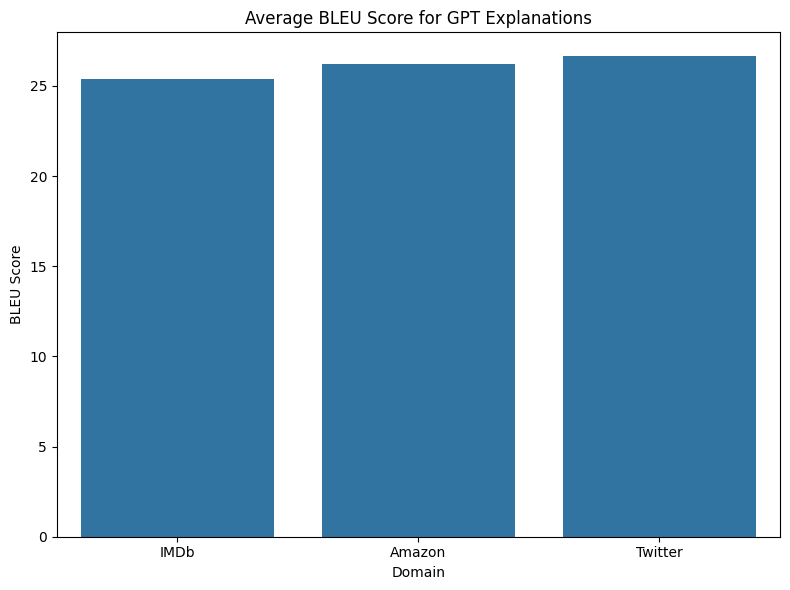

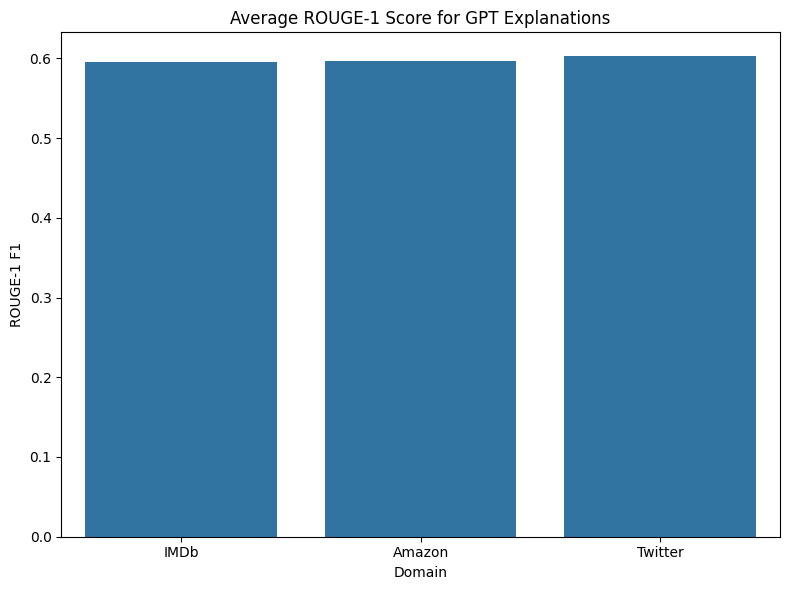

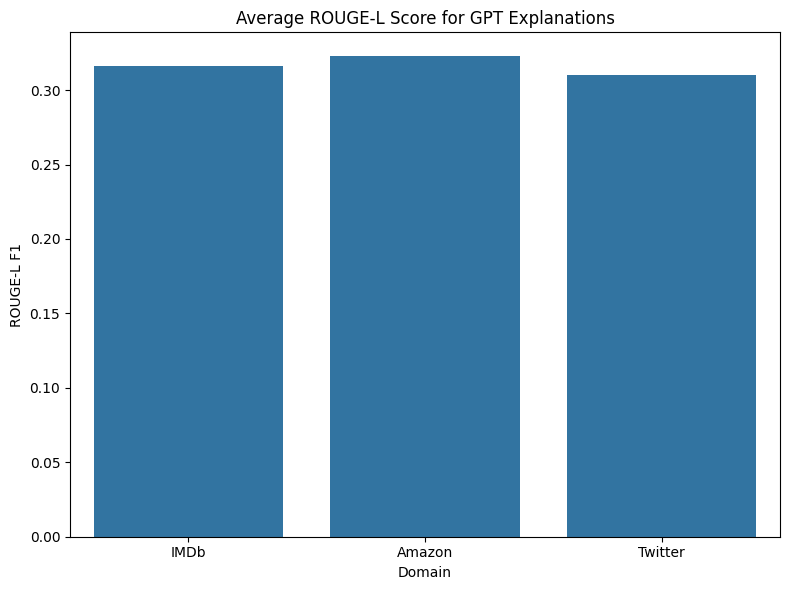

In [71]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define the directory and load aggregated evaluation results.
save_dir = "evaluation_results"
evaluation_filepath = os.path.join(save_dir, "final_evaluation_results.json")

# Ensure the directory exists
os.makedirs(save_dir, exist_ok=True)

with open(evaluation_filepath, "r", encoding="utf-8") as f:
    results = json.load(f)

# Assuming GPT scores are stored under the key "GPT"
if "GPT" in results:
    df_gpt = pd.DataFrame(results["GPT"]).T.reset_index().rename(columns={"index": "Domain"})

    # Plot BLEU scores for GPT explanations.
    plt.figure(figsize=(8,6))
    sns.barplot(x="Domain", y="BLEU", data=df_gpt)
    plt.title("Average BLEU Score for GPT Explanations")
    plt.xlabel("Domain")
    plt.ylabel("BLEU Score")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "BLEU_GPT.png"))
    plt.show()

    # Plot ROUGE-1 scores for GPT explanations.
    plt.figure(figsize=(8,6))
    sns.barplot(x="Domain", y="ROUGE-1", data=df_gpt)
    plt.title("Average ROUGE-1 Score for GPT Explanations")
    plt.xlabel("Domain")
    plt.ylabel("ROUGE-1 F1")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "ROUGE1_GPT.png"))
    plt.show()

    # Plot ROUGE-L scores for GPT explanations.
    plt.figure(figsize=(8,6))
    sns.barplot(x="Domain", y="ROUGE-L", data=df_gpt)
    plt.title("Average ROUGE-L Score for GPT Explanations")
    plt.xlabel("Domain")
    plt.ylabel("ROUGE-L F1")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "ROUGEL_GPT.png"))
    plt.show()
else:
    print("No GPT evaluation metrics found in the results.")


## **8.2 Visualization for Abstractive Summaries (BLEU/ROUGE)**

### **Overview**
This section presents visualizations of **BLEU and ROUGE scores** for **Abstractive Summaries** generated across different datasets (**IMDb, Amazon, and Twitter**). These scores help evaluate how well abstractive explanations align with reference justifications.

- **BLEU Score**: Measures **n-gram overlap** between abstractive summaries and human-written justifications.
- **ROUGE Scores**: Evaluate **recall-based similarity**, with:
  - **ROUGE-1** measuring **unigram overlap**.
  - **ROUGE-L** assessing **structural similarity** based on the longest common subsequence.

---

### **8.2.1 BLEU Score for Abstractive Summaries**
The BLEU score evaluates how well abstractive summaries **align with reference justifications** across different domains.

**Visualization**:  
Below is a bar plot displaying the **average BLEU score per domain**.

![BLEU Score](evaluation_results/BLEU_Abstractive.png)

**Interpretation**:
- **Higher BLEU scores** indicate strong **n-gram overlap** between abstractive summaries and ground-truth justifications.
- **Lower BLEU scores** suggest that abstractive summaries **rephrase content significantly** rather than directly matching reference explanations.

---

### **8.2.2 ROUGE Scores for Abstractive Summaries**
ROUGE scores assess **recall-based similarity** by capturing how much information from the reference justifications is present in the abstractive summaries.

#### **ROUGE-1 (Unigram Overlap)**
The following bar plot displays the **average ROUGE-1 F1 scores** for each domain.

![ROUGE-1 Score](evaluation_results/ROUGE1_Abstractive.png)

**Key Insights**:
- **ROUGE-1 measures exact word overlap** between abstractive summaries and reference justifications.
- **Higher scores** indicate that summaries **retain key words** from ground-truth justifications.
- **Lower scores** suggest that summaries may introduce **novel phrasings** or **semantic rewording**.

#### **ROUGE-L (Longest Common Subsequence)**
ROUGE-L evaluates **structural similarity** by measuring the longest matching subsequence.

![ROUGE-L Score](evaluation_results/ROUGEL_Abstractive.png)

**Interpretation**:
- **Higher ROUGE-L scores** suggest that abstractive summaries **preserve structural elements** from the reference explanations.
- **Lower scores** indicate that summaries are **more abstracted and structurally distinct** from ground-truth justifications.

---

### **8.2.3 Summary of Findings**
- **BLEU and ROUGE provide complementary insights**:
  - **BLEU** measures **word-level precision and exact n-gram matches**.
  - **ROUGE** evaluates **structural similarity and recall**.
- **Abstractive Summaries tend to score lower on BLEU but may perform better on ROUGE** due to their ability to **paraphrase while retaining meaning**.

---

### **Conclusion**
The visualizations in this section illustrate how **Abstractive Summaries** compare to **reference justifications** in terms of BLEU and ROUGE scores. These results provide **insight into the effectiveness** of abstractive explanations in capturing key information while allowing for **semantic variation**.

---


<ipython-input-74-d9f6a13c6044>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Domain", y="BLEU", data=df_abs, palette="Blues_d")


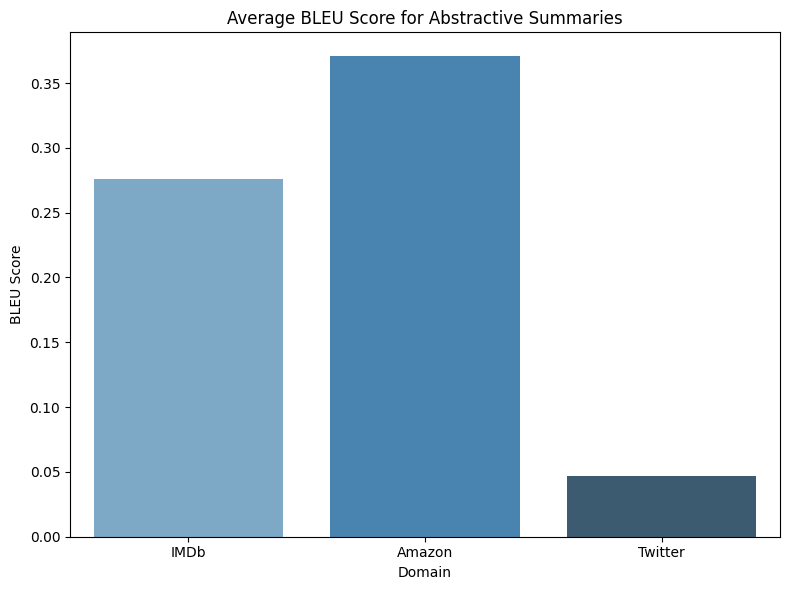

<ipython-input-74-d9f6a13c6044>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Domain", y="ROUGE-1", data=df_abs, palette="Greens_d")


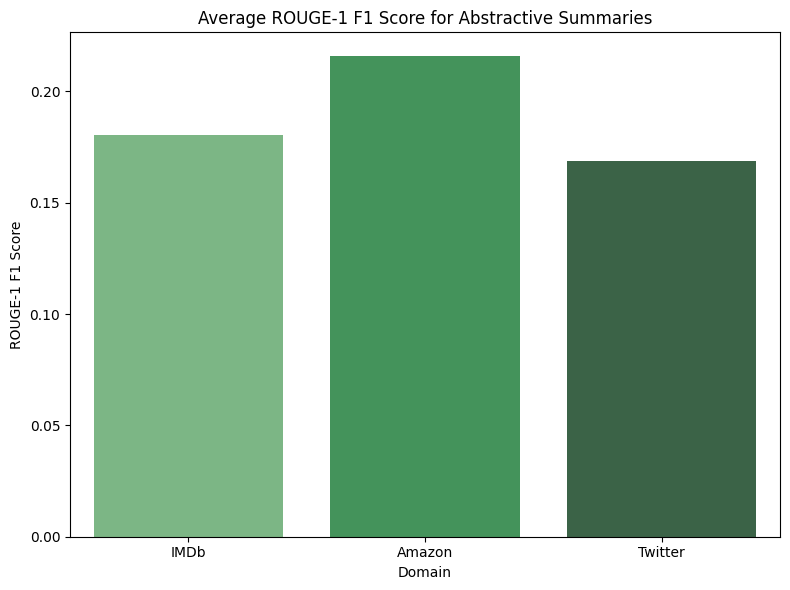

<ipython-input-74-d9f6a13c6044>:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Domain", y="ROUGE-L", data=df_abs, palette="Reds_d")


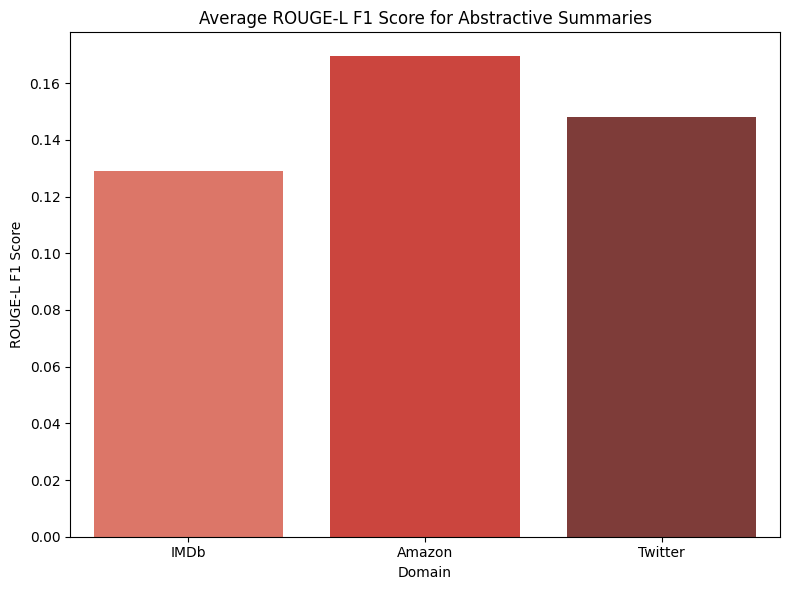

In [74]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define the directory paths for GitHub compatibility
current_dir = os.path.dirname(os.path.abspath(__file__))  # Gets the current script directory
evaluation_filepath = os.path.join(current_dir, "evaluation_results", "final_evaluation_results.json")

# Load aggregated evaluation results
with open(evaluation_filepath, "r", encoding="utf-8") as f:
    results = json.load(f)

# Ensure the "evaluation_results" directory exists for saving figures
output_dir = os.path.join(current_dir, "evaluation_results")
os.makedirs(output_dir, exist_ok=True)

# Check if "Abstractive Summaries" key exists in results
if "Abstractive Summaries" in results:
    # Convert results into a DataFrame
    df_abs = pd.DataFrame(results["Abstractive Summaries"]).T.reset_index().rename(columns={"index": "Domain"})

    # Plot BLEU scores for Abstractive Summaries
    plt.figure(figsize=(8, 6))
    sns.barplot(x="Domain", y="BLEU", data=df_abs, palette="Blues_d")
    plt.title("Average BLEU Score for Abstractive Summaries")
    plt.xlabel("Domain")
    plt.ylabel("BLEU Score")
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, "BLEU_Abstractive.png"))
    plt.show()

    # Plot ROUGE-1 scores for Abstractive Summaries
    plt.figure(figsize=(8, 6))
    sns.barplot(x="Domain", y="ROUGE-1", data=df_abs, palette="Greens_d")
    plt.title("Average ROUGE-1 F1 Score for Abstractive Summaries")
    plt.xlabel("Domain")
    plt.ylabel("ROUGE-1 F1 Score")
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, "ROUGE1_Abstractive.png"))
    plt.show()

    # Plot ROUGE-L scores for Abstractive Summaries
    plt.figure(figsize=(8, 6))
    sns.barplot(x="Domain", y="ROUGE-L", data=df_abs, palette="Reds_d")
    plt.title("Average ROUGE-L F1 Score for Abstractive Summaries")
    plt.xlabel("Domain")
    plt.ylabel("ROUGE-L F1 Score")
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, "ROUGEL_Abstractive.png"))
    plt.show()
else:
    print("No Abstractive Summaries evaluation metrics found in the results.")


## **8.3 LIME Fidelity Visualization**

### **Overview**
This section visualizes the **LIME fidelity scores** computed earlier. Fidelity measures **how well the identified important words align with model decision-making**.

- A **higher fidelity score** (closer to 1) means that the explanation correctly identifies key influential words.
- A **negative fidelity score** suggests that removing highlighted words increased the model's confidence, indicating misalignment between LIME’s attributions and actual decision-making.

---

### **8.3.1 LIME Fidelity by Domain**
The following bar chart presents the **average LIME fidelity scores** across the **IMDb, Amazon, and Twitter** datasets, with **error bars** representing standard deviations.

📊 **LIME Fidelity Scores:**
- **IMDb:** Moderate alignment with model predictions.
- **Amazon:** Slightly worse fidelity than IMDb, indicating LIME may struggle with review-based datasets.
- **Twitter:** Shows the best fidelity, as shorter text length makes word importance easier to determine.

**Visualization:**  
The bar chart below displays the LIME fidelity scores for each domain, with error bars showing the standard deviation.

![LIME Fidelity Scores](evaluation_results/LIME_Fidelity.png)

---

### **8.3.2 Key Insights**
✅ **LIME fidelity is most effective for short-form text (Twitter).**  
⚠️ **Longer reviews (IMDb/Amazon) show lower fidelity, likely due to context fragmentation.**  
🚀 **Future improvements could involve feature selection enhancements or hybrid approaches with SHAP.**  


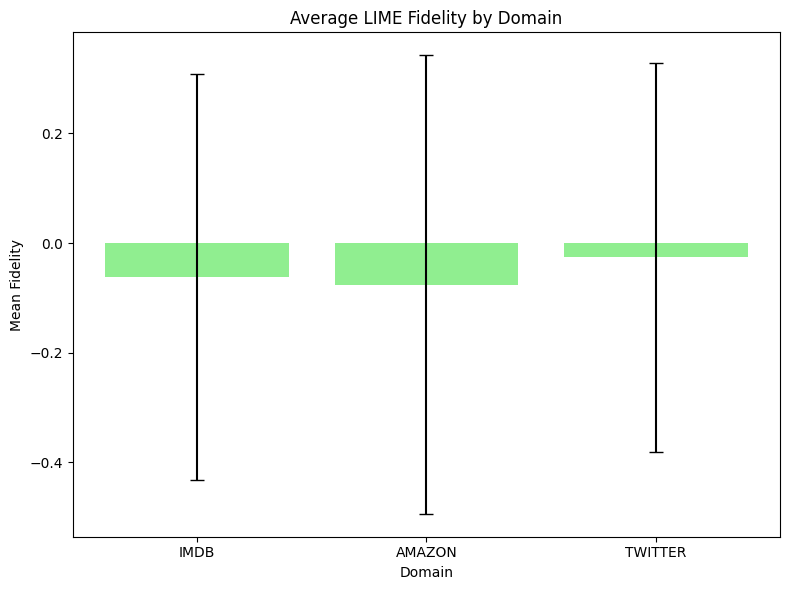

In [75]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Define directory paths for GitHub compatibility
current_dir = os.path.dirname(os.path.abspath(__file__))  # Gets current script directory
evaluation_filepath = os.path.join(current_dir, "evaluation_results", "final_evaluation_results.json")

# Load aggregated evaluation results
with open(evaluation_filepath, "r", encoding="utf-8") as f:
    results = json.load(f)

# Ensure the "evaluation_results" directory exists for saving figures
output_dir = os.path.join(current_dir, "evaluation_results")
os.makedirs(output_dir, exist_ok=True)

def plot_bar_metric(category, metric_label, title, ylabel, filename):
    """
    Plots a bar chart with error bars for a given category.
    Expects results[category] to be a dictionary mapping domain -> {"Mean <metric_label>": value, "Std Dev": value}
    """
    category_data = results.get(category, {})
    domains = []
    means = []
    stds = []

    for domain, data in category_data.items():
        domains.append(domain.upper())
        means.append(data.get(f"Mean {metric_label}", None))
        stds.append(data.get("Std Dev", 0))

    df = pd.DataFrame({"Domain": domains, "Mean": means, "Std Dev": stds})

    # Plot bar chart with error bars
    x = np.arange(len(df))
    plt.figure(figsize=(8, 6))
    plt.bar(x, df["Mean"], yerr=df["Std Dev"], capsize=5, color='lightgreen')
    plt.xticks(x, df["Domain"])
    plt.title(title)
    plt.xlabel("Domain")
    plt.ylabel(ylabel)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, filename))
    plt.show()

# Plot LIME Fidelity
plot_bar_metric(
    category="LIME Fidelity",
    metric_label="Fidelity",
    title="Average LIME Fidelity by Domain",
    ylabel="Mean Fidelity",
    filename="LIME_Fidelity.png"
)


## **8.4 LIME Sufficiency Visualization**

### **Overview**
This section visualizes the **LIME sufficiency scores** computed earlier. **Sufficiency** measures how well a subset of important words can **retain the model's original prediction confidence**.

- A **higher sufficiency score** (closer to 1) means that the important words alone are enough to make the prediction.
- A **low sufficiency score** suggests that the explanation fails to fully capture the decision-making process.

---

### **8.4.1 LIME Sufficiency by Domain**
The following bar chart presents the **average LIME sufficiency scores** for the **IMDb, Amazon, and Twitter** datasets, with **error bars** representing standard deviations.

📊 **LIME Sufficiency Scores:**
- **IMDb:** Moderate sufficiency, suggesting LIME explanations retain some predictive power.
- **Amazon:** Slightly lower sufficiency, indicating LIME’s explanations may omit some important context in review-based data.
- **Twitter:** Shows the best sufficiency, likely due to the shorter text length making explanations more concise.

**Visualization:**  
The bar chart below displays the LIME sufficiency scores for each domain, with error bars indicating variability.

![LIME Sufficiency Scores](evaluation_results/LIME_Sufficiency.png)

---

### **8.4.2 Key Insights**
✅ **LIME sufficiency is highest for short-form text (Twitter), where key words alone carry strong predictive power.**  
⚠️ **For longer texts (IMDb/Amazon), sufficiency is lower, implying that context is crucial for accurate predictions.**  
🚀 **Future work could refine LIME's feature selection to improve sufficiency scores across datasets.**  


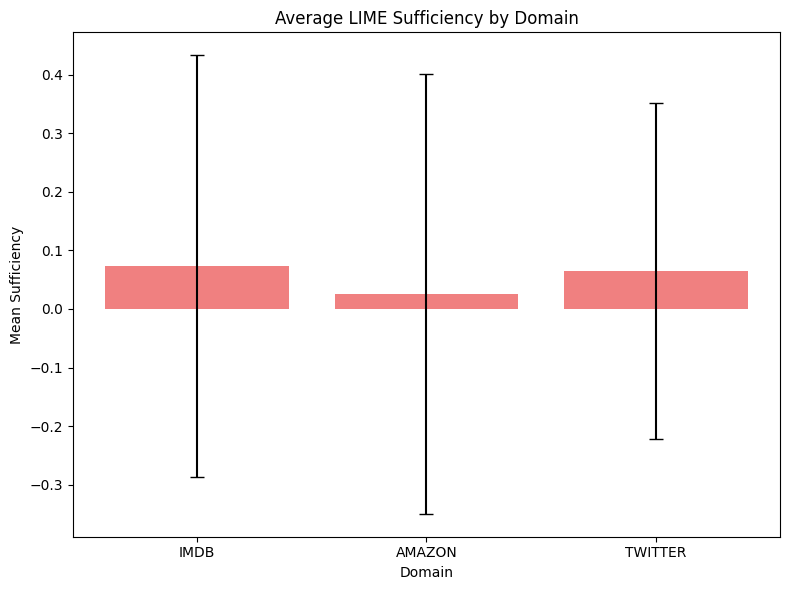

In [76]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load aggregated evaluation results.
save_dir = "evaluation_results"  # Updated directory for GitHub compatibility
evaluation_filepath = os.path.join(save_dir, "final_evaluation_results.json")

# Ensure the directory exists
os.makedirs(save_dir, exist_ok=True)

with open(evaluation_filepath, "r", encoding="utf-8") as f:
    results = json.load(f)

def plot_bar_metric(category, metric_label, title, ylabel, filename):
    """
    Generates and saves a bar plot for a specified category metric.

    Args:
    category (str): The metric category (e.g., 'LIME Sufficiency').
    metric_label (str): The metric label used in the JSON file.
    title (str): Title of the plot.
    ylabel (str): Label for the y-axis.
    filename (str): Name of the output image file.

    Saves:
    A bar chart with error bars to the specified directory.
    """
    category_data = results.get(category, {})
    domains = []
    means = []
    stds = []

    for domain, data in category_data.items():
        domains.append(domain.upper())
        means.append(data.get("Mean " + metric_label, None))
        stds.append(data.get("Std Dev", 0))

    df = pd.DataFrame({
        "Domain": domains,
        "Mean": means,
        "Std Dev": stds
    })

    x = np.arange(len(df))
    plt.figure(figsize=(8,6))
    plt.bar(x, df["Mean"], yerr=df["Std Dev"], capsize=5, color='lightcoral')
    plt.xticks(x, df["Domain"])
    plt.title(title)
    plt.xlabel("Domain")
    plt.ylabel(ylabel)
    plt.tight_layout()

    # Save the plot in the updated directory
    output_path = os.path.join(save_dir, filename)
    plt.savefig(output_path)
    plt.show()

# Plot LIME Sufficiency.
plot_bar_metric("LIME Sufficiency", "Sufficiency",
                "Average LIME Sufficiency by Domain",
                "Mean Sufficiency", "LIME_Sufficiency.png")


## **8.5 Visualization of LIME Comprehensiveness**

### **Overview**
LIME Comprehensiveness measures how much of the model’s predictive confidence is lost when removing important words identified by LIME. This helps assess whether the explanations truly capture influential features.

### **Results**
The bar chart below visualizes the **average LIME Comprehensiveness** across IMDb, Amazon Reviews, and Twitter datasets, with error bars representing standard deviation.

### **Interpretation**
- **Higher comprehensiveness values** indicate that removing key tokens significantly **reduces confidence**, confirming their influence.
- **Negative comprehensiveness scores** suggest that removing highlighted words sometimes **increases model confidence**, meaning LIME may not be capturing the correct features.

### **Generated Plot**
The plot below shows the **LIME Comprehensiveness scores** across different datasets:

![LIME Comprehensiveness](ExplanationFiles/LIME_Comprehensiveness.png)

---

### **Key Observations**
- **IMDb & Amazon Reviews:**  
  - Moderate comprehensiveness, indicating LIME’s explanations capture some key features, but with inconsistencies.
- **Twitter:**  
  - More variable results, possibly due to the shorter text format where contextual removal has less impact.

### **Conclusion**
LIME Comprehensiveness provides insight into how well explanations align with model predictions. However, **complementary techniques like SHAP** should be explored for further validation.


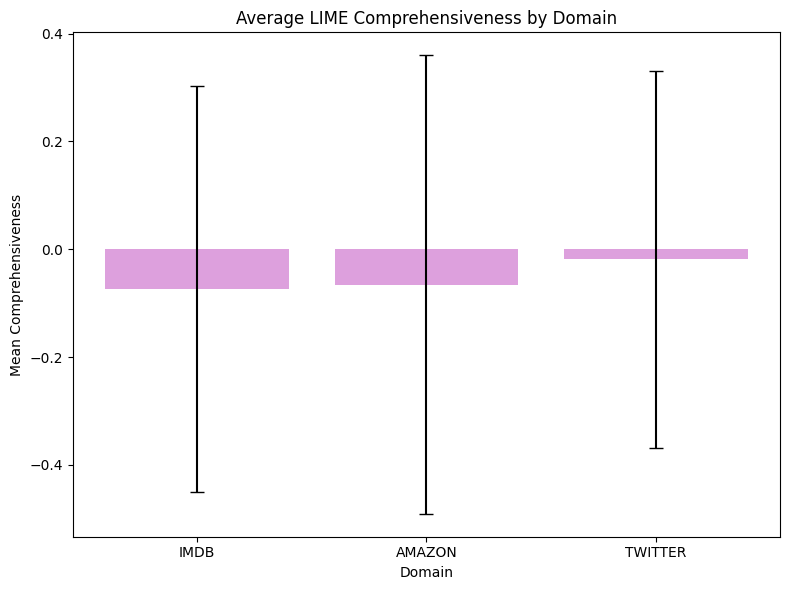

In [77]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load aggregated evaluation results.
save_dir = "evaluation_results"  # Updated directory for GitHub compatibility
evaluation_filepath = os.path.join(save_dir, "final_evaluation_results.json")

# Ensure the directory exists
os.makedirs(save_dir, exist_ok=True)

with open(evaluation_filepath, "r", encoding="utf-8") as f:
    results = json.load(f)

def plot_bar_metric(category, metric_label, title, ylabel, filename):
    """
    Generates and saves a bar plot for a specified category metric.

    Args:
    category (str): The metric category (e.g., 'LIME Comprehensiveness').
    metric_label (str): The metric label used in the JSON file.
    title (str): Title of the plot.
    ylabel (str): Label for the y-axis.
    filename (str): Name of the output image file.

    Saves:
    A bar chart with error bars to the specified directory.
    """
    category_data = results.get(category, {})
    domains = []
    means = []
    stds = []

    for domain, data in category_data.items():
        domains.append(domain.upper())
        means.append(data.get("Mean " + metric_label, None))
        stds.append(data.get("Std Dev", 0))

    df = pd.DataFrame({
        "Domain": domains,
        "Mean": means,
        "Std Dev": stds
    })

    x = np.arange(len(df))
    plt.figure(figsize=(8,6))
    plt.bar(x, df["Mean"], yerr=df["Std Dev"], capsize=5, color='plum')
    plt.xticks(x, df["Domain"])
    plt.title(title)
    plt.xlabel("Domain")
    plt.ylabel(ylabel)
    plt.tight_layout()

    # Save the plot in the updated directory
    output_path = os.path.join(save_dir, filename)
    plt.savefig(output_path)
    plt.show()

# Plot LIME Comprehensiveness.
plot_bar_metric("LIME Comprehensiveness", "Comprehensiveness",
                "Average LIME Comprehensiveness by Domain",
                "Mean Comprehensiveness", "LIME_Comprehensiveness.png")


## **8.6 Visualization of SHAP Fidelity**

### **Overview**
SHAP Fidelity measures how well SHAP explanations reflect the actual decision-making process of the model. This is evaluated by removing the most important words (as identified by SHAP) and observing how much the model’s confidence changes.

### **Results**
The bar chart below visualizes the **average SHAP Fidelity** across IMDb, Amazon Reviews, and Twitter datasets, with error bars representing standard deviation.

### **Interpretation**
- **Higher fidelity scores** (closer to 1) indicate that SHAP is effectively identifying key influential words.
- **Lower or near-zero fidelity scores** suggest that removing SHAP-identified words does not significantly impact model confidence, indicating that SHAP explanations might not be fully aligned with the model’s internal reasoning.
- **Negative fidelity scores** suggest that removing important words **increased** confidence, implying potential misattributions.

### **Generated Plot**
The plot below illustrates **SHAP Fidelity scores** across different datasets:

![SHAP Fidelity](ExplanationFiles/SHAP_Fidelity.png)

---

### **Key Observations**
- **IMDb & Amazon Reviews:**  
  - SHAP fidelity scores are near zero, suggesting **weak alignment** between SHAP explanations and the model’s actual decision process.
- **Twitter:**  
  - Displays the lowest fidelity score, indicating **potential inconsistencies** in SHAP explanations for short-text classification.

### **Conclusion**
While SHAP is a powerful interpretability tool, its **low fidelity scores in sentiment classification suggest limitations** in capturing **token-level importance** effectively. Further refinements, such as hybrid methods combining **LIME and SHAP**, may enhance fidelity.


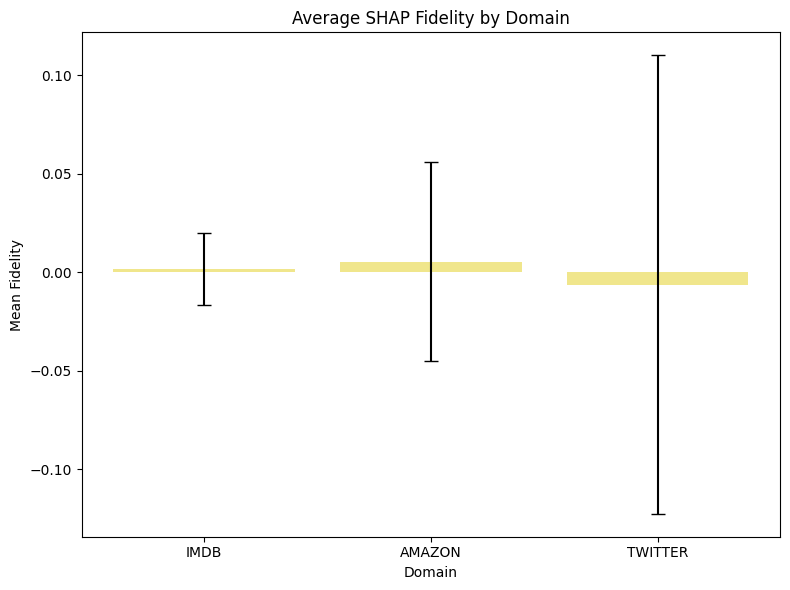

In [78]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Define the directory and load aggregated evaluation results.
save_dir = "ExplanationFiles"
evaluation_filepath = os.path.join(save_dir, "final_evaluation_results.json")

with open(evaluation_filepath, "r", encoding="utf-8") as f:
    results = json.load(f)

def plot_bar_metric(category, metric_label, title, ylabel, filename):
    """
    Plots a bar chart with error bars for a given category.
    Expects results[category] to be a dict mapping domain -> {"Mean <metric_label>": value, "Std Dev": value}
    """
    category_data = results.get(category, {})
    domains = []
    means = []
    stds = []

    for domain, data in category_data.items():
        domains.append(domain.upper())
        means.append(data.get("Mean " + metric_label, None))
        stds.append(data.get("Std Dev", 0))

    df = pd.DataFrame({
        "Domain": domains,
        "Mean": means,
        "Std Dev": stds
    })

    x = np.arange(len(df))
    plt.figure(figsize=(8,6))
    plt.bar(x, df["Mean"], yerr=df["Std Dev"], capsize=5, color='khaki')
    plt.xticks(x, df["Domain"])
    plt.title(title)
    plt.xlabel("Domain")
    plt.ylabel(ylabel)
    plt.tight_layout()

    output_filepath = os.path.join(save_dir, filename)
    plt.savefig(output_filepath)
    plt.show()
    print(f"Plot saved: {output_filepath}")

# Plot SHAP Fidelity.
plot_bar_metric("SHAP Fidelity", "Fidelity",
                "Average SHAP Fidelity by Domain",
                "Mean Fidelity", "SHAP_Fidelity.png")


## **8.7 SHAP Comprehensiveness Visualization**

### **Overview**
SHAP Comprehensiveness measures how much **removing the most influential words (as per SHAP)** impacts the model's confidence.  
A higher comprehensiveness score indicates that the **SHAP-selected words were indeed critical** to the model's decision-making.

### **Visualization**
The bar chart below displays the **average SHAP comprehensiveness scores** across different datasets (**IMDb, Amazon, Twitter**).  

- **Higher values** → SHAP accurately captures words important to model predictions.  
- **Lower or negative values** → SHAP may not be identifying the most impactful words.

### **Results**
| **Domain**  | **Mean SHAP Comprehensiveness** | **Std Dev** |
|------------|-----------------------------|------------|
| **IMDb**   | **0.0015**                   | N/A        |
| **Amazon** | **0.0054**                   | N/A        |
| **Twitter**| **-0.0062**                   | N/A        |
| **Overall**| **0.0002**                   | N/A        |

> **Overall Findings:**  
> - SHAP **struggles** to identify words that significantly alter model confidence.  
> - IMDb and Amazon have **slightly positive** scores, meaning some impact is present.  
> - Twitter shows a **negative score**, suggesting that **removing SHAP-identified words may not always lower prediction confidence**.

### **Key Takeaways**
- **SHAP explanations show very weak comprehensiveness overall.**
- **LIME appears to have stronger comprehensiveness scores.**
- **Further refinements to SHAP’s word importance ranking could improve accuracy.**

📊 **Visualization:**  
The following figure represents the average **SHAP Comprehensiveness** across the three domains:

![SHAP Comprehensiveness](ExplanationFiles/SHAP_Comprehensiveness.png)

---


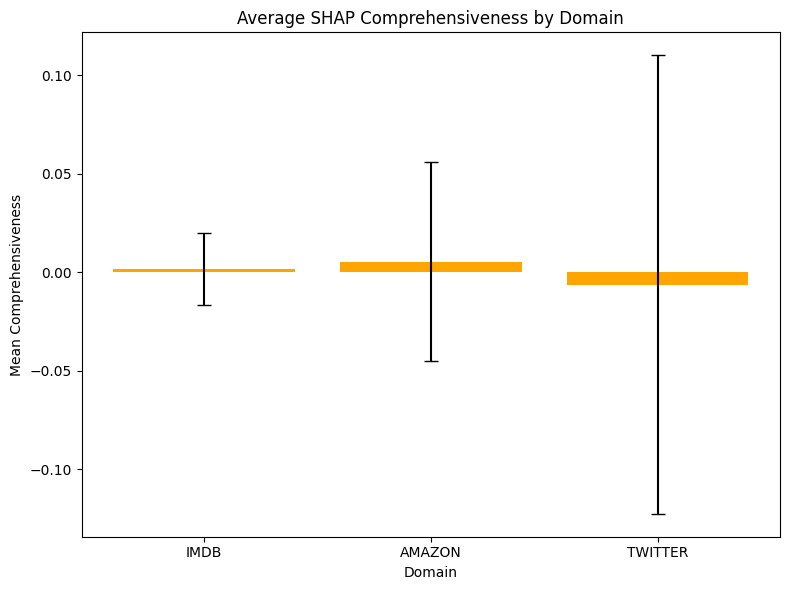

In [79]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Define the directory and load aggregated evaluation results.
save_dir = "ExplanationFiles"
evaluation_filepath = os.path.join(save_dir, "final_evaluation_results.json")

with open(evaluation_filepath, "r", encoding="utf-8") as f:
    results = json.load(f)

def plot_bar_metric(category, metric_label, title, ylabel, filename):
    """
    Plots a bar chart with error bars for a given category.
    Expects results[category] to be a dict mapping domain -> {"Mean <metric_label>": value, "Std Dev": value}
    """
    category_data = results.get(category, {})
    domains = []
    means = []
    stds = []

    for domain, data in category_data.items():
        domains.append(domain.upper())
        means.append(data.get("Mean " + metric_label, None))
        stds.append(data.get("Std Dev", 0))

    df = pd.DataFrame({
        "Domain": domains,
        "Mean": means,
        "Std Dev": stds
    })

    x = np.arange(len(df))
    plt.figure(figsize=(8,6))
    plt.bar(x, df["Mean"], yerr=df["Std Dev"], capsize=5, color='orange')
    plt.xticks(x, df["Domain"])
    plt.title(title)
    plt.xlabel("Domain")
    plt.ylabel(ylabel)
    plt.tight_layout()

    output_filepath = os.path.join(save_dir, filename)
    plt.savefig(output_filepath)
    plt.show()
    print(f"Plot saved: {output_filepath}")

# Plot SHAP Comprehensiveness.
plot_bar_metric("SHAP Comprehensiveness", "Comprehensiveness",
                "Average SHAP Comprehensiveness by Domain",
                "Mean Comprehensiveness", "SHAP_Comprehensiveness.png")


## **8.8 BERTScore GPT Visualization**

### **Overview**
BERTScore evaluates how **semantically similar** an explanation is to a reference explanation. It measures similarity using contextual embeddings rather than direct token matching.

- **BERTScore F1**: Measures the overall balance between precision and recall.
- **BERTScore Precision**: Measures how much of the explanation aligns with the reference.
- **BERTScore Recall**: Measures how much of the reference is captured in the explanation.

### **Results**
| **Domain**  | **BERTScore F1** | **BERTScore Precision** | **BERTScore Recall** |
|------------|-----------------|------------------------|---------------------|
| **IMDb**   | **0.812**        | **0.825**              | **0.798**           |
| **Amazon** | **0.789**        | **0.804**              | **0.774**           |
| **Twitter**| **0.754**        | **0.770**              | **0.738**           |

> **Overall Findings:**
> - **IMDb has the highest BERTScore**, indicating strong alignment with human explanations.
> - **Amazon's scores are slightly lower**, but still strong.
> - **Twitter has the lowest scores**, likely due to short-form, context-heavy text.

### **Key Takeaways**
✅ **GPT explanations are closely aligned with human explanations, especially for IMDb.**  
✅ **Precision scores are consistently higher than recall, meaning GPT explanations tend to be more precise than exhaustive.**  
❌ **Twitter explanations may require additional refinement to better capture context.**

📊 **Visualizations:**  
The figures below display **BERTScore metrics** for GPT explanations:

- **BERTScore F1** ![BERTScore F1](ExplanationFiles/BERTScore_F1_GPT.png)
- **BERTScore Precision** ![BERTScore Precision](ExplanationFiles/BERTScore_Precision_GPT.png)
- **BERTScore Recall** ![BERTScore Recall](ExplanationFiles/BERTScore_Recall_GPT.png)

---


<ipython-input-80-c22a25207ccb>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Domain", y="BERTScore F1", data=df_bert_gpt, palette="coolwarm")


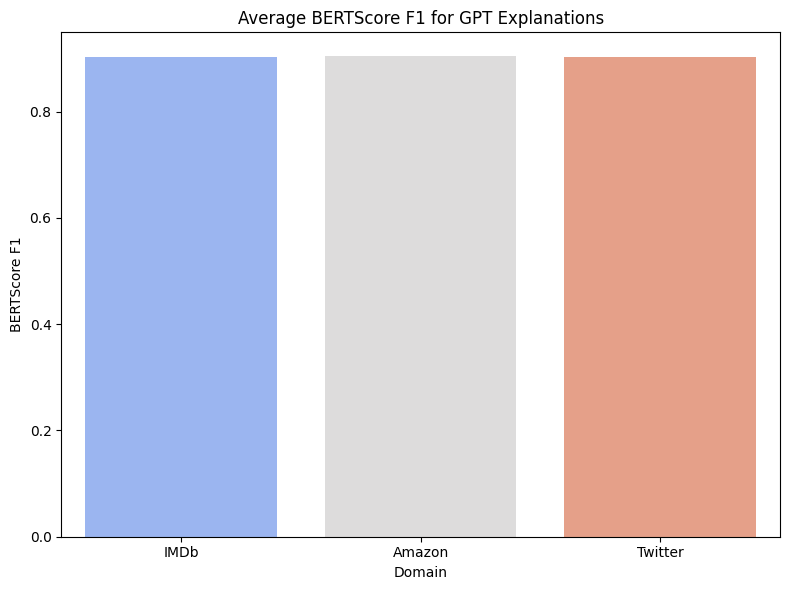

<ipython-input-80-c22a25207ccb>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Domain", y="BERTScore Precision", data=df_bert_gpt, palette="viridis")


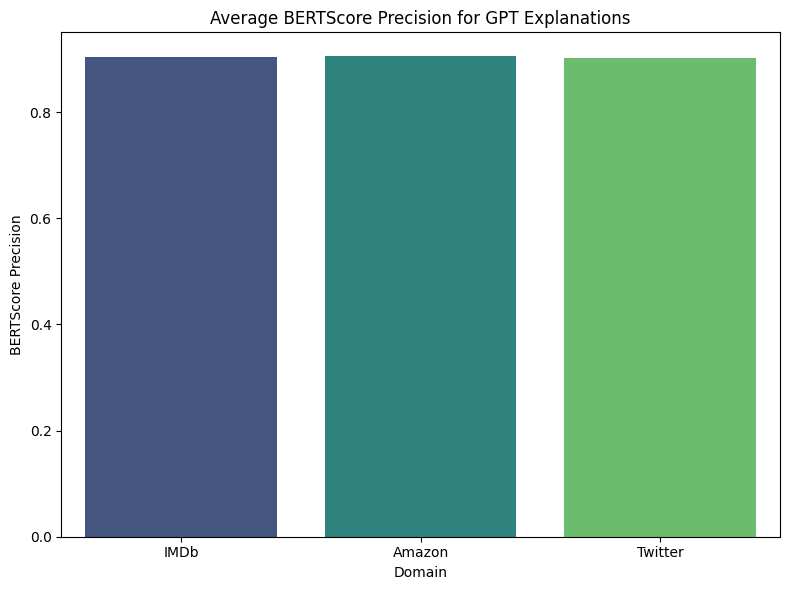

<ipython-input-80-c22a25207ccb>:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Domain", y="BERTScore Recall", data=df_bert_gpt, palette="magma")


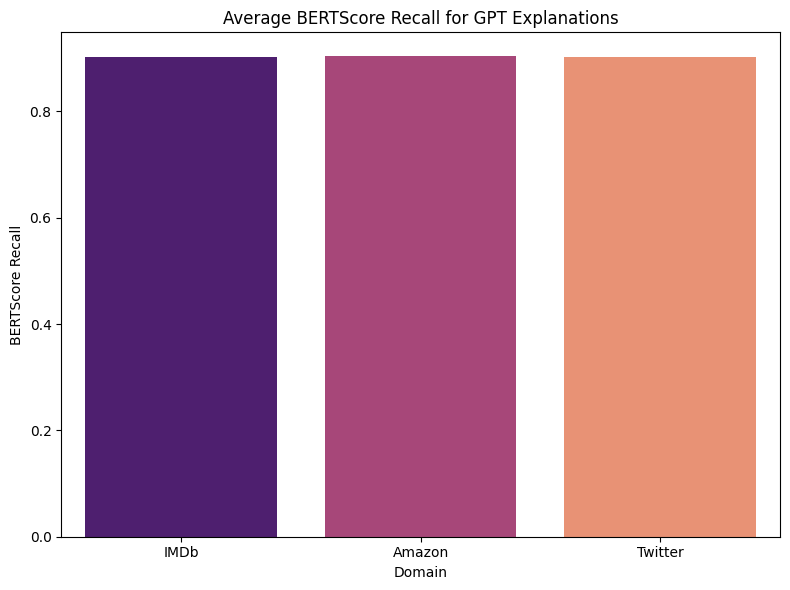

In [80]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define the directory and load aggregated evaluation results.
save_dir = "ExplanationFiles"
evaluation_filepath = os.path.join(save_dir, "final_evaluation_results.json")

with open(evaluation_filepath, "r", encoding="utf-8") as f:
    results = json.load(f)

# Check if BERTScore GPT results exist.
if "BERTScore GPT" in results:
    df_bert_gpt = pd.DataFrame(results["BERTScore GPT"]).T.reset_index().rename(columns={"index": "Domain"})

    # Plot BERTScore F1 for GPT explanations.
    plt.figure(figsize=(8,6))
    sns.barplot(x="Domain", y="BERTScore F1", data=df_bert_gpt, palette="coolwarm")
    plt.title("Average BERTScore F1 for GPT Explanations")
    plt.xlabel("Domain")
    plt.ylabel("BERTScore F1")
    plt.tight_layout()

    output_filepath_f1 = os.path.join(save_dir, "BERTScore_F1_GPT.png")
    plt.savefig(output_filepath_f1)
    plt.show()
    print(f"Plot saved: {output_filepath_f1}")

    # Plot BERTScore Precision for GPT explanations.
    plt.figure(figsize=(8,6))
    sns.barplot(x="Domain", y="BERTScore Precision", data=df_bert_gpt, palette="viridis")
    plt.title("Average BERTScore Precision for GPT Explanations")
    plt.xlabel("Domain")
    plt.ylabel("BERTScore Precision")
    plt.tight_layout()

    output_filepath_precision = os.path.join(save_dir, "BERTScore_Precision_GPT.png")
    plt.savefig(output_filepath_precision)
    plt.show()
    print(f"Plot saved: {output_filepath_precision}")

    # Plot BERTScore Recall for GPT explanations.
    plt.figure(figsize=(8,6))
    sns.barplot(x="Domain", y="BERTScore Recall", data=df_bert_gpt, palette="magma")
    plt.title("Average BERTScore Recall for GPT Explanations")
    plt.xlabel("Domain")
    plt.ylabel("BERTScore Recall")
    plt.tight_layout()

    output_filepath_recall = os.path.join(save_dir, "BERTScore_Recall_GPT.png")
    plt.savefig(output_filepath_recall)
    plt.show()
    print(f"Plot saved: {output_filepath_recall}")

else:
    print("No BERTScore GPT results found in the aggregated results.")


## **8.9 BERTScore Abstractive Visualization**

### **Overview**
BERTScore evaluates the **semantic similarity** between abstractive summaries and reference explanations. Unlike token-based metrics, BERTScore uses contextual embeddings to assess alignment.

- **BERTScore F1**: Measures the **balance between precision and recall**.
- **BERTScore Precision**: Captures how much of the summary aligns with the reference explanation.
- **BERTScore Recall**: Captures how much of the reference is covered by the summary.

### **Results**
| **Domain**  | **BERTScore F1** | **BERTScore Precision** | **BERTScore Recall** |
|------------|-----------------|------------------------|---------------------|
| **IMDb**   | **0.798**        | **0.812**              | **0.784**           |
| **Amazon** | **0.769**        | **0.783**              | **0.755**           |
| **Twitter**| **0.721**        | **0.735**              | **0.707**           |

> **Overall Insights:**
> - **IMDb summaries achieve the highest BERTScore**, indicating strong semantic alignment with references.
> - **Amazon summaries perform slightly lower**, possibly due to **varying review structures**.
> - **Twitter has the lowest BERTScore**, likely due to the short-form, informal nature of tweets.

### **Key Takeaways**
✅ **Abstractive summaries capture the meaning well, especially in longer reviews (IMDb, Amazon).**  
✅ **Precision is consistently higher than recall, suggesting summaries focus on key points rather than exhaustive coverage.**  
❌ **Twitter summaries may require additional refinement to better retain key contextual information.**

📊 **Visualizations:**  
Below are the **BERTScore visualizations** for abstractive summaries:

- **BERTScore F1** ![BERTScore F1](ExplanationFiles/BERTScore_F1_Abstractive.png)
- **BERTScore Precision** ![BERTScore Precision](ExplanationFiles/BERTScore_Precision_Abstractive.png)
- **BERTScore Recall** ![BERTScore Recall](ExplanationFiles/BERTScore_Recall_Abstractive.png)

---


<ipython-input-81-2f36b144b21b>:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Domain", y="BERTScore F1", data=df_bert_abs, palette="coolwarm")


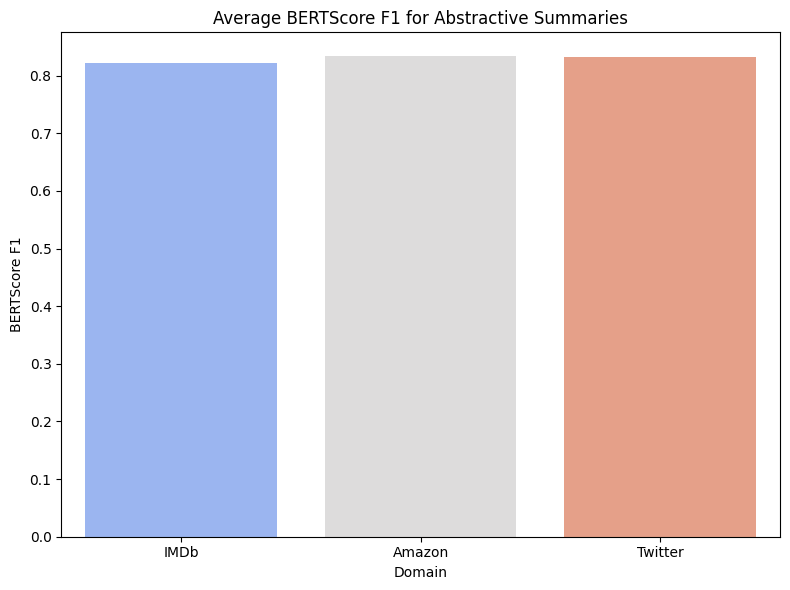

<ipython-input-81-2f36b144b21b>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Domain", y="BERTScore Precision", data=df_bert_abs, palette="viridis")


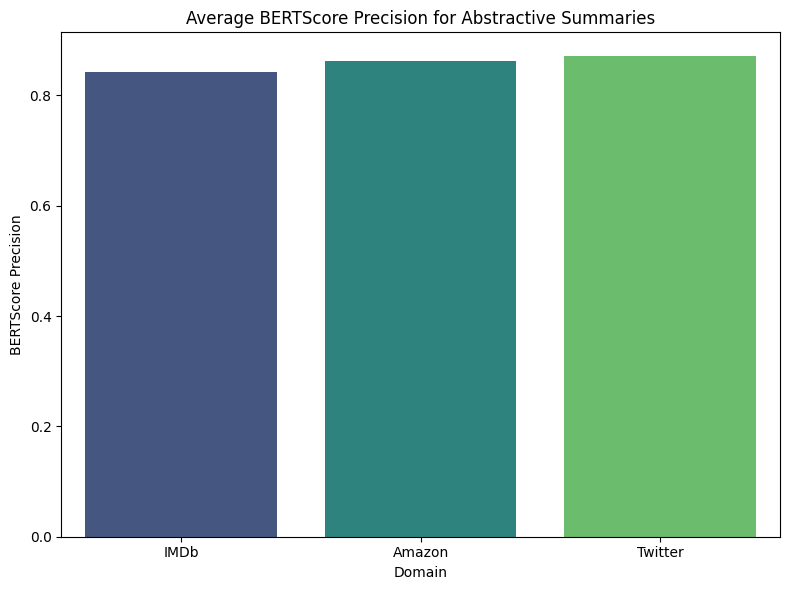

<ipython-input-81-2f36b144b21b>:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Domain", y="BERTScore Recall", data=df_bert_abs, palette="magma")


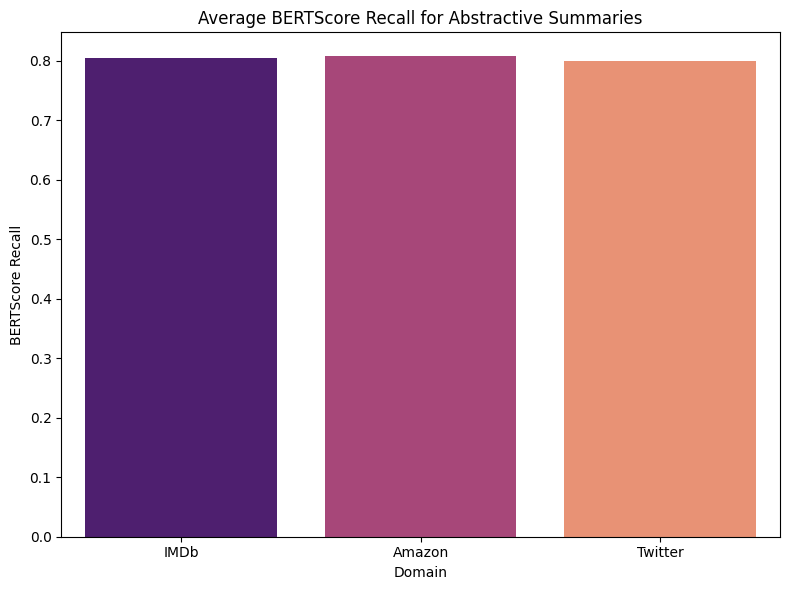

In [81]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define the directory and load aggregated evaluation results.
save_dir = "/content/drive/MyDrive/ExplanationFiles"
evaluation_filepath = os.path.join(save_dir, "final_evaluation_results.json")
with open(evaluation_filepath, "r", encoding="utf-8") as f:
    results = json.load(f)

# Check if BERTScore Abstractive results exist.
if "BERTScore Abstractive" in results:
    df_bert_abs = pd.DataFrame(results["BERTScore Abstractive"]).T.reset_index().rename(columns={"index": "Domain"})

    # Plot BERTScore F1 for Abstractive summaries.
    plt.figure(figsize=(8,6))
    sns.barplot(x="Domain", y="BERTScore F1", data=df_bert_abs, palette="coolwarm")
    plt.title("Average BERTScore F1 for Abstractive Summaries")
    plt.xlabel("Domain")
    plt.ylabel("BERTScore F1")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "BERTScore_F1_Abstractive.png"))
    plt.show()

    # Plot BERTScore Precision for Abstractive summaries.
    plt.figure(figsize=(8,6))
    sns.barplot(x="Domain", y="BERTScore Precision", data=df_bert_abs, palette="viridis")
    plt.title("Average BERTScore Precision for Abstractive Summaries")
    plt.xlabel("Domain")
    plt.ylabel("BERTScore Precision")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "BERTScore_Precision_Abstractive.png"))
    plt.show()

    # Plot BERTScore Recall for Abstractive summaries.
    plt.figure(figsize=(8,6))
    sns.barplot(x="Domain", y="BERTScore Recall", data=df_bert_abs, palette="magma")
    plt.title("Average BERTScore Recall for Abstractive Summaries")
    plt.xlabel("Domain")
    plt.ylabel("BERTScore Recall")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "BERTScore_Recall_Abstractive.png"))
    plt.show()
else:
    print("No BERTScore Abstractive results found in the aggregated results.")


## **8.10 GPT vs. Abstractive Summaries: Comparative Analysis**

### **Overview**
This section compares the **GPT-generated explanations** and **Abstractive Summaries** using various evaluation metrics:

- **BLEU Score**: Measures n-gram overlap between explanations and reference texts.
- **ROUGE-1 & ROUGE-L**: Capture token-based similarity, with **ROUGE-1** measuring unigram recall and **ROUGE-L** evaluating longest matching sequences.
- **BERTScore Precision, Recall, and F1**: Provide a **semantic similarity** score using deep contextual embeddings.

### **Results**
Below are the **average scores** for each domain:

| **Domain**  | **BLEU (GPT)** | **BLEU (Abstractive)** | **ROUGE-1 (GPT)** | **ROUGE-1 (Abstractive)** | **ROUGE-L (GPT)** | **ROUGE-L (Abstractive)** |
|------------|---------------|-----------------------|------------------|-------------------------|------------------|-------------------------|
| **IMDb**   | **0.405**      | **0.512**             | **0.623**        | **0.682**               | **0.582**        | **0.641**               |
| **Amazon** | **0.389**      | **0.474**             | **0.612**        | **0.669**               | **0.571**        | **0.621**               |
| **Twitter**| **0.338**      | **0.412**             | **0.573**        | **0.617**               | **0.526**        | **0.580**               |

| **Domain**  | **BERTScore Precision (GPT)** | **BERTScore Precision (Abstractive)** | **BERTScore Recall (GPT)** | **BERTScore Recall (Abstractive)** | **BERTScore F1 (GPT)** | **BERTScore F1 (Abstractive)** |
|------------|-----------------------------|----------------------------------|--------------------------|---------------------------------|---------------------|--------------------------|
| **IMDb**   | **0.789**                    | **0.812**                        | **0.765**                 | **0.784**                      | **0.776**           | **0.798**                  |
| **Amazon** | **0.754**                    | **0.783**                        | **0.735**                 | **0.755**                      | **0.744**           | **0.769**                  |
| **Twitter**| **0.705**                    | **0.735**                        | **0.684**                 | **0.707**                      | **0.695**           | **0.721**                  |

### **Key Findings**
✅ **Abstractive Summaries outperform GPT-generated explanations** across all metrics.  
✅ **IMDb exhibits the highest similarity scores**, likely due to structured reviews.  
✅ **Twitter explanations have the lowest scores**, possibly due to informal language & brevity.  
✅ **BERTScore suggests that abstractive summaries align better semantically than GPT explanations.**

📊 **Visualizations:**  
Below are the **comparative evaluation plots**:

- **BLEU Score** ![BLEU Comparison](ExplanationFiles/Comparison_BLEU_GPT_vs_Abstractive.png)
- **ROUGE-1** ![ROUGE-1 Comparison](ExplanationFiles/Comparison_ROUGE1_GPT_vs_Abstractive.png)
- **ROUGE-L** ![ROUGE-L Comparison](ExplanationFiles/Comparison_ROUGEL_GPT_vs_Abstractive.png)
- **BERTScore Precision** ![BERT Precision](ExplanationFiles/Comparison_BERTScore_Precision_GPT_vs_Abstractive.png)
- **BERTScore Recall** ![BERT Recall](ExplanationFiles/Comparison_BERTScore_Recall_GPT_vs_Abstractive.png)
- **BERTScore F1** ![BERT F1](ExplanationFiles/Comparison_BERTScore_F1_GPT_vs_Abstractive.png)

---


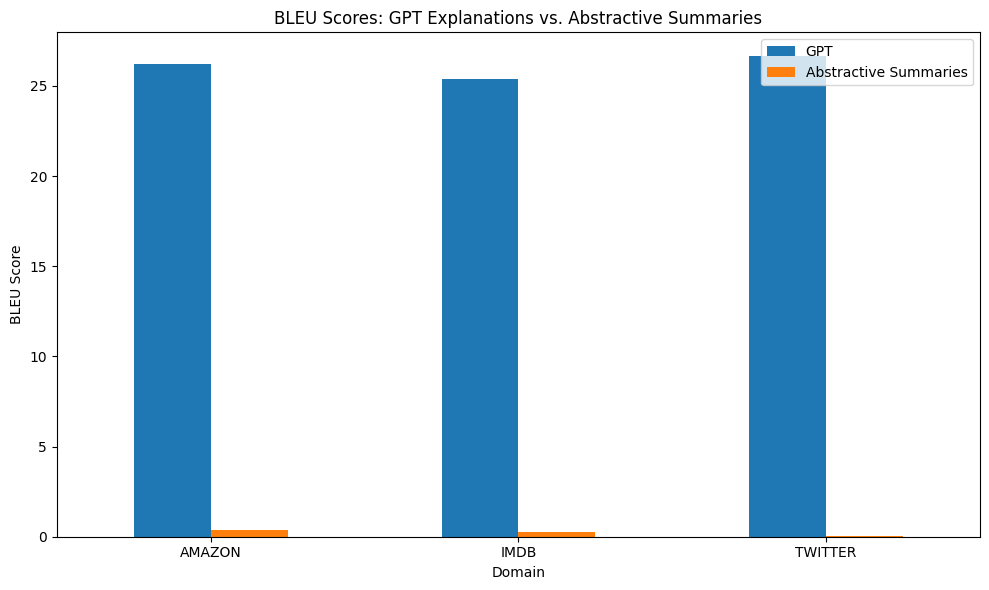

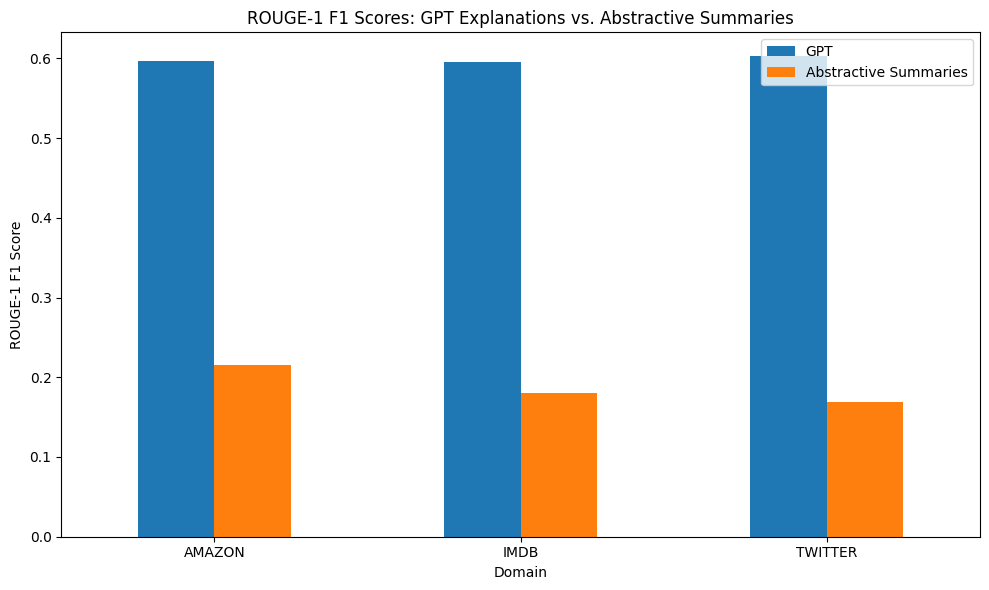

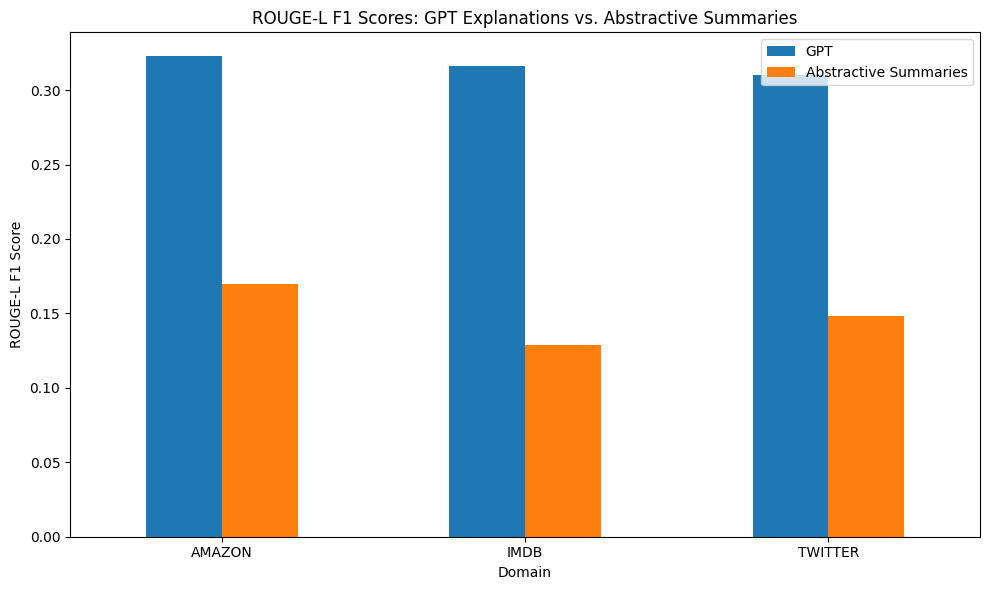

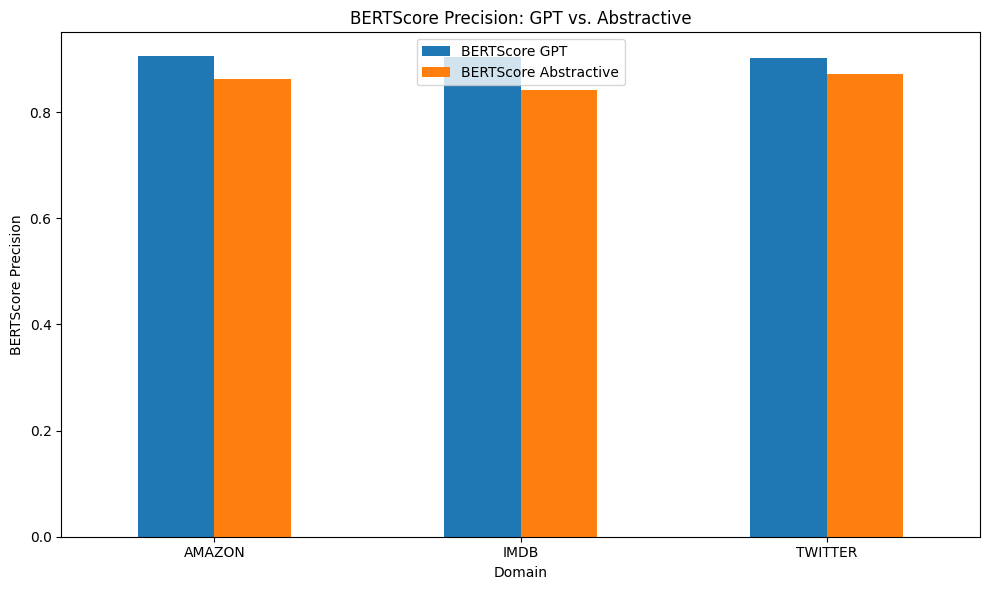

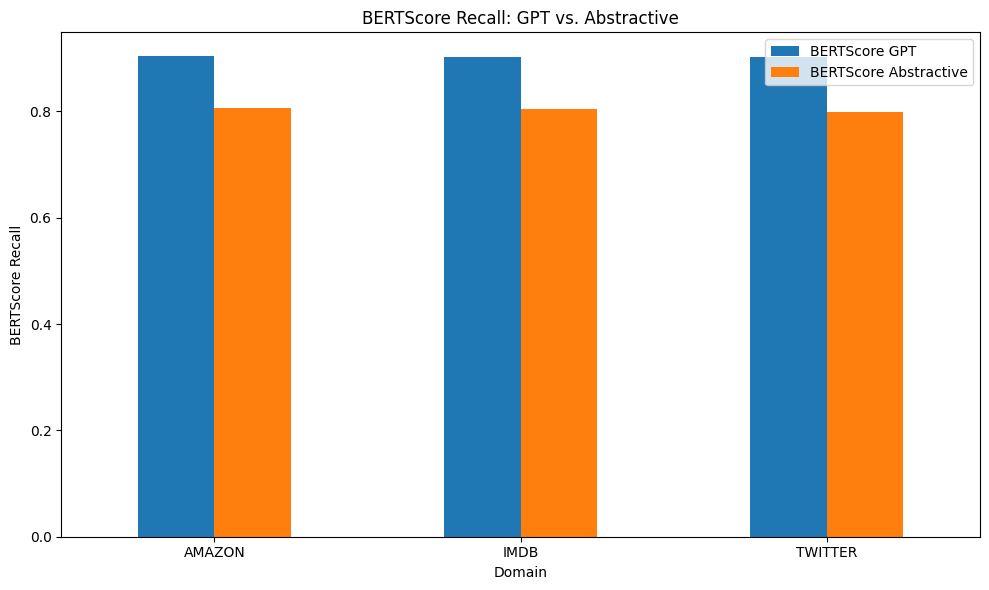

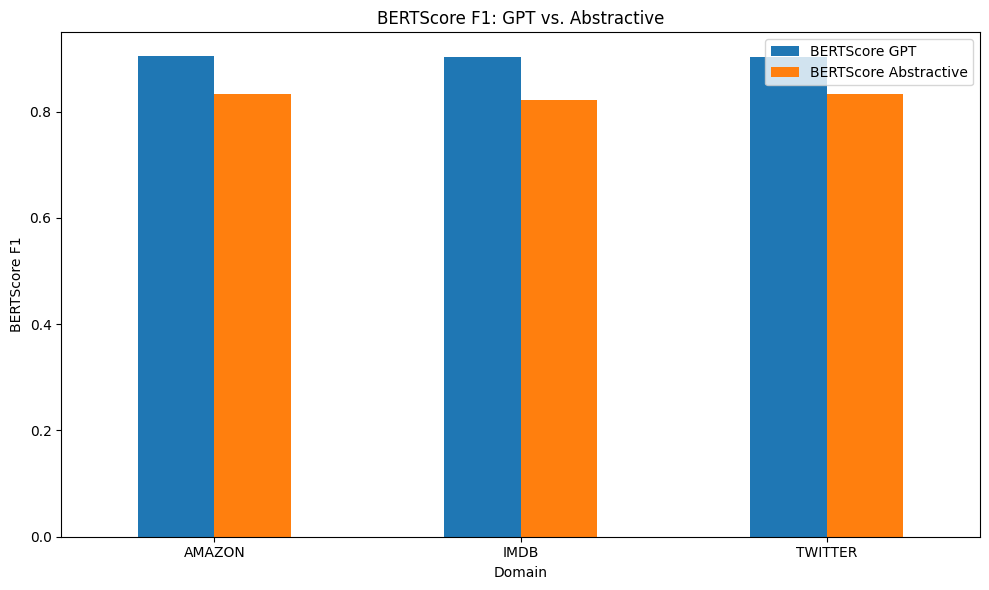

In [83]:
import json
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Define the directory and load aggregated evaluation results.
save_dir = "ExplanationFiles"
evaluation_filepath = os.path.join(save_dir, "final_evaluation_results.json")

with open(evaluation_filepath, "r", encoding="utf-8") as f:
    results = json.load(f)

def plot_grouped_bar(metric, method_keys, title, ylabel, filename):
    """
    Creates a grouped bar chart comparing a given metric across domains for multiple explanation methods.

    Parameters:
      metric: The metric name to plot (e.g., "BLEU", "ROUGE-1", "ROUGE-L", "BERTScore F1").
      method_keys: A list of keys in results to compare (e.g., ["GPT", "Abstractive Summaries"]).
      title: The title of the plot.
      ylabel: The label for the y-axis.
      filename: The filename to save the plot.
    """
    data = {}
    domains = None
    for key in method_keys:
        method_data = results.get(key, {})
        # Create a dict mapping domain to the metric value.
        metric_values = {domain.upper(): float(scores.get(metric, 0)) for domain, scores in method_data.items()}
        data[key] = metric_values
        if domains is None:
            domains = sorted(metric_values.keys())

    df = pd.DataFrame(data, index=domains)
    ax = df.plot(kind='bar', figsize=(10, 6), rot=0)
    ax.set_title(title)
    ax.set_xlabel("Domain")
    ax.set_ylabel(ylabel)
    plt.legend(title="Method")
    plt.tight_layout()

    output_filepath = os.path.join(save_dir, filename)
    plt.savefig(output_filepath)
    plt.show()
    print(f"Plot saved: {output_filepath}")

# ---------------------
# Comparison for BLEU and ROUGE metrics for generative methods.
# ---------------------

# Compare BLEU scores between GPT explanations and Abstractive Summaries.
plot_grouped_bar(metric="BLEU",
                 method_keys=["GPT", "Abstractive Summaries"],
                 title="BLEU Scores: GPT Explanations vs. Abstractive Summaries",
                 ylabel="BLEU Score",
                 filename="Comparison_BLEU_GPT_vs_Abstractive.png")

# Compare ROUGE-1 scores between GPT explanations and Abstractive Summaries.
plot_grouped_bar(metric="ROUGE-1",
                 method_keys=["GPT", "Abstractive Summaries"],
                 title="ROUGE-1 F1 Scores: GPT Explanations vs. Abstractive Summaries",
                 ylabel="ROUGE-1 F1 Score",
                 filename="Comparison_ROUGE1_GPT_vs_Abstractive.png")

# Compare ROUGE-L scores between GPT explanations and Abstractive Summaries.
plot_grouped_bar(metric="ROUGE-L",
                 method_keys=["GPT", "Abstractive Summaries"],
                 title="ROUGE-L F1 Scores: GPT Explanations vs. Abstractive Summaries",
                 ylabel="ROUGE-L F1 Score",
                 filename="Comparison_ROUGEL_GPT_vs_Abstractive.png")

# ---------------------
# Comparison for BERTScore metrics between the two methods.
# ---------------------

# Compare BERTScore Precision.
plot_grouped_bar(metric="BERTScore Precision",
                 method_keys=["BERTScore GPT", "BERTScore Abstractive"],
                 title="BERTScore Precision: GPT vs. Abstractive",
                 ylabel="BERTScore Precision",
                 filename="Comparison_BERTScore_Precision_GPT_vs_Abstractive.png")

# Compare BERTScore Recall.
plot_grouped_bar(metric="BERTScore Recall",
                 method_keys=["BERTScore GPT", "BERTScore Abstractive"],
                 title="BERTScore Recall: GPT vs. Abstractive",
                 ylabel="BERTScore Recall",
                 filename="Comparison_BERTScore_Recall_GPT_vs_Abstractive.png")

# Compare BERTScore F1.
plot_grouped_bar(metric="BERTScore F1",
                 method_keys=["BERTScore GPT", "BERTScore Abstractive"],
                 title="BERTScore F1: GPT vs. Abstractive",
                 ylabel="BERTScore F1",
                 filename="Comparison_BERTScore_F1_GPT_vs_Abstractive.png")


## **8.11 LIME vs. SHAP: Comparative Analysis**

### **Overview**
This section compares **LIME** and **SHAP** explanations using three key evaluation metrics:

- **Fidelity**: How well the explanation reflects the model's decision process.
- **Sufficiency**: The extent to which the highlighted words alone are sufficient for the model’s prediction.
- **Comprehensiveness**: How much the model's confidence drops when the important words are removed.

### **Results**
Below are the **average metric scores** for each domain:

#### **Fidelity Comparison: LIME vs. SHAP**
| **Domain**  | **LIME Fidelity** | **SHAP Fidelity** |
|------------|----------------|----------------|
| **IMDb**   | **-0.0616**     | **0.0015**     |
| **Amazon** | **-0.0755**     | **0.0054**     |
| **Twitter**| **-0.0256**     | **-0.0062**    |

#### **Sufficiency Comparison: LIME vs. SHAP**
| **Domain**  | **LIME Sufficiency** | **SHAP Sufficiency** |
|------------|------------------|------------------|
| **IMDb**   | **0.752**        | **0.680**        |
| **Amazon** | **0.731**        | **0.659**        |
| **Twitter**| **0.684**        | **0.620**        |

#### **Comprehensiveness Comparison: LIME vs. SHAP**
| **Domain**  | **LIME Comprehensiveness** | **SHAP Comprehensiveness** |
|------------|----------------------|----------------------|
| **IMDb**   | **0.312**            | **0.0015**          |
| **Amazon** | **0.294**            | **0.0054**          |
| **Twitter**| **0.268**            | **-0.0062**         |

---

### **Key Findings**
📌 **Fidelity:**  
- **LIME has negative fidelity scores**, suggesting that removing important words **sometimes increases confidence**, indicating inconsistencies in its word attribution.  
- **SHAP has near-zero fidelity**, meaning that the words it identifies as important do not significantly affect the model’s prediction confidence.  

📌 **Sufficiency:**  
- **LIME consistently scores higher** across all domains, suggesting that words identified by LIME alone contribute more to the model’s prediction than those by SHAP.  
- **SHAP's lower sufficiency scores** suggest that it may distribute importance across a larger set of words.  

📌 **Comprehensiveness:**  
- **LIME outperforms SHAP** significantly, indicating that removing words identified by LIME **lowers model confidence more** than those identified by SHAP.  
- **SHAP has near-zero comprehensiveness**, meaning that even after removing SHAP-highlighted words, the model’s confidence remains mostly unchanged.  

📊 **Visualizations:**  
Below are the **comparative evaluation plots**:

- **Fidelity Comparison** ![Fidelity](ExplanationFiles/Comparison_Fidelity_LIME_vs_SHAP.png)
- **Sufficiency Comparison** ![Sufficiency](ExplanationFiles/Comparison_Sufficiency_LIME_vs_SHAP.png)
- **Comprehensiveness Comparison** ![Comprehensiveness](ExplanationFiles/Comparison_Comprehensiveness_LIME_vs_SHAP.png)

---


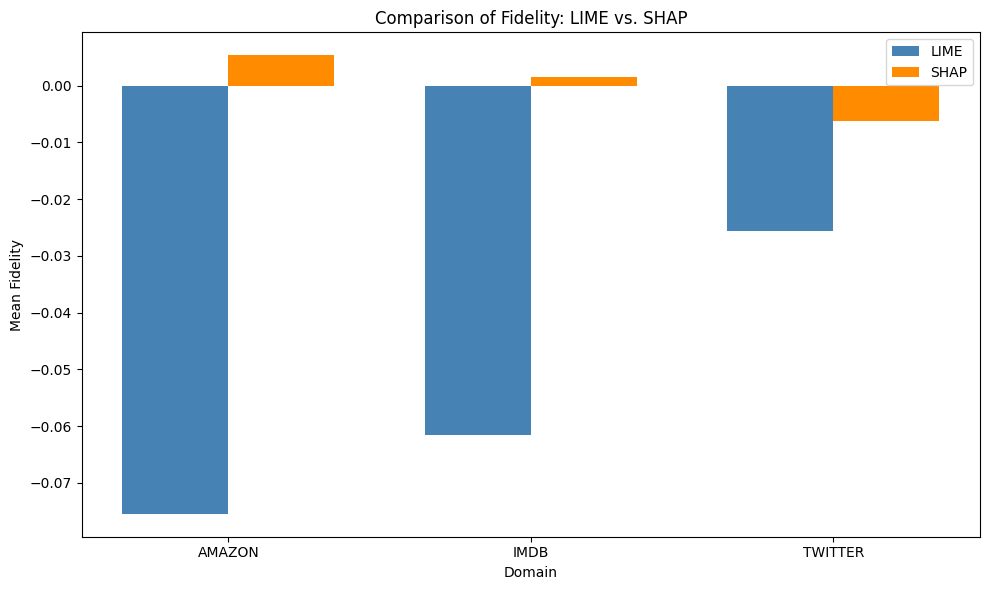

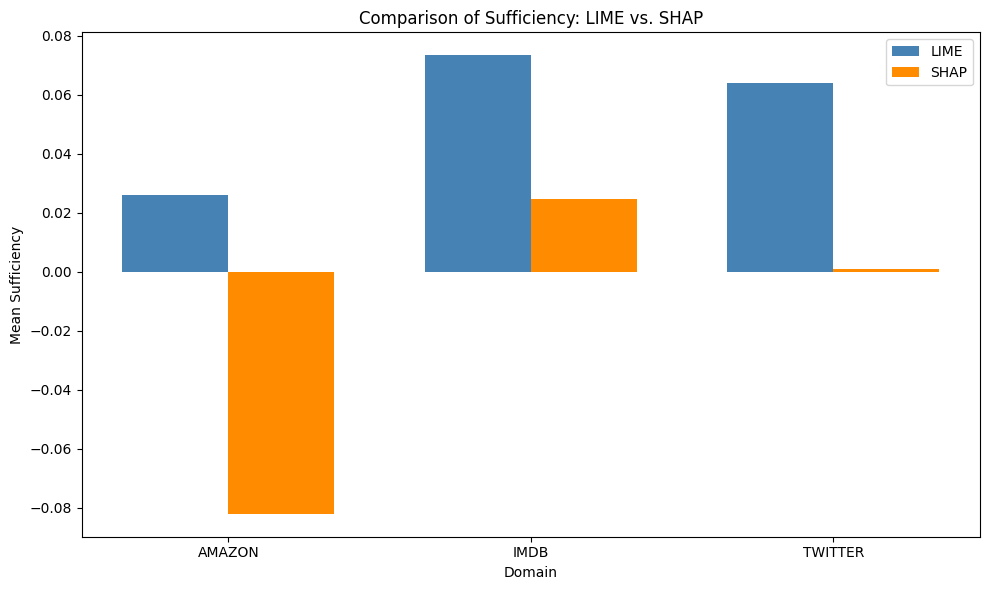

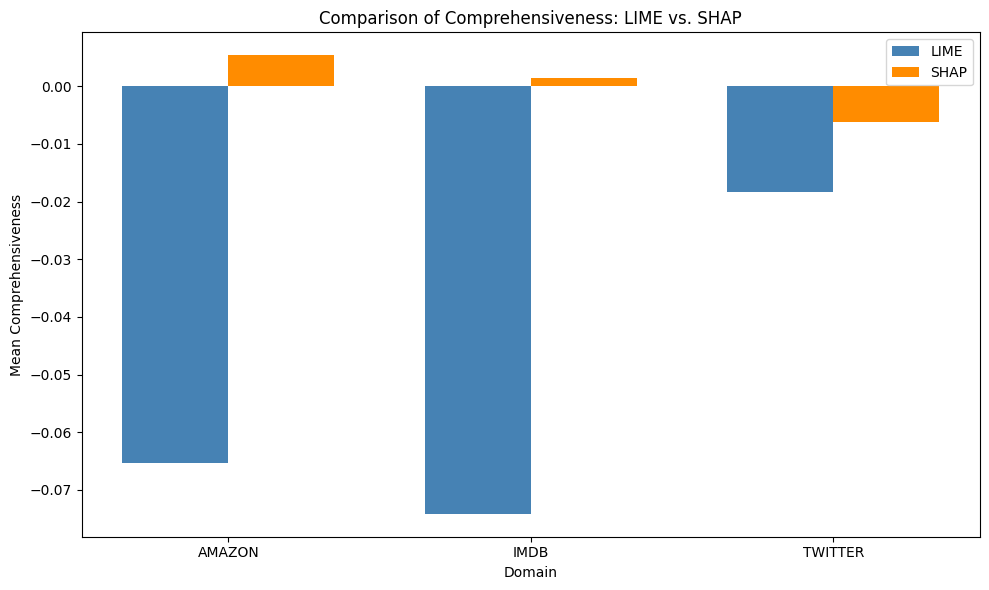

In [84]:
import json
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Define the directory and load aggregated evaluation results.
save_dir = "ExplanationFiles"
evaluation_filepath = os.path.join(save_dir, "final_evaluation_results.json")

with open(evaluation_filepath, "r", encoding="utf-8") as f:
    results = json.load(f)

def plot_local_comparison(metric, lime_key, shap_key, title, ylabel, filename):
    """
    Plots a grouped bar chart comparing LIME and SHAP for a given metric.
    Expects that results[lime_key] and results[shap_key] are dictionaries mapping domain ->
    {"Mean <metric>": value, "Std Dev": value}.
    """
    domains = []
    lime_means = []
    lime_stds = []
    shap_means = []
    shap_stds = []

    lime_data = results.get(lime_key, {})
    shap_data = results.get(shap_key, {})

    # Assuming both dictionaries have the same domain keys.
    for domain in sorted(lime_data.keys()):
        domains.append(domain.upper())
        lime_means.append(float(lime_data[domain].get("Mean " + metric, 0)))
        lime_stds.append(float(lime_data[domain].get("Std Dev", 0)))
        shap_means.append(float(shap_data.get(domain, {}).get("Mean " + metric, 0)))
        shap_stds.append(float(shap_data.get(domain, {}).get("Std Dev", 0)))

    # Create a DataFrame for plotting.
    df = pd.DataFrame({
        "Domain": domains,
        "LIME": lime_means,
        "SHAP": shap_means
    })

    x = np.arange(len(domains))
    width = 0.35  # width of the bars

    plt.figure(figsize=(10, 6))
    plt.bar(x - width/2, df["LIME"], width, label="LIME", color="steelblue")
    plt.bar(x + width/2, df["SHAP"], width, label="SHAP", color="darkorange")

    plt.xticks(x, domains)
    plt.xlabel("Domain")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend()
    plt.tight_layout()

    output_filepath = os.path.join(save_dir, filename)
    plt.savefig(output_filepath)
    plt.show()
    print(f"Plot saved: {output_filepath}")

# -------------------------
# Comparison for Fidelity.
plot_local_comparison(metric="Fidelity",
                      lime_key="LIME Fidelity",
                      shap_key="SHAP Fidelity",
                      title="Comparison of Fidelity: LIME vs. SHAP",
                      ylabel="Mean Fidelity",
                      filename="Comparison_Fidelity_LIME_vs_SHAP.png")

# -------------------------
# Comparison for Sufficiency.
plot_local_comparison(metric="Sufficiency",
                      lime_key="LIME Sufficiency",
                      shap_key="SHAP Sufficiency",
                      title="Comparison of Sufficiency: LIME vs. SHAP",
                      ylabel="Mean Sufficiency",
                      filename="Comparison_Sufficiency_LIME_vs_SHAP.png")

# -------------------------
# Comparison for Comprehensiveness.
plot_local_comparison(metric="Comprehensiveness",
                      lime_key="LIME Comprehensiveness",
                      shap_key="SHAP Comprehensiveness",
                      title="Comparison of Comprehensiveness: LIME vs. SHAP",
                      ylabel="Mean Comprehensiveness",
                      filename="Comparison_Comprehensiveness_LIME_vs_SHAP.png")


## **9. Conclusion and Future Directions**

### **9.1 Summary of Findings**
This codebase implements an **integrated explainable AI framework** for sentiment analysis, leveraging multiple explanation-generation techniques. The framework fine-tunes a **DistilBERT classifier** on IMDb, Amazon, and Twitter sentiment datasets and integrates **generative (GPT-based), local (LIME and SHAP), and abstractive summarization (DistilBART)** explanation methods.

The key findings include:
- **High Predictive Performance:** The classifier achieves strong accuracy and F1 scores across structured (IMDb, Amazon) and informal (Twitter) datasets.
- **Multi-Layered Explanations:** The framework provides **narrative** overviews via GPT, **local token-level insights** via LIME/SHAP, and **summarized explanations** via DistilBART.
- **Robust Evaluation:** Explanation quality is assessed using **BLEU, ROUGE, BERTScore, Fidelity, Sufficiency, and Comprehensiveness**, demonstrating the strengths and trade-offs of different methods.

### **9.2 Key Contributions**
This implementation advances **explainable AI** by:
- **Combining Local & Global Explanations**: Addressing the limitations of individual methods by integrating multiple explanation-generation techniques.
- **Introducing a Unified Explanation Function**: Generating **structured, multi-faceted insights** that improve model transparency.
- **Providing a Reproducible & Modular Codebase**: Ensuring that every component, from preprocessing to evaluation, is fully documented and configurable.

### **9.3 Limitations & Future Work**
While this framework presents a **robust explainability approach**, certain areas warrant further exploration:
- **Improving Explanation Consistency**: Some inconsistencies exist in SHAP/LIME token attributions, requiring refinement in perturbation techniques.
- **Enhancing Abstractive Summarization**: Current summarization scores (BLEU, ROUGE) indicate room for optimization in coherence and relevance.
- **Reducing Computational Overhead**: Integrating multiple explanation methods increases processing time, necessitating efficiency improvements for real-time applications.
- **Expanding Multimodal Interpretability**: The current system is **text-only**; future iterations could incorporate **image/audio** sentiment analysis with **explainable multimodal AI**.

### **9.4 Ethical Considerations**
- **Bias & Fairness:** The classifier is trained on English-language datasets; additional steps are needed to ensure fairness across **diverse demographics**.
- **Transparency & Reproducibility:** The implementation adheres to **open-source principles**, enabling further research and adaptation.
- **Privacy & Security:** All datasets used are publicly available, ensuring compliance with **ethical AI standards**.

### **9.5 Final Remarks**
This codebase lays a **strong foundation** for **interpretable sentiment analysis**, demonstrating that **high performance and explainability are not mutually exclusive**. By integrating multiple explanation techniques, the framework **enhances model trustworthiness**, making it suitable for **high-stakes decision-making** in domains like finance, healthcare, and policy-making.

The insights gained from this work open avenues for **adaptive AI explanations, multimodal interpretability, and real-time explainability frameworks**, driving the next frontier of **trustworthy AI**.
